#  Countries and crime categories
## Anastassia Käärmann

Analysis of crime trends over time and across countries, comparison of each country’s main crime types with the European average, and identification of the most significant crime types by year. In addition, examining relationships between different crime categories and identifying overall patterns across years.

Key outcomes of the analysis:
- Crime trends over the years for each ICCS category
- Top5 countries with the highest rates for each crime type
- Top crime categories for each country
- Structural Shifts: How traditional crime (theft, robbery) is being replaced by modern offenses (cybercrime, drugs)
- Country Profiles: "Criminal Fingerprints" (radar charts) that categorize countries based on specific risk types (Physical/Institutional/Social Sensitivity)
- Statistical anomalies: How reporting rates and legal definitions (e.g., in Sweden or small countries like Liechtenstein) change the overall data picture
-------------------------------------------------------------------------------------------

Step 1: Cleaning and organizing the data so that the graphs are easier to understand.

In [2]:
import pandas as pd
df = pd.read_csv("../data/cleanedDatasets/nan_rows/country_names_changed/police_recorded_offences_by_offence_category_new.tsv", sep="\t")
df.head(10)

,freq,iccs,unit,geo,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,A,ICCS0101,NR,Albania,88.0,82.0,118.0,124.0,125.0,107.0,98.0,54.0,71.0,52.0,51.0,58.0,52.0,61.0,42.0,34.0
1,A,ICCS0101,NR,Austria,58.0,51.0,61.0,80.0,88.0,63.0,43.0,42.0,49.0,61.0,73.0,74.0,54.0,59.0,65.0,75.0
2,A,ICCS0101,NR,Bosnia and Herzegovina,66.0,67.0,54.0,49.0,60.0,46.0,49.0,56.0,42.0,34.0,36.0,37.0,42.0,31.0,34.0,35.0
3,A,ICCS0101,NR,Belgium,204.0,189.0,189.0,214.0,206.0,204.0,210.0,231.0,175.0,198.0,192.0,147.0,149.0,157.0,185.0,162.0
4,A,ICCS0101,NR,Bulgaria,172.0,150.0,148.0,128.0,141.0,109.0,112.0,126.0,79.0,95.0,92.0,81.0,67.0,89.0,76.0,74.0
5,A,ICCS0101,NR,Switzerland,54.0,51.0,53.0,46.0,45.0,57.0,41.0,57.0,45.0,45.0,50.0,46.0,47.0,42.0,42.0,53.0
6,A,ICCS0101,NR,Cyprus,9.0,19.0,7.0,8.0,19.0,11.0,10.0,12.0,11.0,7.0,14.0,13.0,15.0,14.0,7.0,10.0
7,A,ICCS0101,NR,Czechia,113.0,105.0,105.0,83.0,95.0,90.0,81.0,88.0,65.0,40.0,55.0,81.0,57.0,46.0,79.0,68.0
8,A,ICCS0101,NR,Germany,656.0,721.0,699.0,689.0,619.0,623.0,645.0,655.0,747.0,738.0,632.0,586.0,719.0,631.0,614.0,661.0
9,A,ICCS0101,NR,Denmark,53.0,56.0,49.0,49.0,43.0,41.0,62.0,52.0,53.0,61.0,54.0,54.0,51.0,42.0,59.0,53.0


In [3]:
iccs_mapping = {
    "ICCS0101": "Intentional homicide",
    "ICCS0102": "Attempted intentional homicide",
    "ICCS02011": "Assault",
    "ICCS020111": "Serious assault",
    "ICCS020221": "Kidnapping",
    "ICCS0301" : "Sexual violence",
    "ICCS03011" : "Rape",
    "ICCS03012" : "Sexual Assault",
    "ICCS030221" : "Child pornography",
    "ICCS0302" : "Sexual exploitation",
    "ICCS0401": "Robbery",
    "ICCS0501": "Burglary",
    "ICCS05012": "Burglary of private residential premises",
    "ICCS0502": "Theft",
    "ICCS05021": "Theft of a motorized vehicle or parts thereof",
    "ICCS050211": "Theft of a motorized land vehicle",
    "ICCS0601" : "Unlawful acts involving controlled drugs",
    "ICCS0701" : "Fraud",
    "ICCS0703" : "Corruption",
    "ICCS07031" : "Bribery",
    "ICCS07041" : "Money laundering",
    "ICCS0903" : "Acts against computer systems",
    "ICCS09051" : "Participation in an organized criminal group",
    "ICCS1001" : "Acts that cause environmental pollution or degradation",
    "ICCS1004" : "Acts that result in the depletion or degradation of natural resources",
    "ICCS1002" : "Acts involving the movement or dumping of waste",
    "ICCS1003" : "Trade or possession of protected or prohibited species of fauna and flora",
    "ICCS02-04": "Serious violent crimes (aggregate)",
    "TOTAL": "Total offences"
}

# asendan väärtused iccs veerus
df['iccs'] = df['iccs'].replace(iccs_mapping)

display(df[['geo', 'iccs']].head(10))

,geo,iccs
0,Albania,Intentional homicide
1,Austria,Intentional homicide
2,Bosnia and Herzegovina,Intentional homicide
3,Belgium,Intentional homicide
4,Bulgaria,Intentional homicide
5,Switzerland,Intentional homicide
6,Cyprus,Intentional homicide
7,Czechia,Intentional homicide
8,Germany,Intentional homicide
9,Denmark,Intentional homicide


In [4]:
print("Kõik unikaalsed kuriteoliigid, mis on tabelis olemas:")
print(df['iccs'].unique())

print("\nSuvalised 10 rida:")
display(df.sample(10))

Kõik unikaalsed kuriteoliigid, mis on tabelis olemas:
['Intentional homicide' 'Attempted intentional homicide' 'Serious assault'
 'Kidnapping' 'Sexual violence' 'Rape' 'Sexual Assault'
 'Sexual exploitation' 'Child pornography' 'Robbery' 'Burglary'
 'Burglary of private residential premises' 'Theft'
 'Theft of a motorized vehicle or parts thereof'
 'Unlawful acts involving controlled drugs' 'Fraud' 'Corruption' 'Bribery'
 'Money laundering' 'Acts against computer systems'
 'Participation in an organized criminal group'
 'Acts that cause environmental pollution or degradation'
 'Acts involving the movement or dumping of waste'
 'Trade or possession of protected or prohibited species of fauna and flora'
 'Acts that result in the depletion or degradation of natural resources']

Suvalised 10 rida:


,freq,iccs,unit,geo,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
41,A,Intentional homicide,P_HTHAB,Albania,2.78,2.57,NaN,4.38,NaN,NaN,3.38,1.86,2.46,1.81,1.78,2.03,1.83,2.16,1.50,1.23
306,A,Kidnapping,P_HTHAB,Slovakia,0.06,0.11,0.07,0.07,0.13,1.44,1.53,1.57,1.88,1.64,1.69,1.74,0.97,0.99,0.88,0.85
1262,A,Corruption,NR,Montenegro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.00,76.00,242.00,172.00,154.00,178.00,336.00,104.00
1552,A,Participation in an organized criminal group,P_HTHAB,Lithuania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.07,0.32,0.00,0.36,0.18,0.21,0.14
994,A,Theft,P_HTHAB,Romania,202.92,241.67,227.51,220.99,282.30,287.50,824.15,545.72,466.08,489.47,514.10,344.08,321.16,335.96,311.37,334.48
1408,A,Money laundering,NR,Serbia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.00,37.00,137.00,175.00,114.00,226.00,182.00,NaN
160,A,Serious assault,NR,Bosnia and Herzegovina,1474.00,NaN,505.00,652.00,618.00,577.00,592.00,992.00,1009.00,752.00,909.00,725.00,640.00,755.00,505.00,793.00
750,A,Robbery,P_HTHAB,North Macedonia,22.39,29.14,29.42,24.94,22.77,22.69,14.76,13.44,11.97,20.11,NaN,18.44,12.72,13.29,17.53,16.12
841,A,Burglary,P_HTHAB,Scotland,491.63,455.71,476.83,458.70,405.46,418.64,386.08,329.26,303.15,279.42,253.40,NaN,NaN,NaN,NaN,NaN
685,A,Robbery,NR,Austria,4786.00,4577.00,4310.00,4066.00,4092.00,3737.00,3481.00,3416.00,3103.00,2610.00,2396.00,2628.00,2137.00,2118.00,2536.00,2678.00


In [5]:
# 1.vaatan, mis veergude nimed tegelikult on
print("--- Diagnostika ---")
print("Esimesed 10 veerunime praegu:", df.columns[:10].tolist())

test_aastad = [col for col in df.columns if str(col).isdigit()]
print(f"Olemas on {len(test_aastad)} aasta-veergu.")

--- DIAGNOSTIKA ---
Esimesed 10 veerunime praegu: ['freq', 'iccs', 'unit', 'geo', '2008 ', '2009 ', '2010 ', '2011 ', '2012 ', '2013 ']
Olemas on 0 aasta-veergu.


In [6]:
# Eemaldan kõikidest veerunimedest tühikud
df.columns = df.columns.str.strip()
print("Parandatud veerud:", df.columns[:10].tolist())

Parandatud veerud: ['freq', 'iccs', 'unit', 'geo', '2008', '2009', '2010', '2011', '2012', '2013']


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. leian aasta veerud
aasta_veerud = [col for col in df.columns if str(col).isdigit()]

# 2. teen Melt operatsiooni (Laiast pikaks)
# Jätan alles 'geo', 'iccs', 'unit' ja tõstan kõik aastad ühte veergu 'year'
df_long = df.melt(
    id_vars=['geo', 'iccs', 'unit'],
    value_vars=aasta_veerud,
    var_name='year',
    value_name='value'
)

# 3. Teen aasta ja väärtuse numbriliseks
df_long['year'] = pd.to_numeric(df_long['year'])
df_long['value'] = pd.to_numeric(df_long['value'], errors='coerce')

# 4. Defineerin filtrid (mida eirata)
ignore_geo = ['EU27_2020', 'EA19', 'EA20', 'European Union', 'Euro area', 'Kosovo']
ignore_crimes = ['Total offences', 'Serious violent crimes (aggregate)']

# Puhastan lõpuks ka andmed
df_long = df_long[~df_long['geo'].isin(ignore_geo)]
df_long = df_long[~df_long['iccs'].isin(ignore_crimes)]

print("Andmed on nüüd pikas formaadis")
display(df_long.head(10))

Andmed on nüüd pikas formaadis


,geo,iccs,unit,year,value
0,Albania,Intentional homicide,NR,2008,88.0
1,Austria,Intentional homicide,NR,2008,58.0
2,Bosnia and Herzegovina,Intentional homicide,NR,2008,66.0
3,Belgium,Intentional homicide,NR,2008,204.0
4,Bulgaria,Intentional homicide,NR,2008,172.0
5,Switzerland,Intentional homicide,NR,2008,54.0
6,Cyprus,Intentional homicide,NR,2008,9.0
7,Czechia,Intentional homicide,NR,2008,113.0
8,Germany,Intentional homicide,NR,2008,656.0
9,Denmark,Intentional homicide,NR,2008,53.0


Starting with visualization: line charts that show trends and comparisons.
# Where is a specific crime the most severe issue, and is the situation improving or worsening over the years?
I select the 5 countries where this crime is among the most significant issues and observe how the situation changes over time: increasing or decreasing?

Andmestikus on 25 erinevat kuriteoliiki.
--- Analysis: Intentional homicide ---


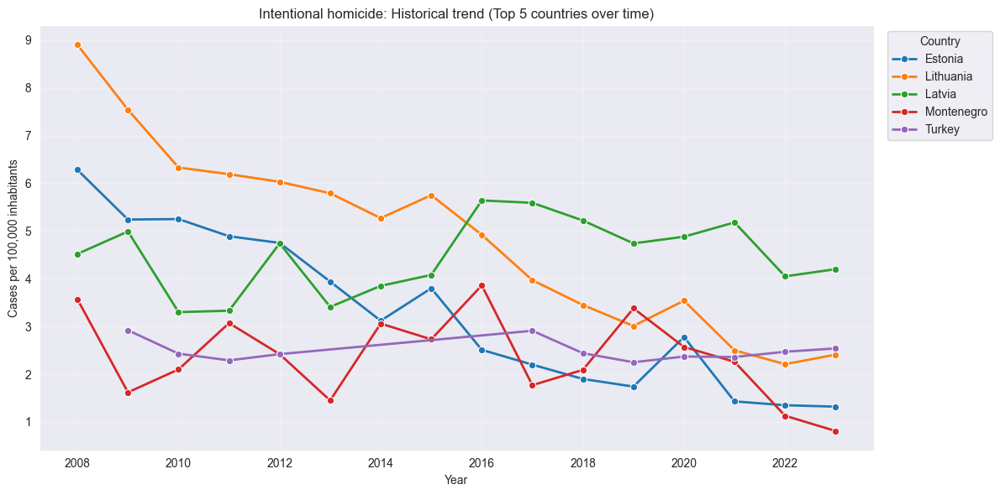



--- Analysis: Attempted intentional homicide ---


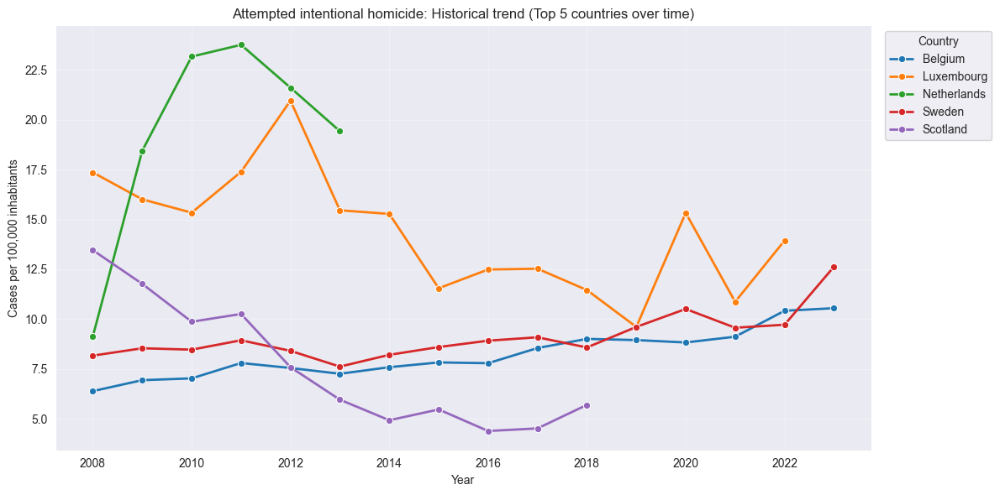



--- Analysis: Serious assault ---


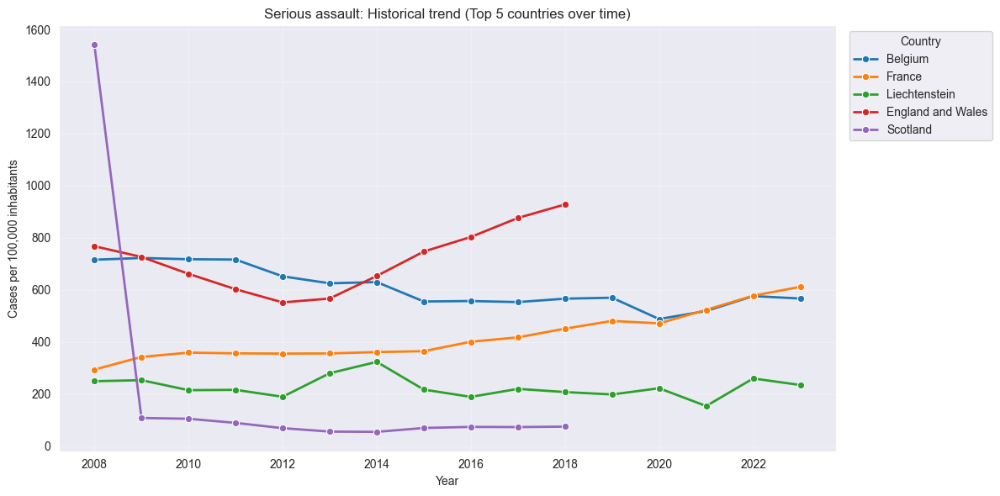



--- Analysis: Kidnapping ---


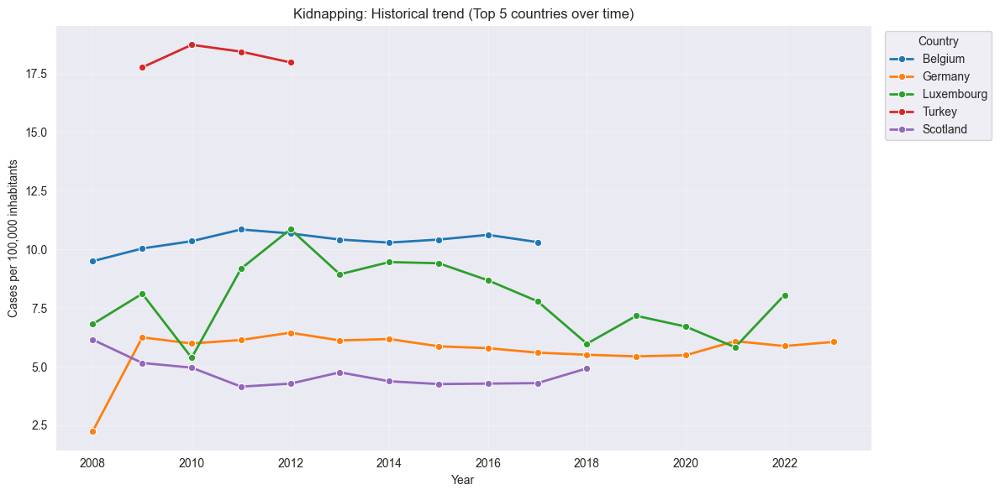



--- Analysis: Sexual violence ---


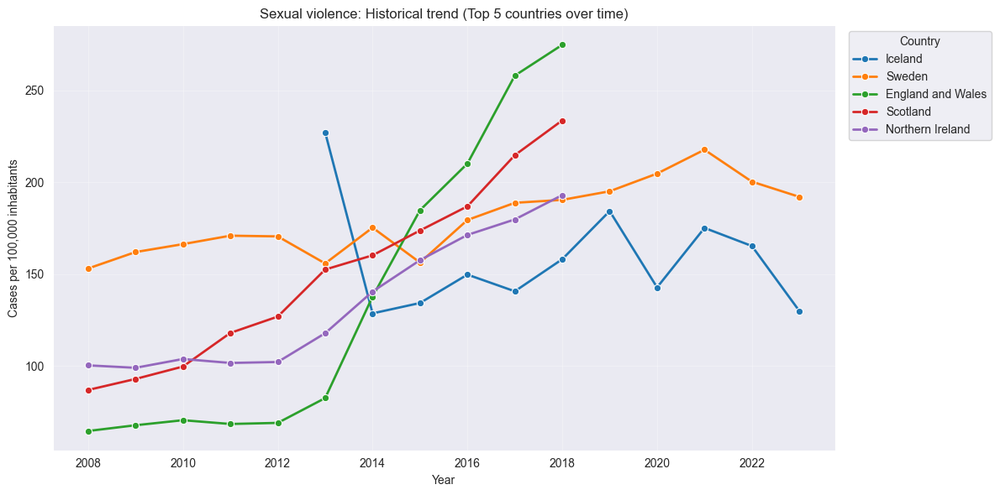



--- Analysis: Rape ---


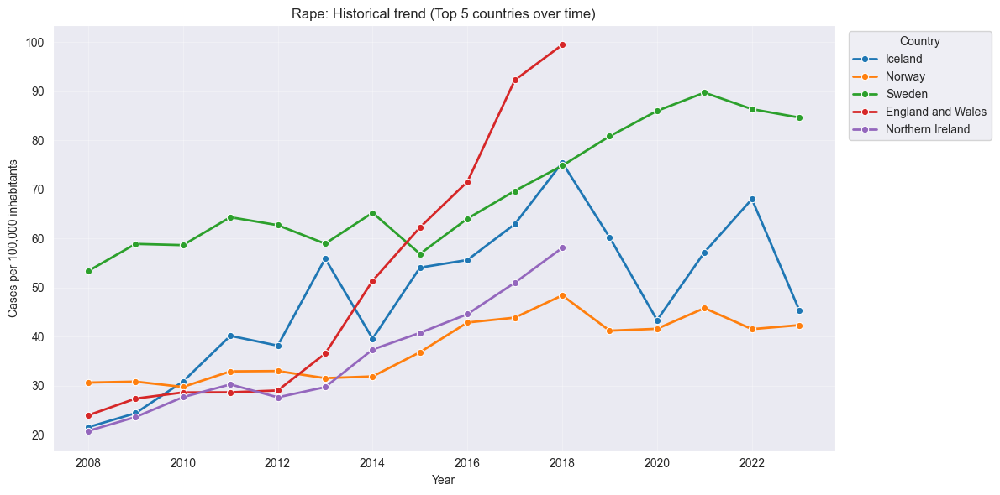



--- Analysis: Sexual Assault ---


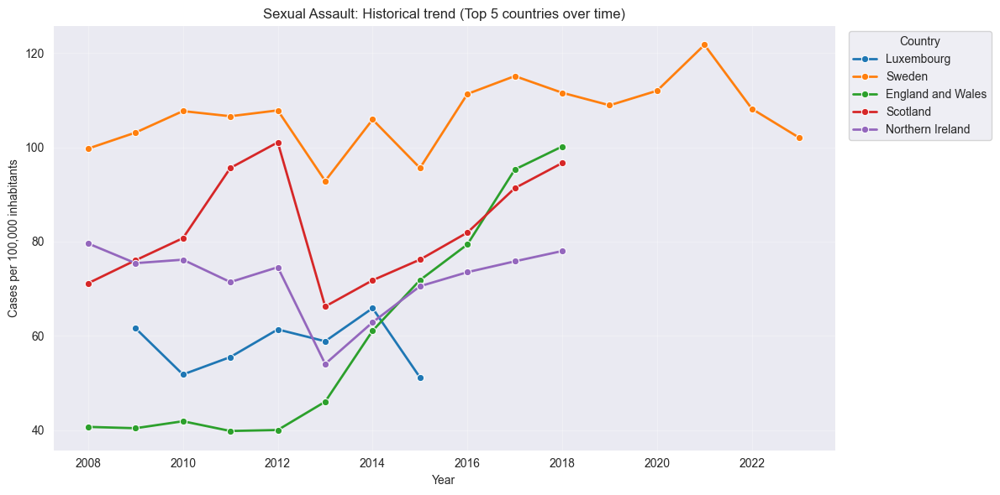



--- Analysis: Sexual exploitation ---


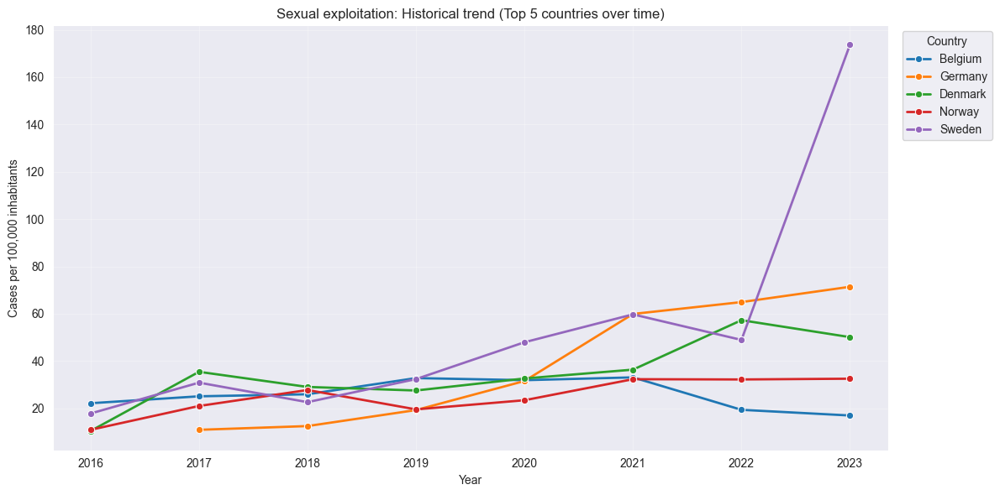



--- Analysis: Child pornography ---


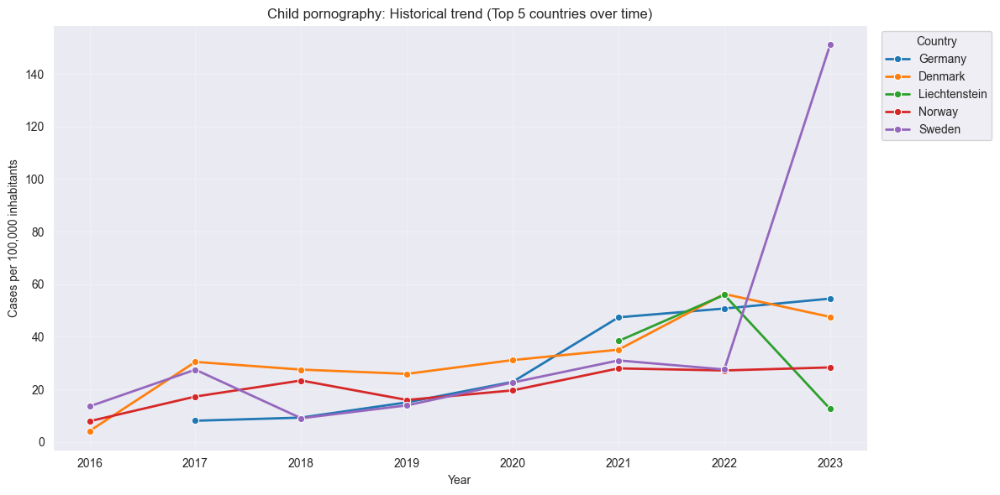



--- Analysis: Robbery ---


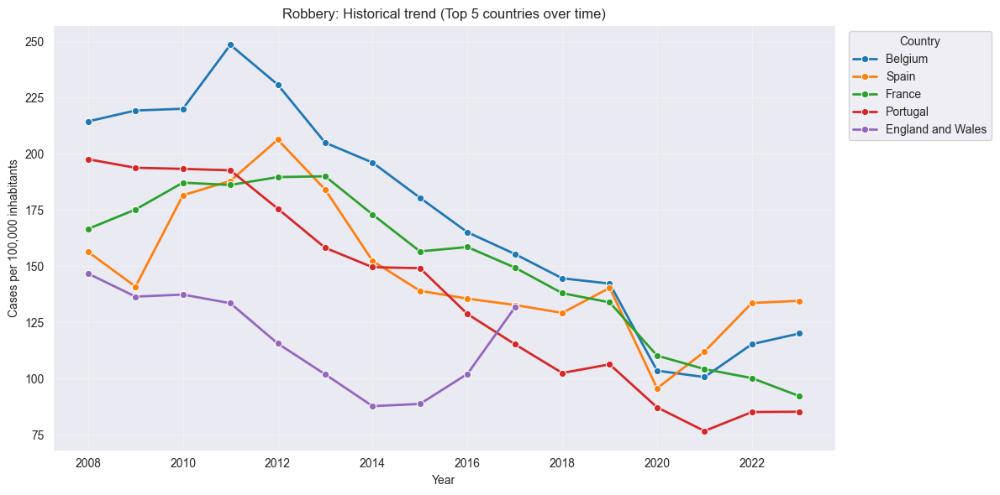



--- Analysis: Burglary ---


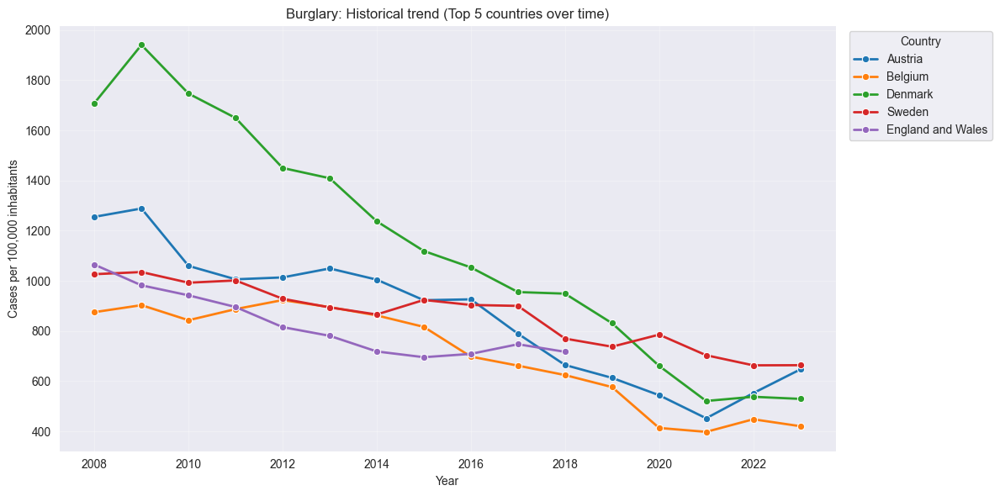



--- Analysis: Burglary of private residential premises ---


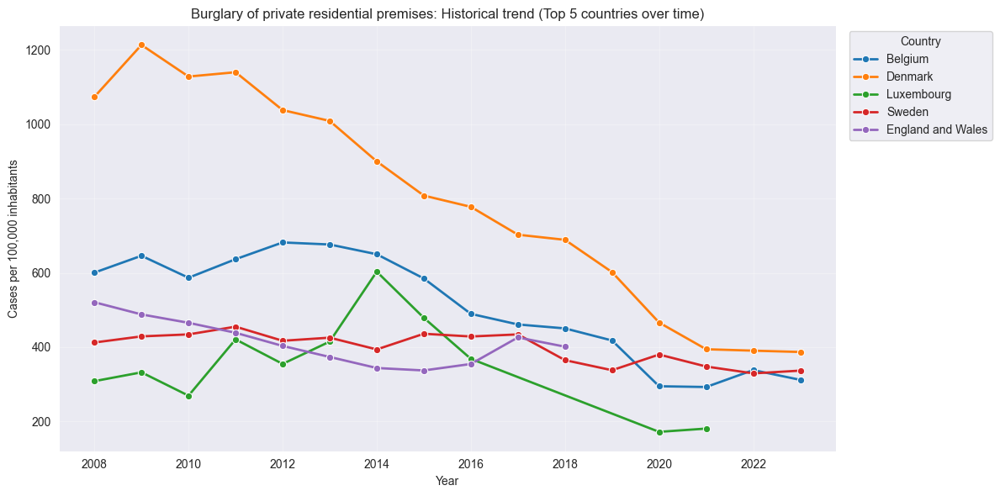



--- Analysis: Theft ---


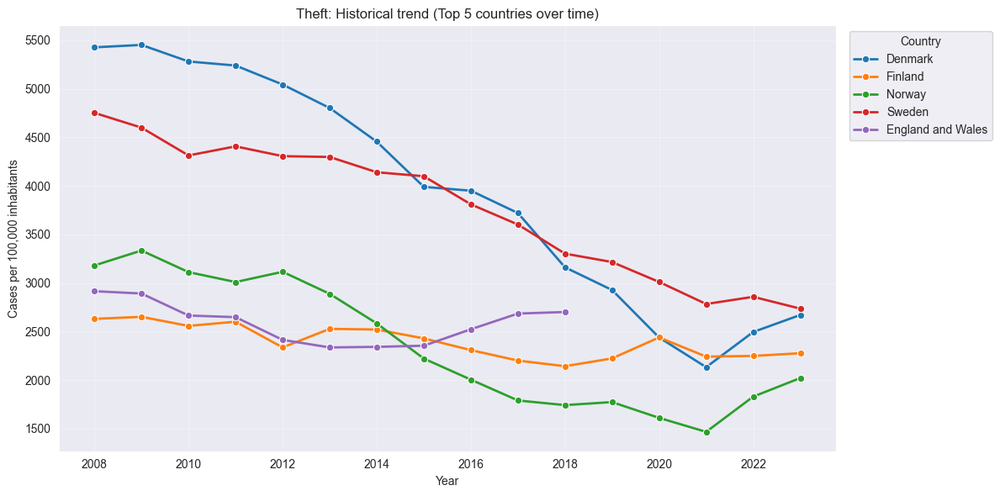



--- Analysis: Theft of a motorized vehicle or parts thereof ---


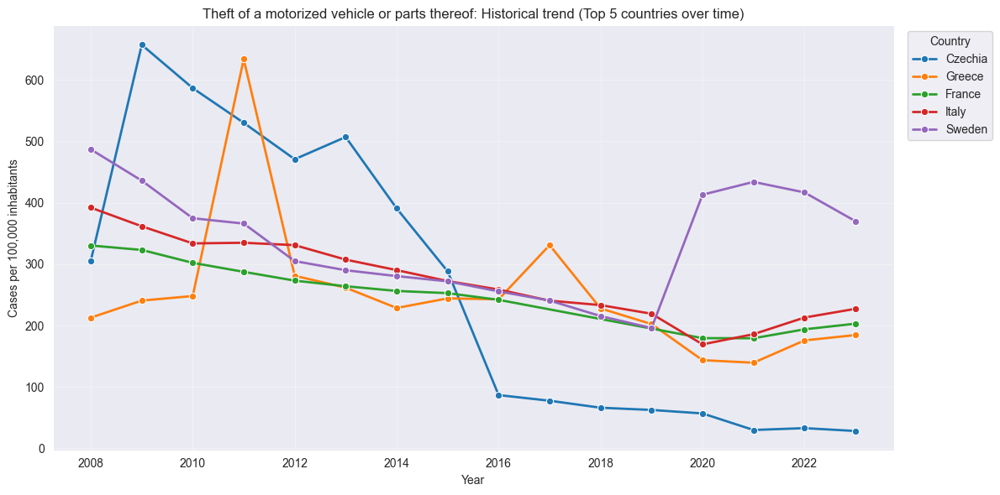



--- Analysis: Unlawful acts involving controlled drugs ---


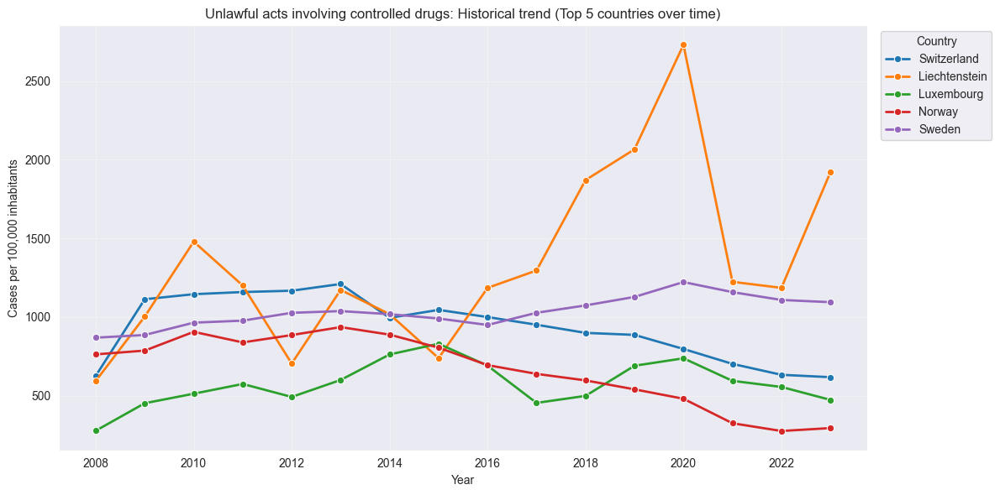



--- Analysis: Fraud ---


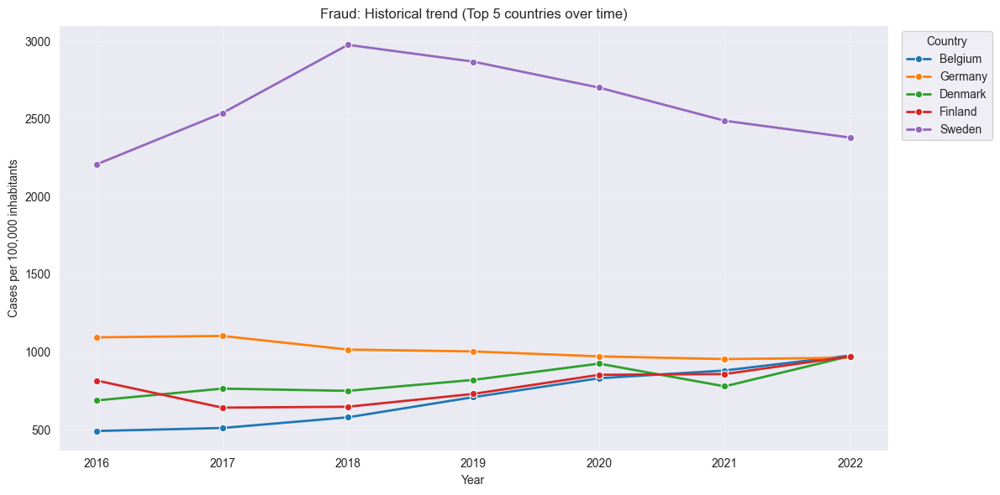



--- Analysis: Corruption ---


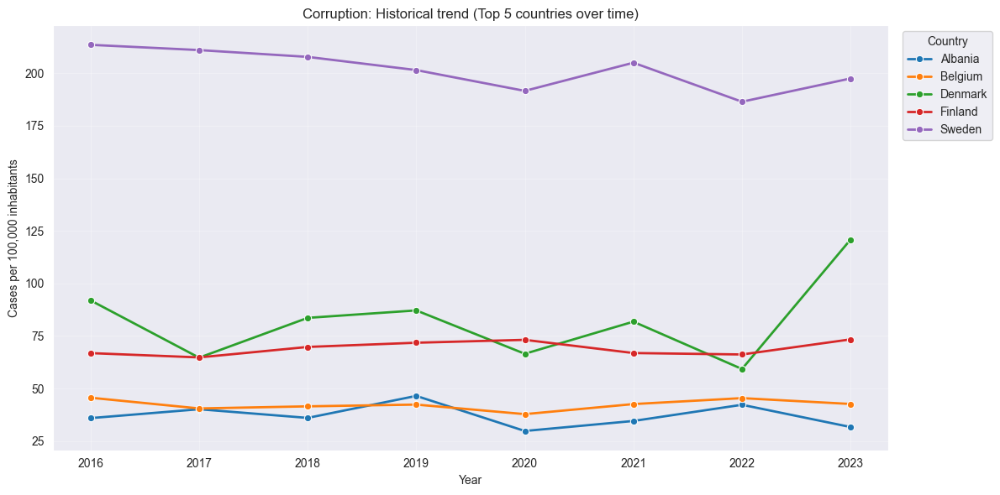



--- Analysis: Bribery ---


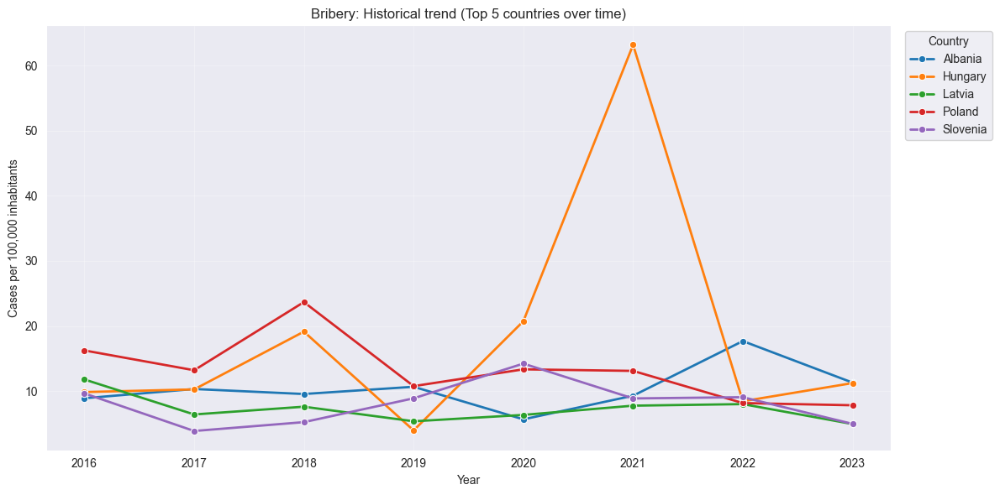



--- Analysis: Money laundering ---


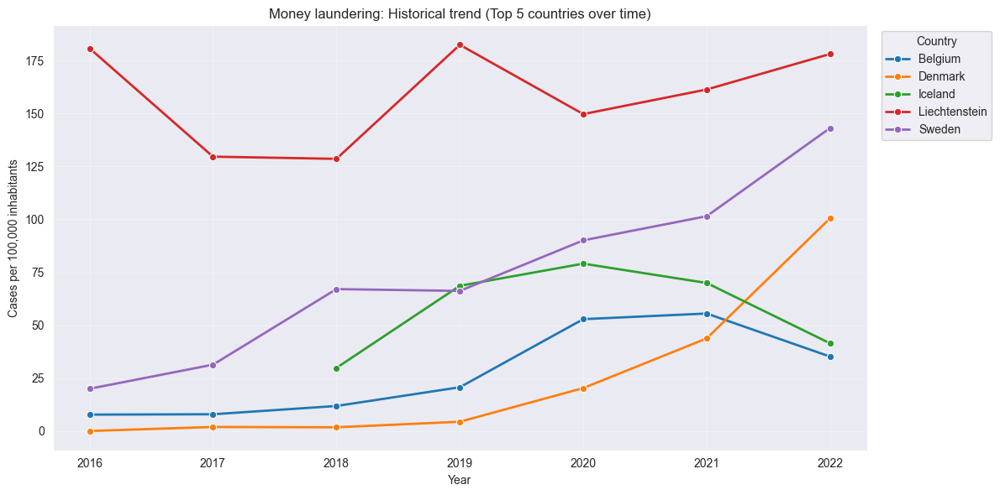



--- Analysis: Acts against computer systems ---


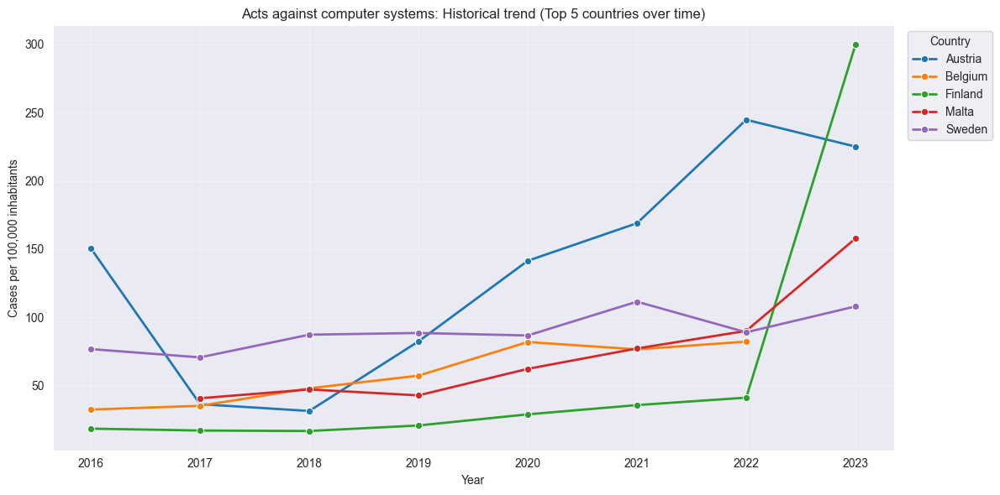



--- Analysis: Participation in an organized criminal group ---


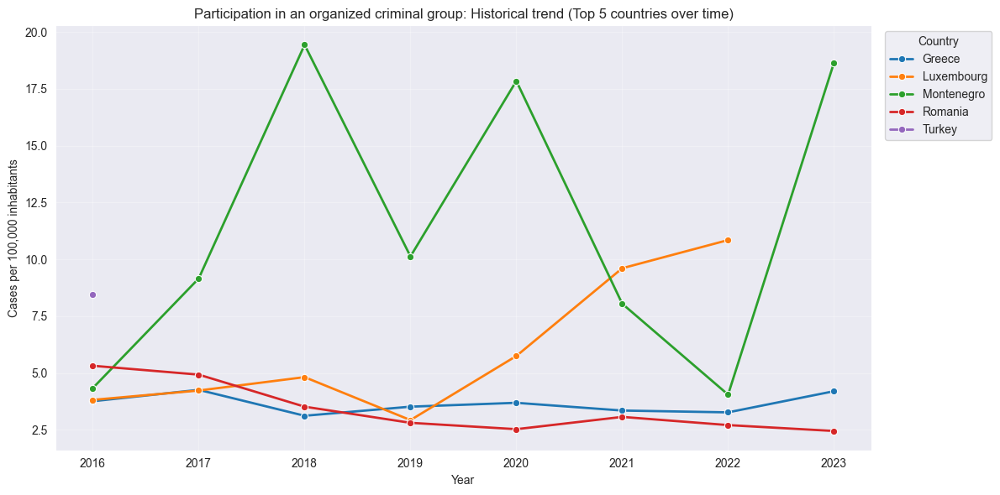



--- Analysis: Acts that cause environmental pollution or degradation ---


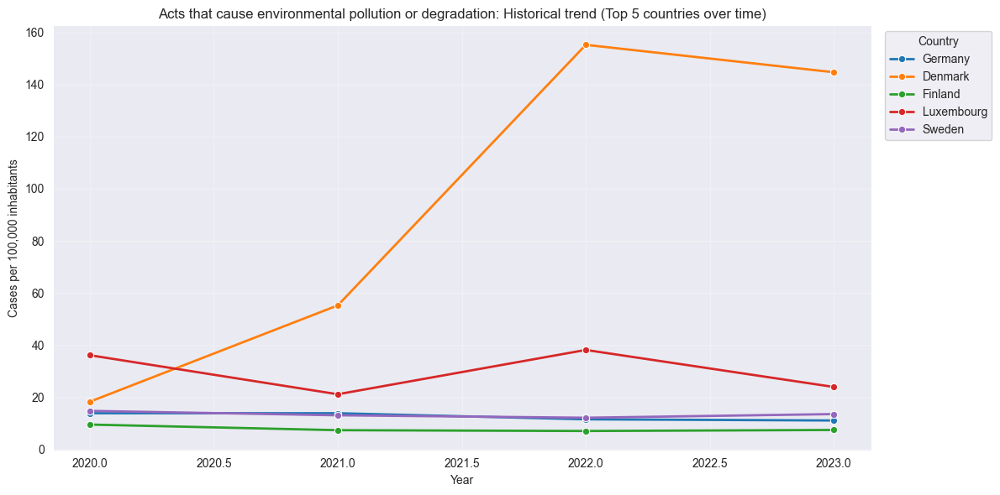



--- Analysis: Acts involving the movement or dumping of waste ---


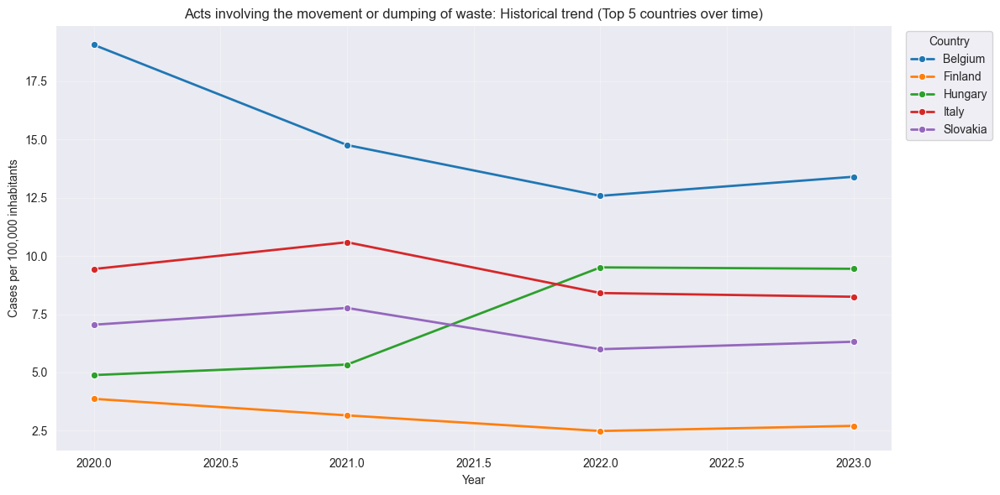



--- Analysis: Trade or possession of protected or prohibited species of fauna and flora ---


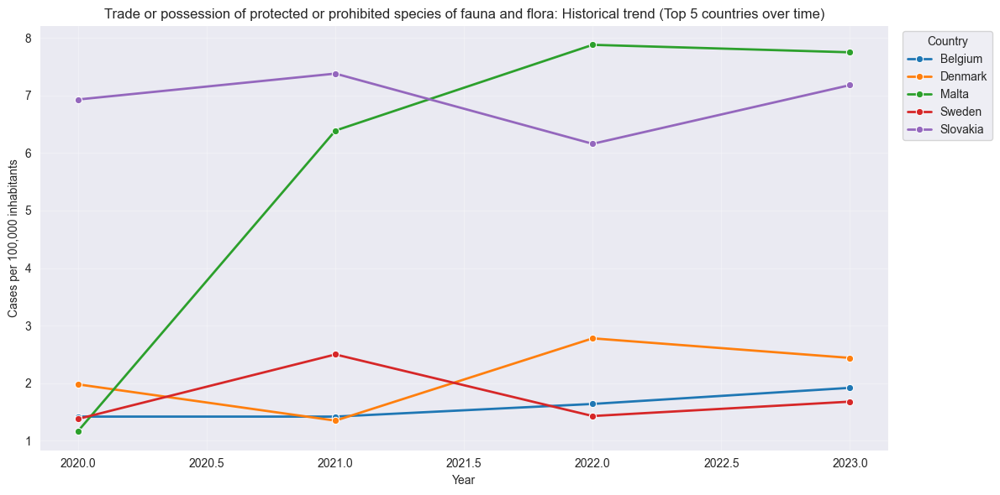



--- Analysis: Acts that result in the depletion or degradation of natural resources ---


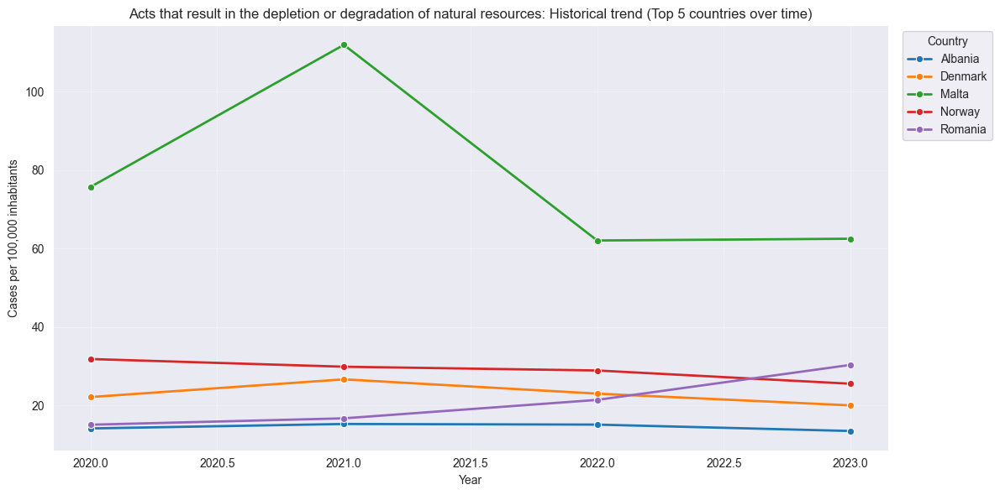

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Leian kõik unikaalsed kuriteoliigid, mis on suhtarvudena olemas
kõik_kuriteod = df_long[df_long['unit'] == 'P_HTHAB']['iccs'].unique()

print(f"Andmestikus on {len(kõik_kuriteod)} erinevat kuriteoliiki.")

def plot_crime_history(crime_name):
    # Võtan andmed
    subset = df_long[(df_long['iccs'] == crime_name) & (df_long['unit'] == 'P_HTHAB')]

    # Leian 5 riiki, mille Keskmine tase (kogu perioodil 2008-2023) on kõrgeim
    # Selle abil saan välja tuua pikaajalised "probleemsed" riigid
    top_countries = subset.groupby('geo')['value'].mean().nlargest(5).index.tolist()

    # Filtreerin siis graafiku jaoks ainult need 5 riiki
    subset_top = subset[subset['geo'].isin(top_countries)]

    plt.figure(figsize=(12, 6))
    sns.lineplot(data=subset_top, x='year', y='value', hue='geo', marker='o', linewidth=2)

    plt.title(f'{crime_name}: Historical trend (Top 5 countries over time)')
    plt.ylabel('Cases per 100,000 inhabitants')
    plt.xlabel('Year')

    # Legend
    plt.legend(title='Country', bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# 3. Tsükkel: Käin kõik kuriteod läbi
for kuritegu in kõik_kuriteod:
    print(f"--- Analysis: {kuritegu} ---")
    plot_crime_history(kuritegu)
    print("\n")

Now I want to observe each country’s profile.
# What is each country’s “Crime of the Year”?
This provides a quick overview of the country’s crime structure essentially showing which issue the police deal with the most.

In [9]:
# filtreerin andmed
# Kasutan suhtarvu (P_HTHAB), et tulemus oleks korrektne.
# Eemaldan "Total offences", sest see on alati nr 1 ja ei anna infot.
df_analysis = df_long[
    (df_long['unit'] == 'P_HTHAB') &
    (~df_long['iccs'].isin(['Total offences', 'Serious violent crimes (aggregate)'])) &
    (~df_long['geo'].isin(['EU27_2020', 'EA19', 'EA20', 'European Union', 'Euro area', 'Kosovo']))
].copy()

# eemaldan tühjad read
df_analysis = df_analysis.dropna(subset=['value'])

# leian iga Riigi ja Aasta kohta Maksimaalse väärtusega rea
# Grupeerin: Riik + Aasta -> leida indeks, kus väärtus on põhjas
idx_max = df_analysis.groupby(['geo', 'year'])['value'].idxmax()

# koostan lõpliku tabeli
# .loc võtab need indeksid välja
result_table = df_analysis.loc[idx_max, ['geo', 'year', 'iccs', 'value']]

# Sorteerin (riikide kaupa, siis aastad)
result_table = result_table.sort_values(by=['geo', 'year'])

print("Tabel: Iga riigi populaarseim kuritegu aastate lõikes")
with pd.option_context('display.max_rows', None):
    display(result_table.head(10))

Tabel: Iga riigi populaarseim kuritegu aastate lõikes


,geo,year,iccs,value
963,Albania,2008,Theft,100.88
2731,Albania,2009,Theft,96.49
6267,Albania,2011,Theft,163.19
11571,Albania,2014,Theft,274.90
13339,Albania,2015,Theft,242.98
15107,Albania,2016,Theft,196.17
16875,Albania,2017,Theft,177.15
18643,Albania,2018,Theft,188.62
20411,Albania,2019,Theft,168.84
22179,Albania,2020,Theft,111.11


Info olemas, nüüd visualiseerin

Joonistan graafikud 40 riigi kohta...



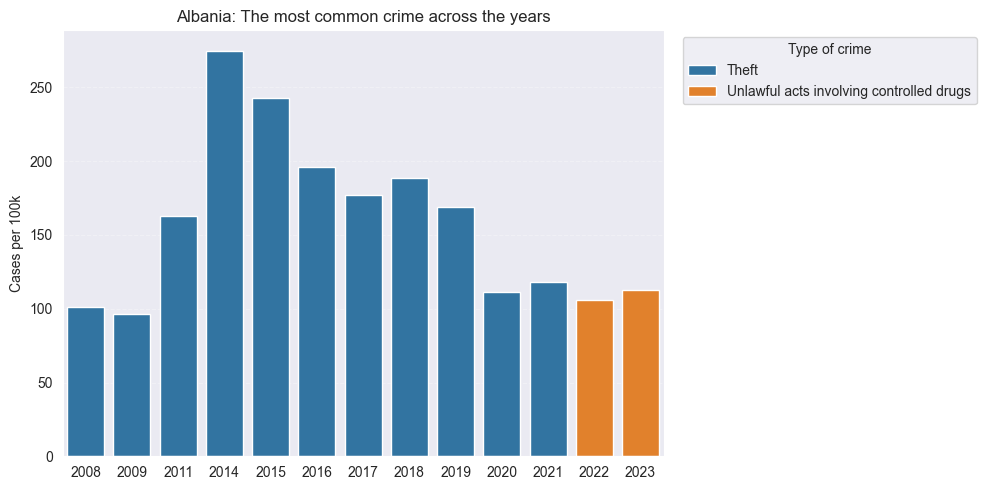

--------------------------------------------------


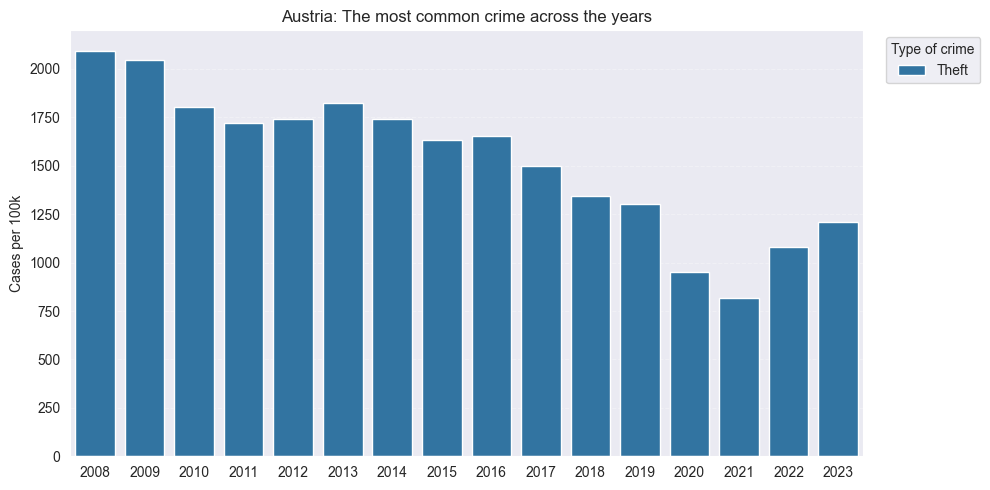

--------------------------------------------------


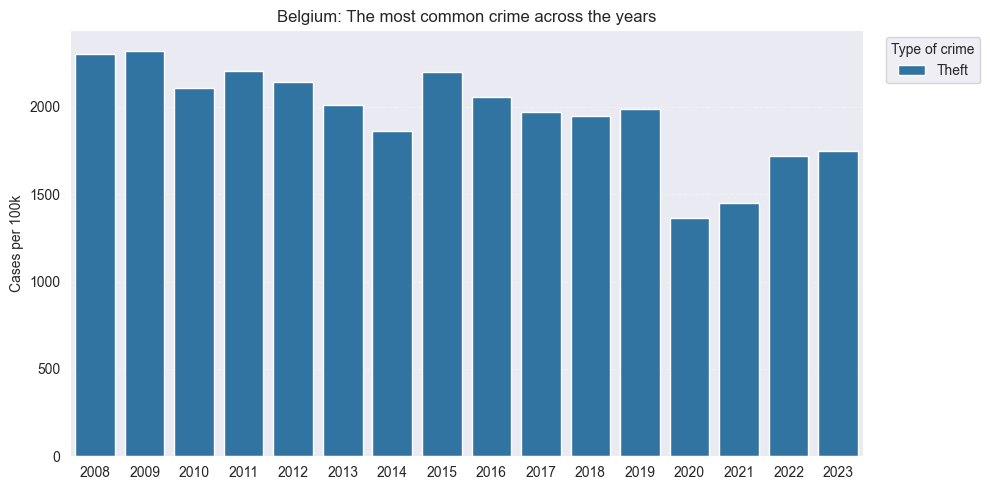

--------------------------------------------------


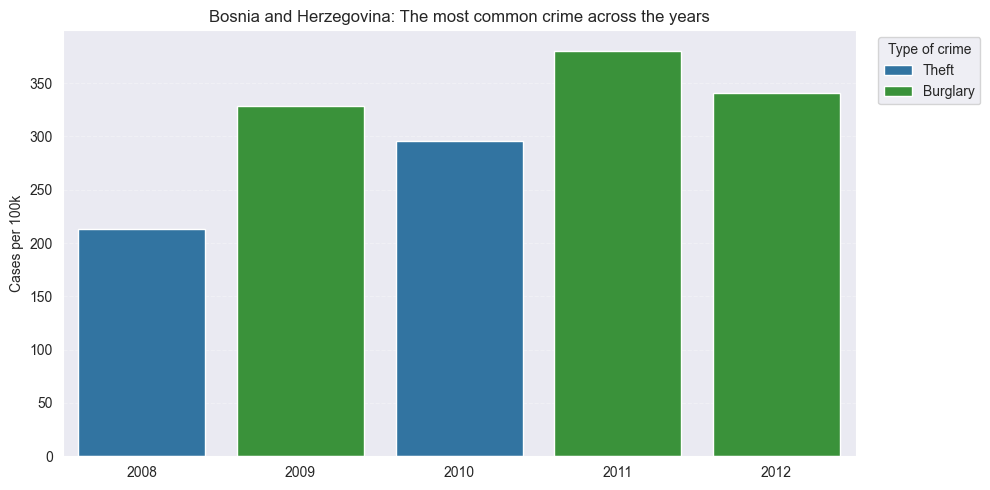

--------------------------------------------------


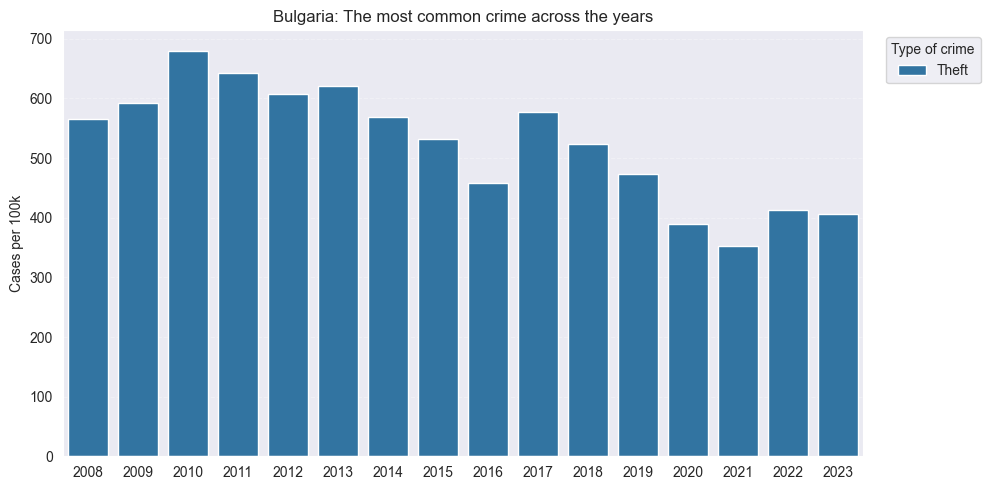

--------------------------------------------------


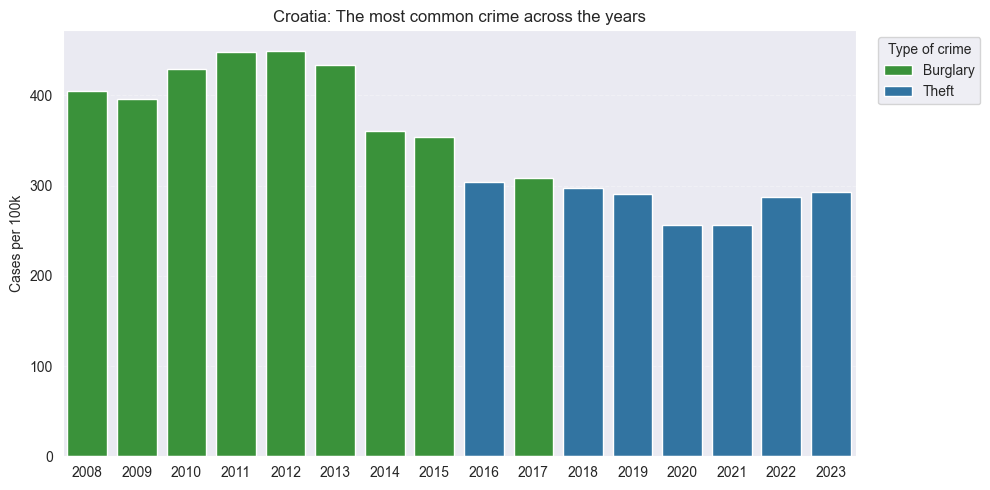

--------------------------------------------------


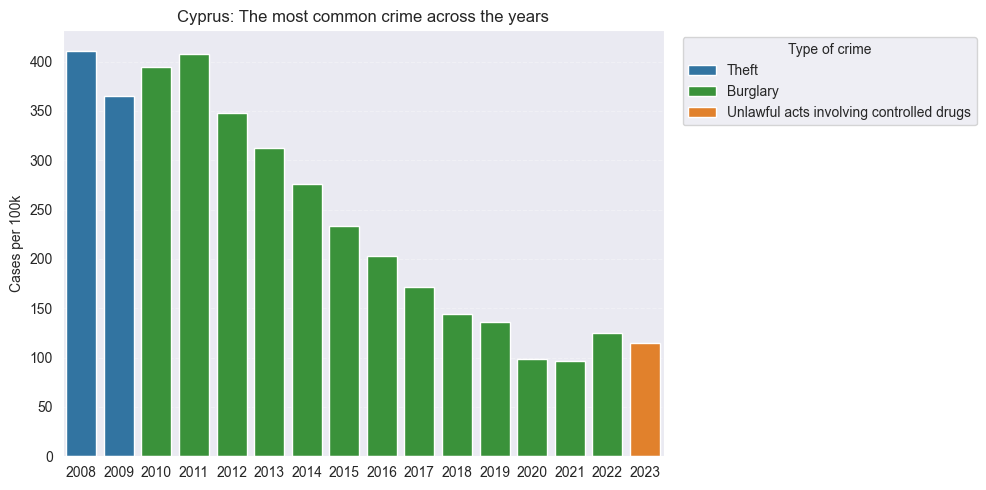

--------------------------------------------------


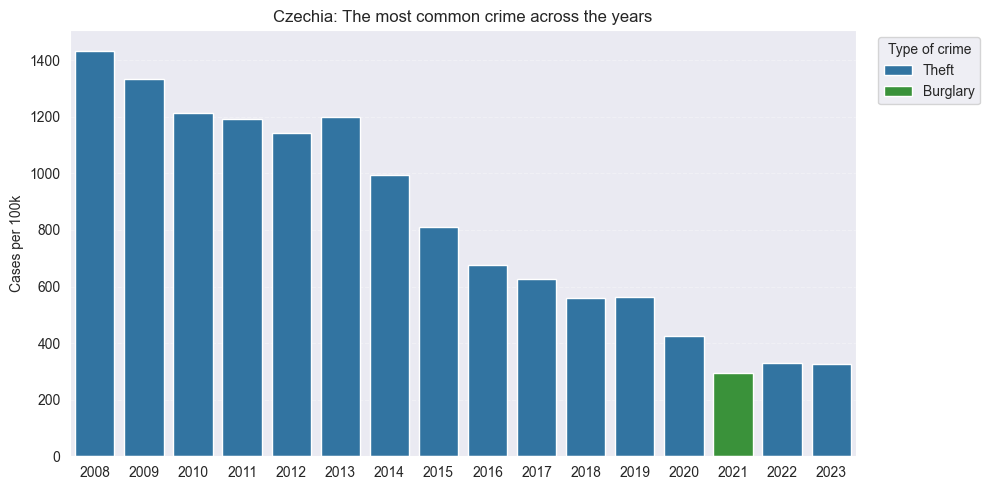

--------------------------------------------------


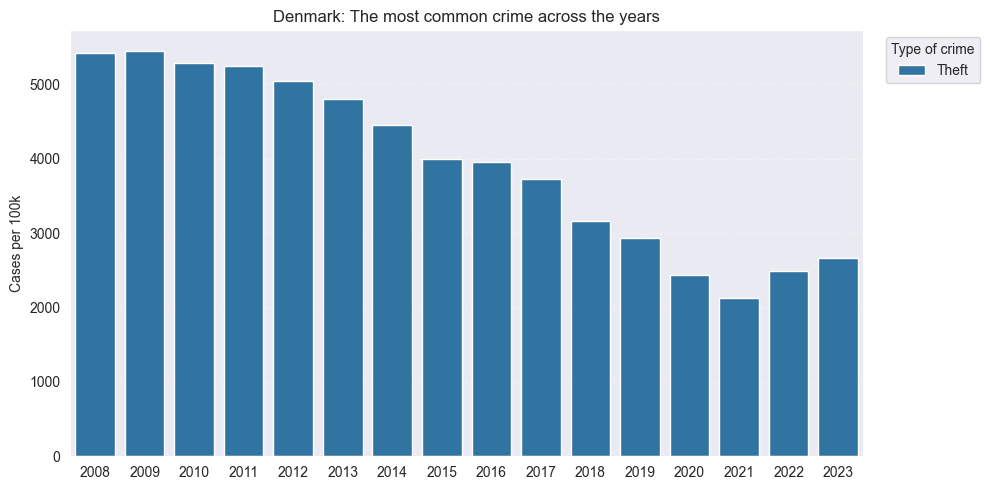

--------------------------------------------------


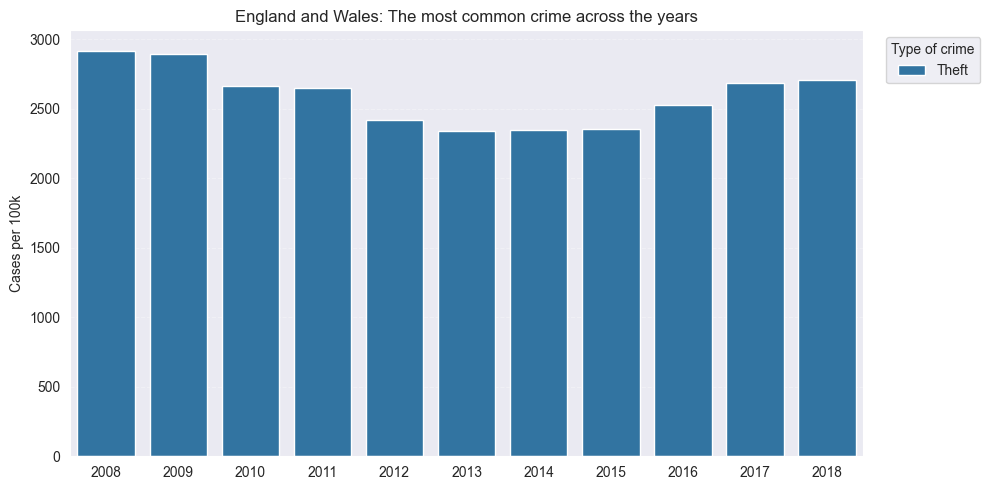

--------------------------------------------------


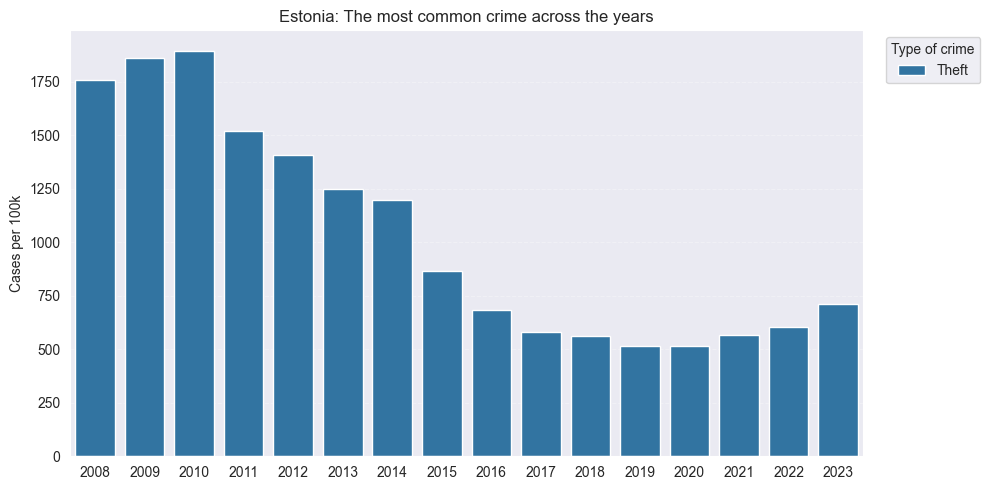

--------------------------------------------------


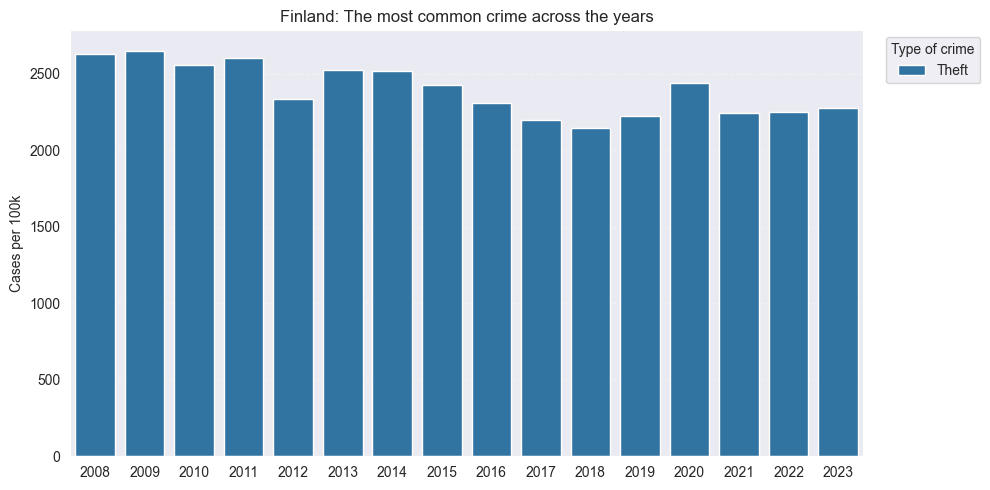

--------------------------------------------------


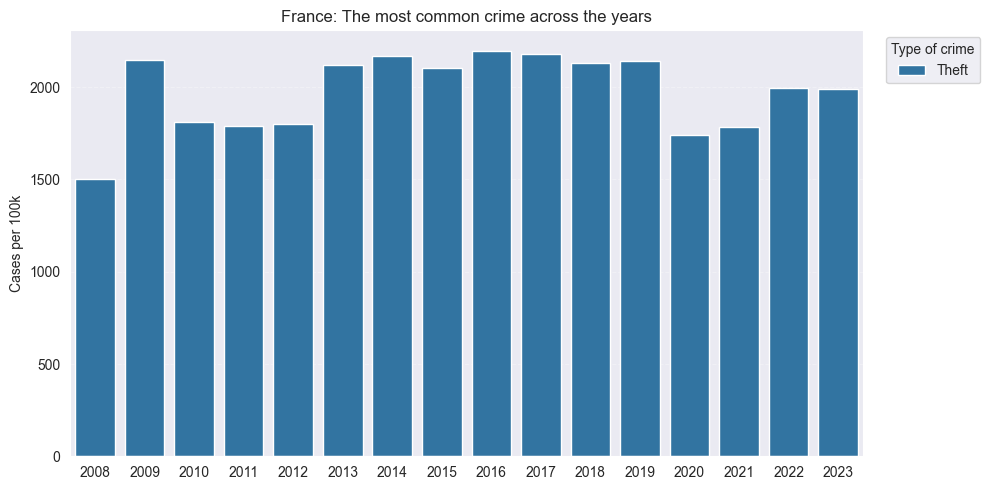

--------------------------------------------------


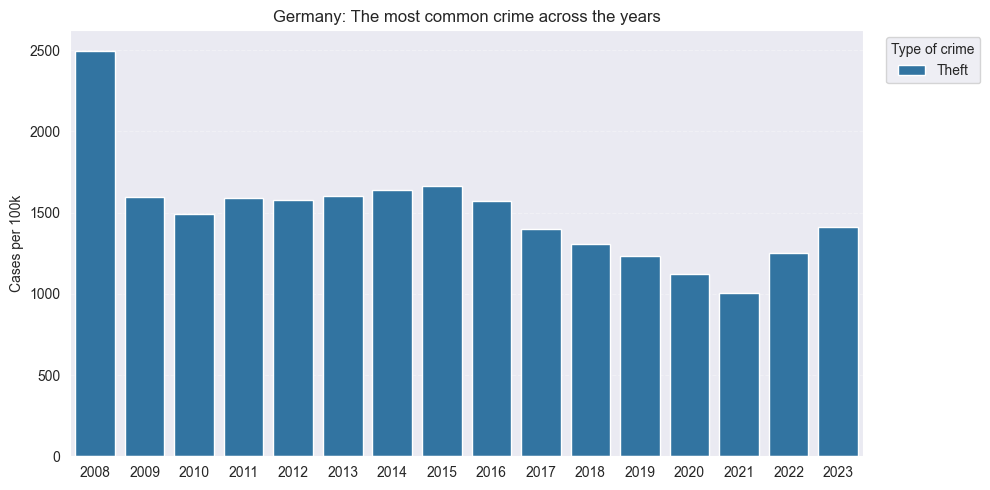

--------------------------------------------------


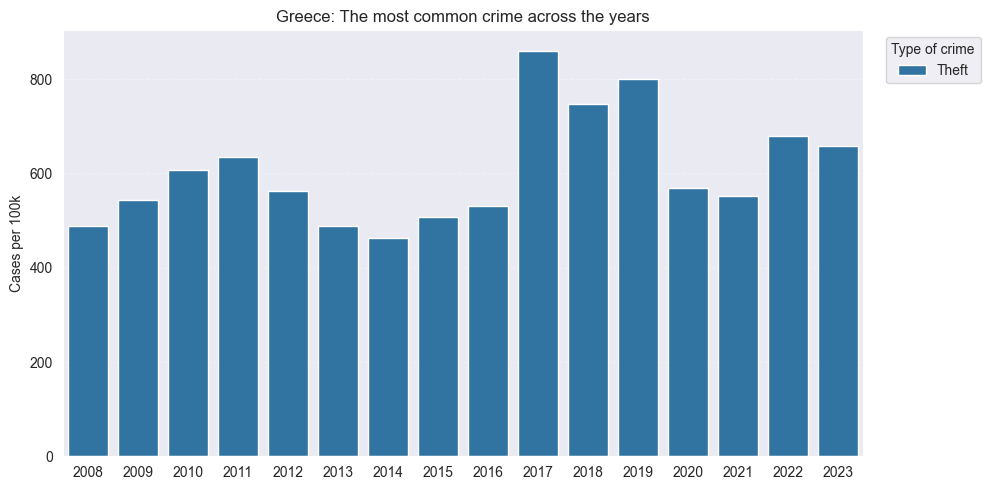

--------------------------------------------------


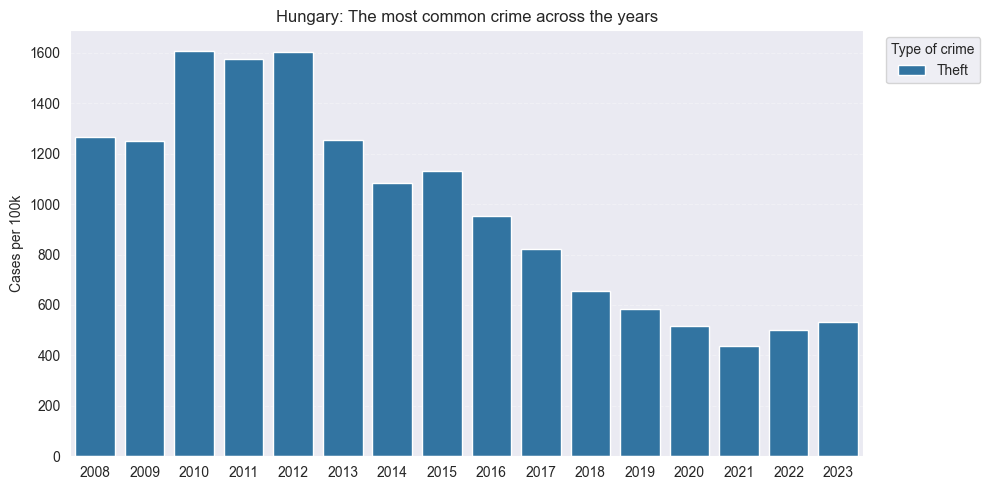

--------------------------------------------------


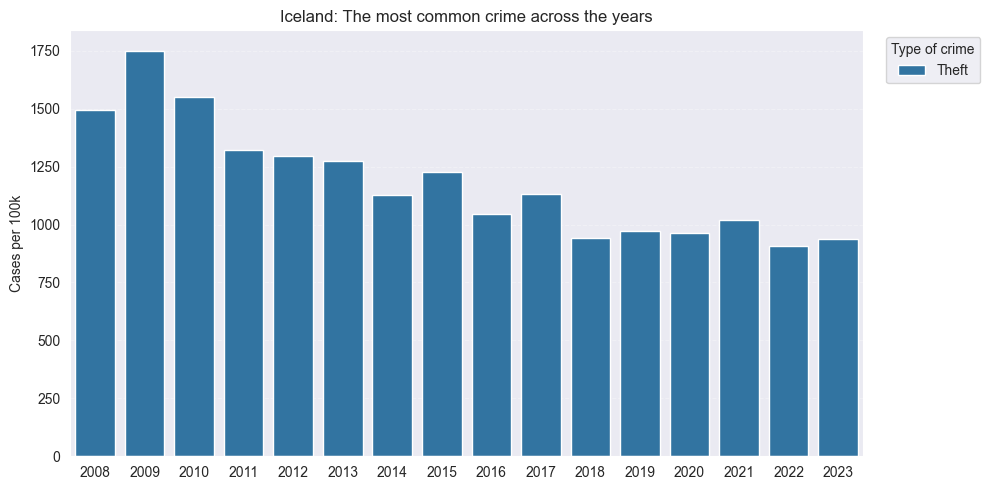

--------------------------------------------------


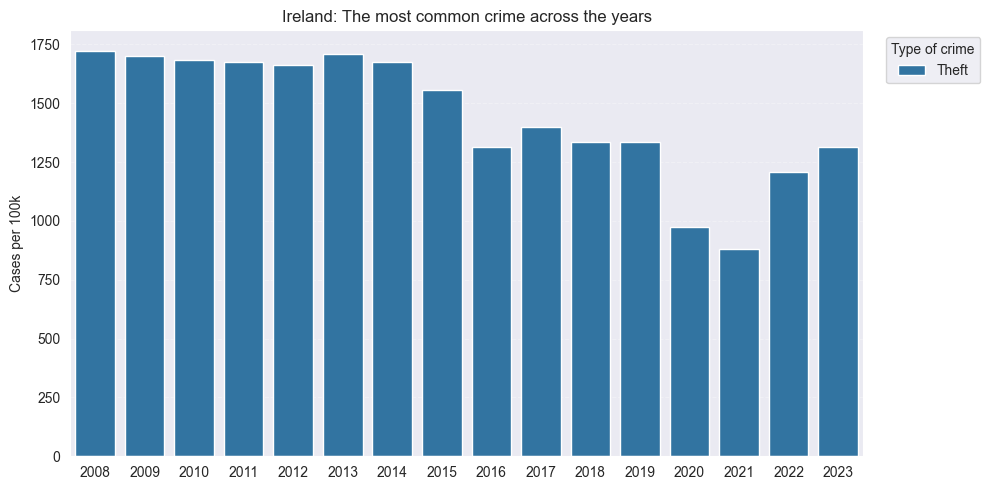

--------------------------------------------------


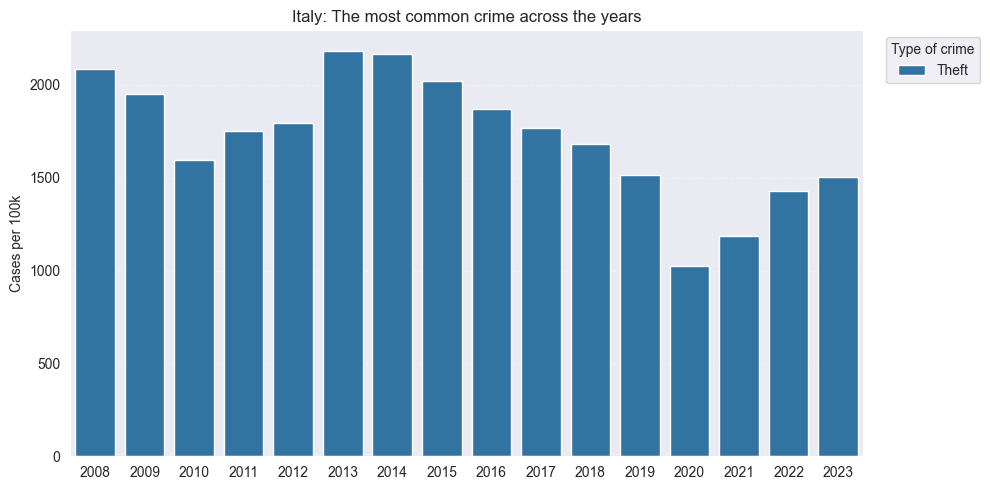

--------------------------------------------------


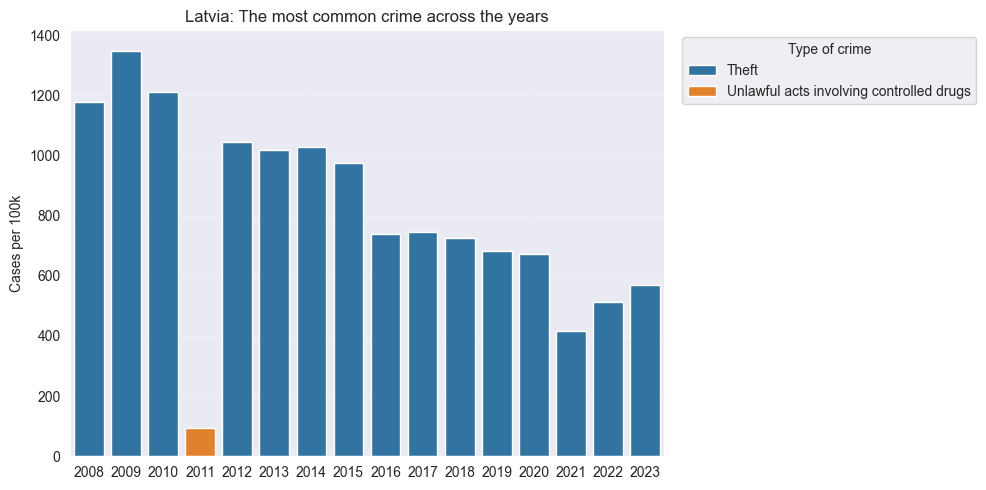

--------------------------------------------------


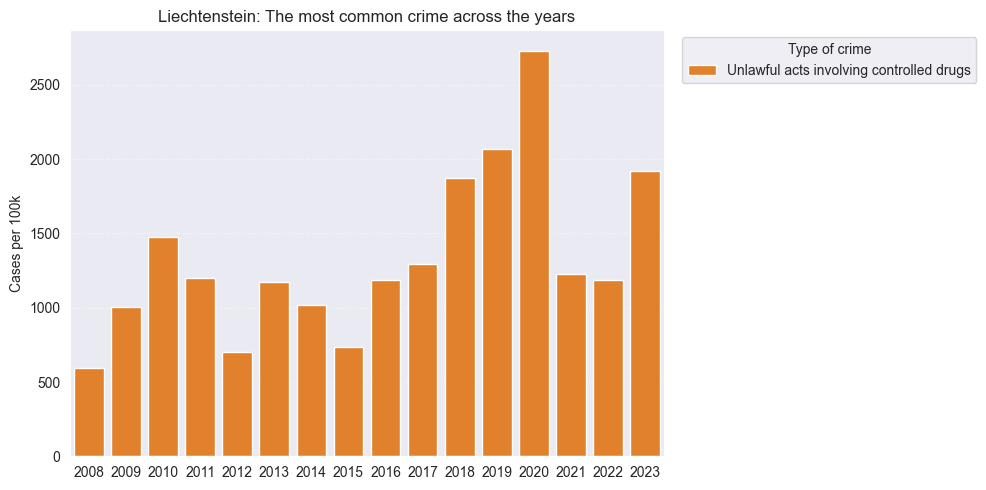

--------------------------------------------------


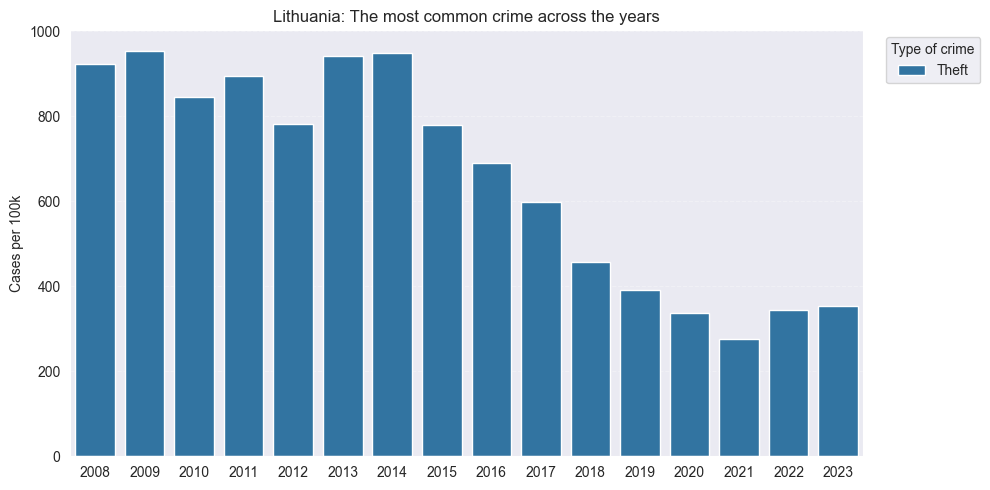

--------------------------------------------------


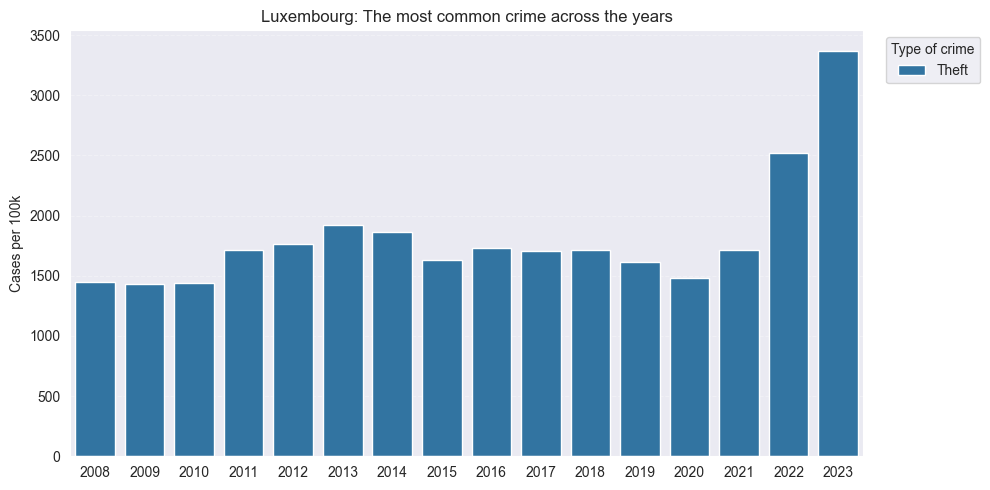

--------------------------------------------------


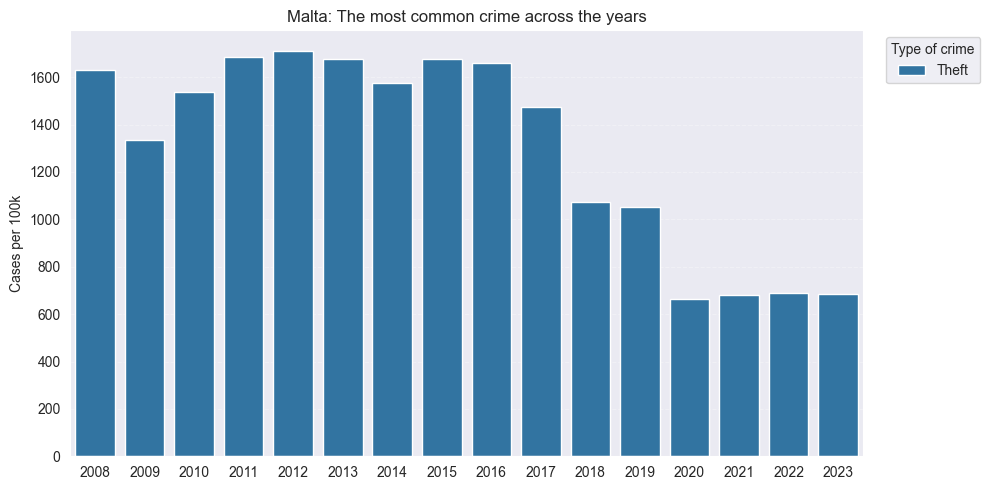

--------------------------------------------------


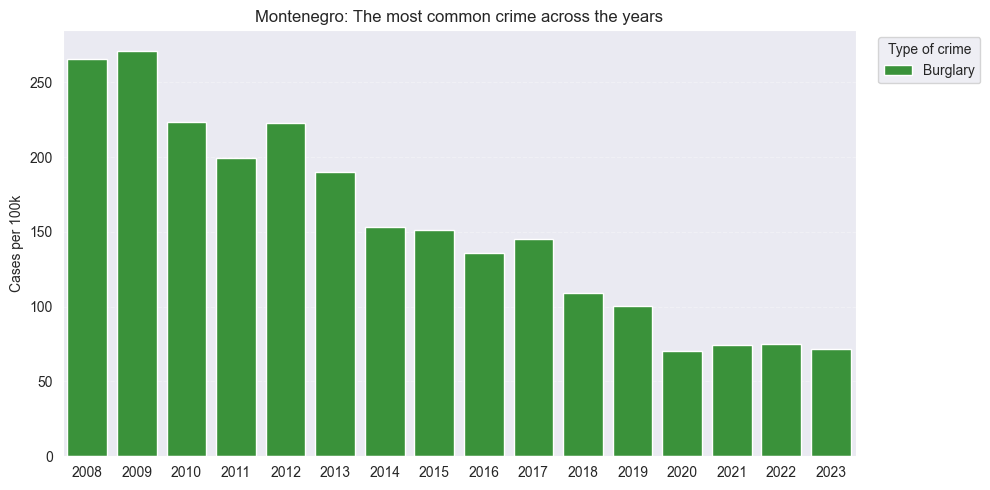

--------------------------------------------------


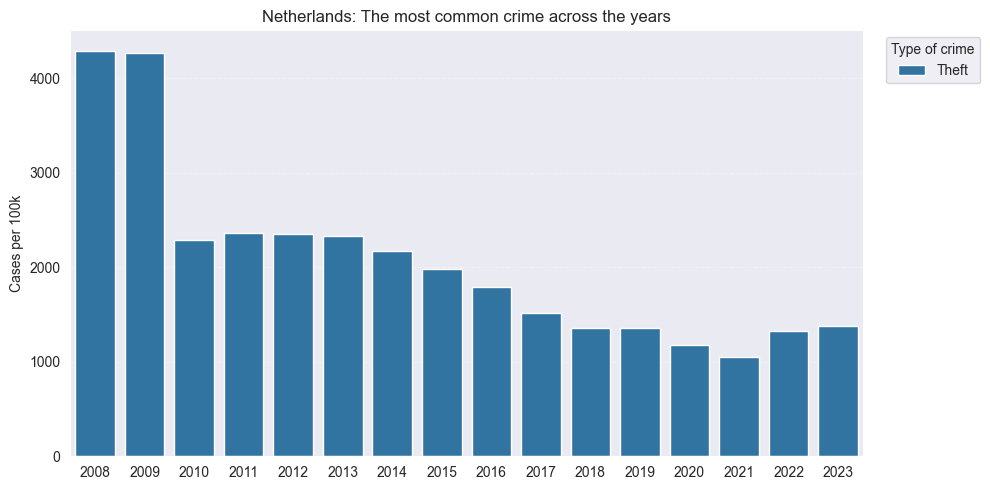

--------------------------------------------------


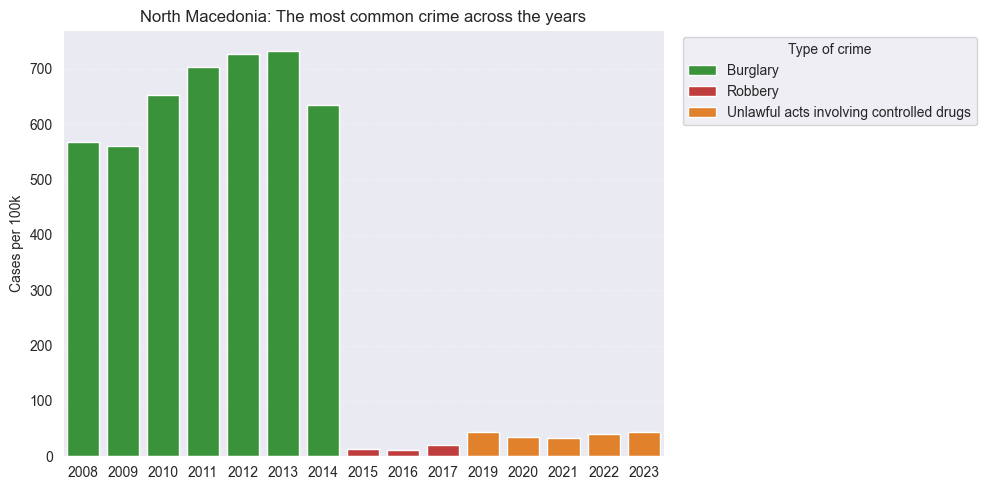

--------------------------------------------------


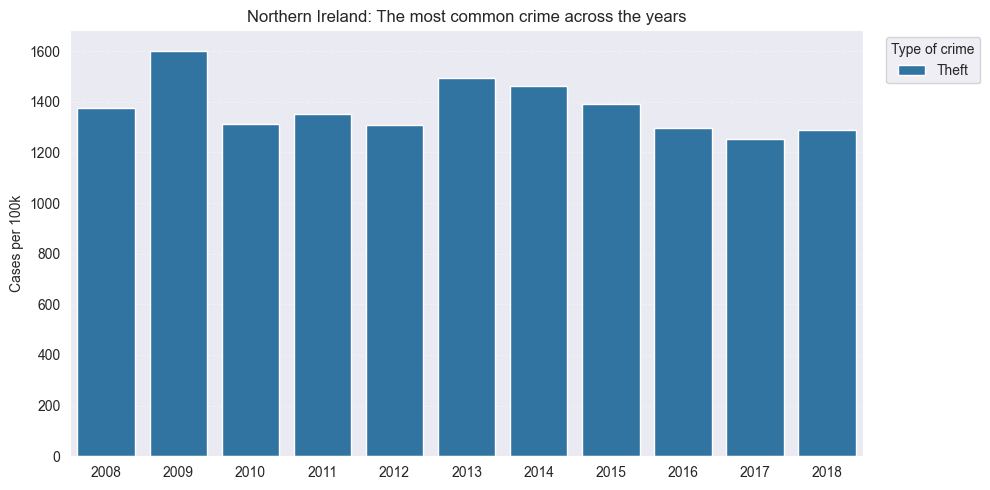

--------------------------------------------------


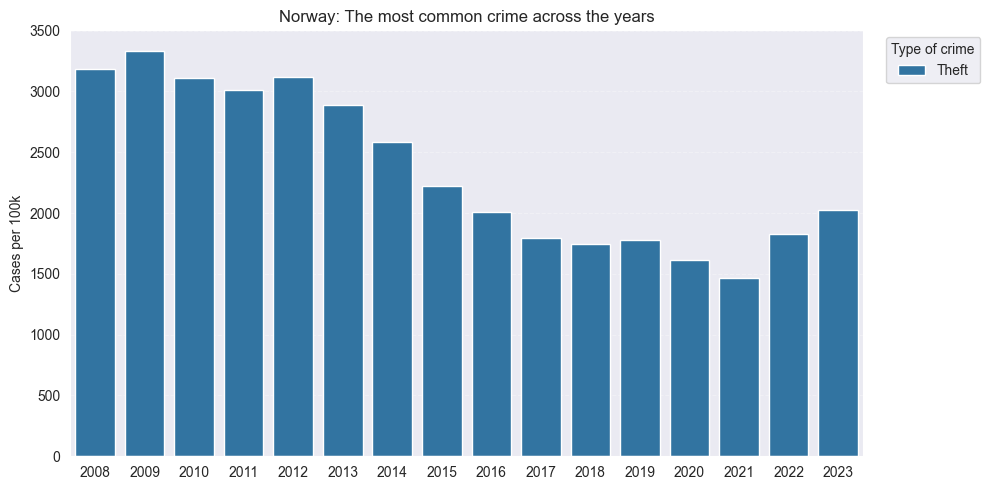

--------------------------------------------------


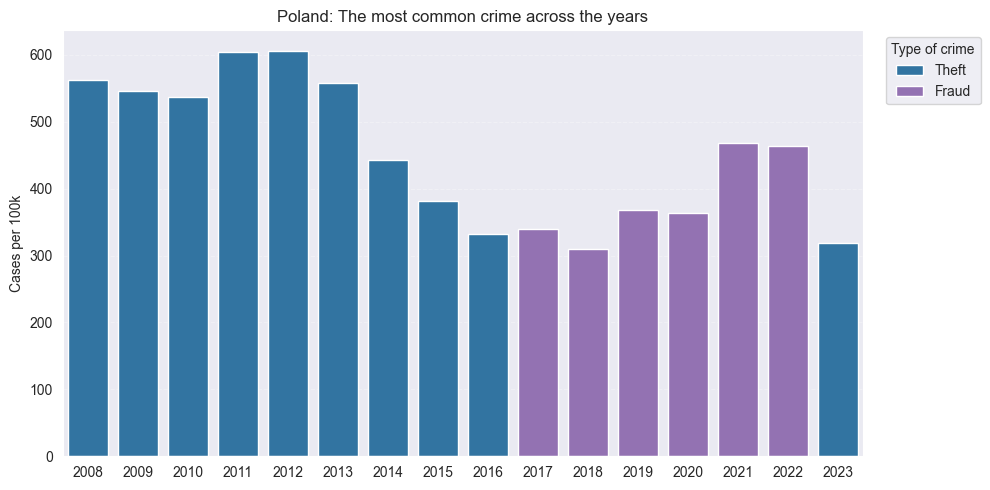

--------------------------------------------------


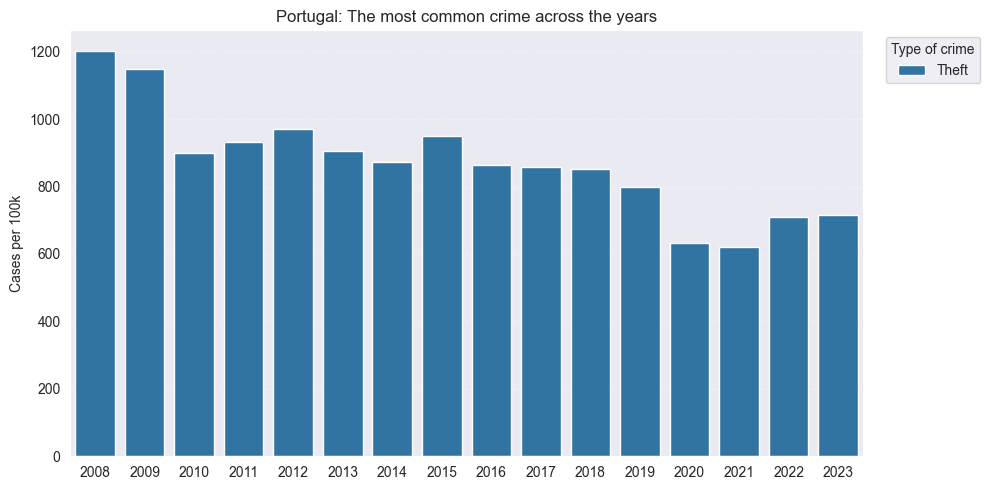

--------------------------------------------------


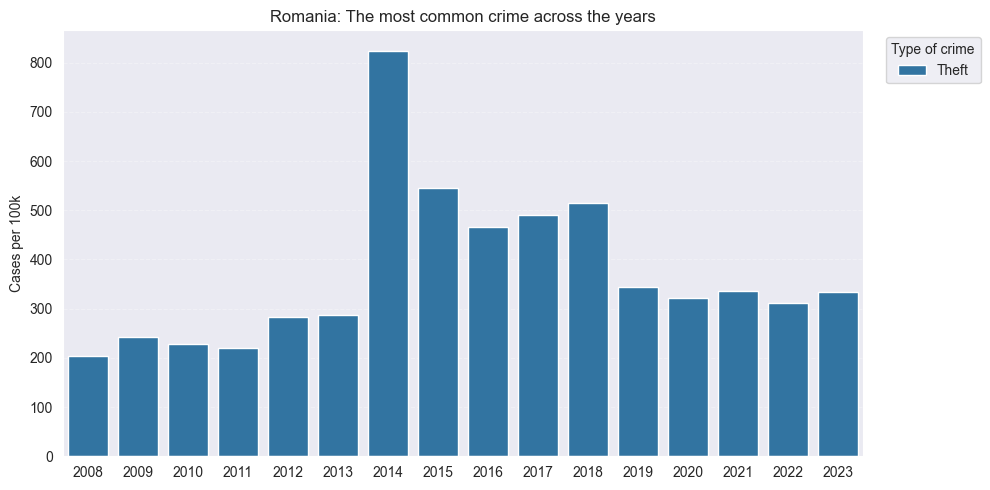

--------------------------------------------------


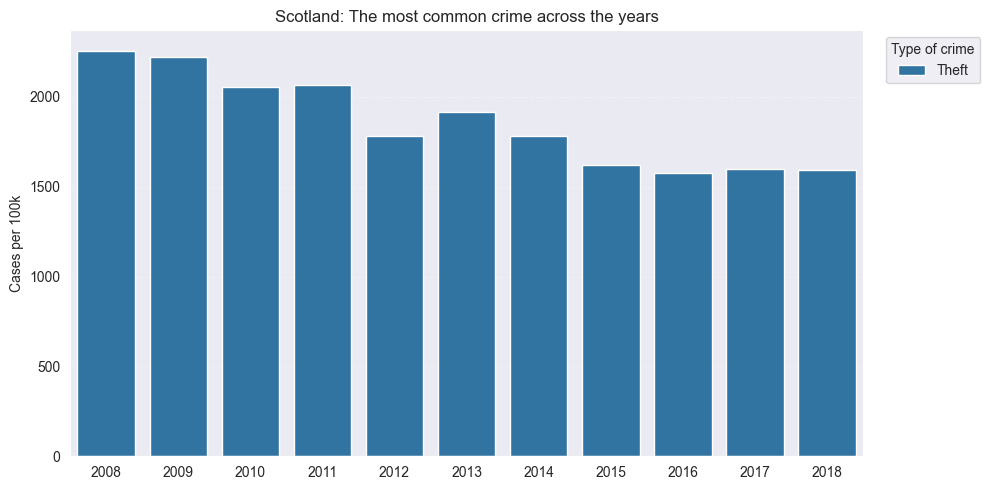

--------------------------------------------------


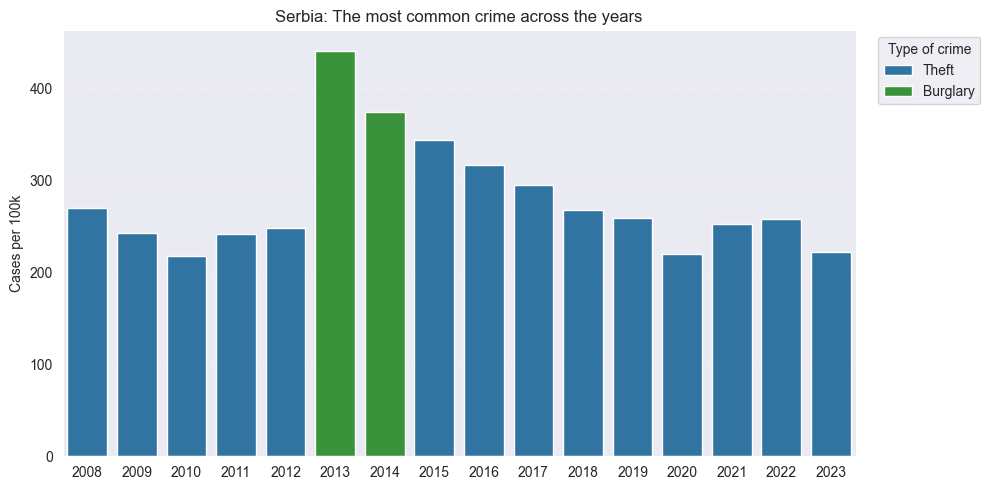

--------------------------------------------------


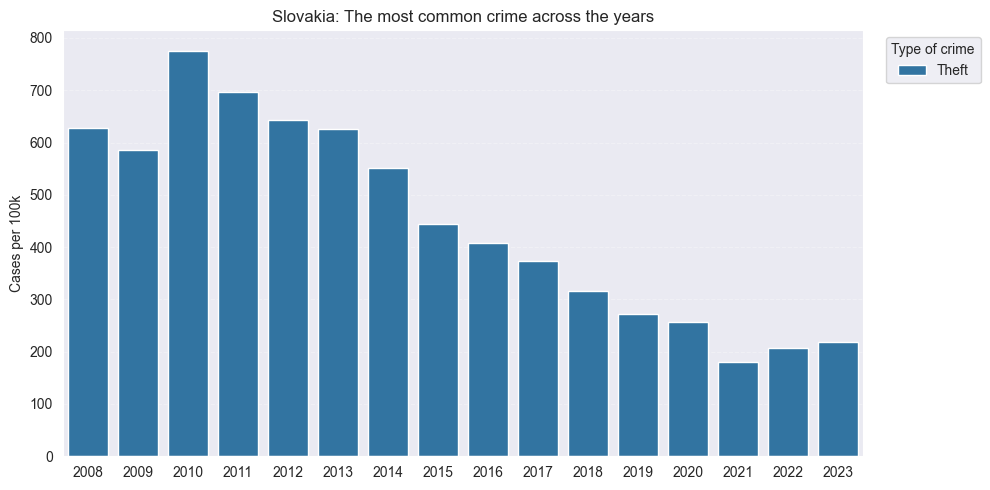

--------------------------------------------------


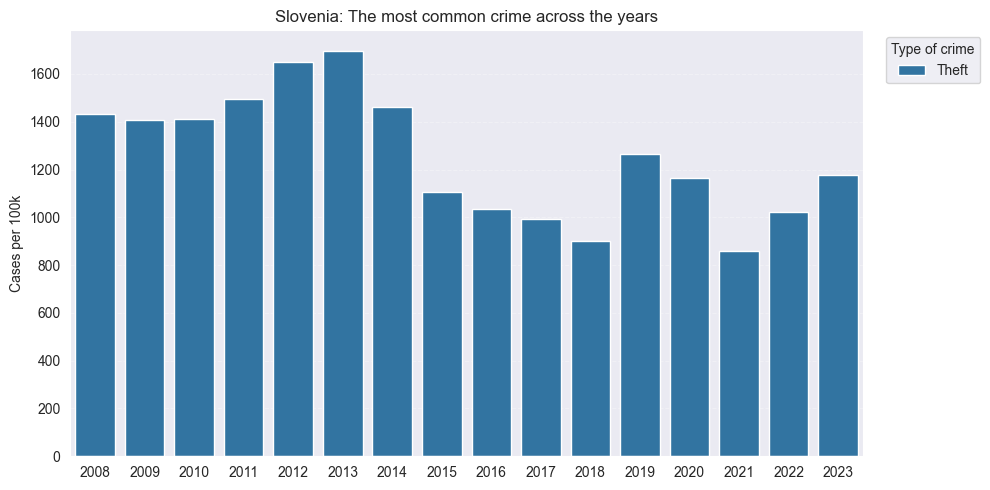

--------------------------------------------------


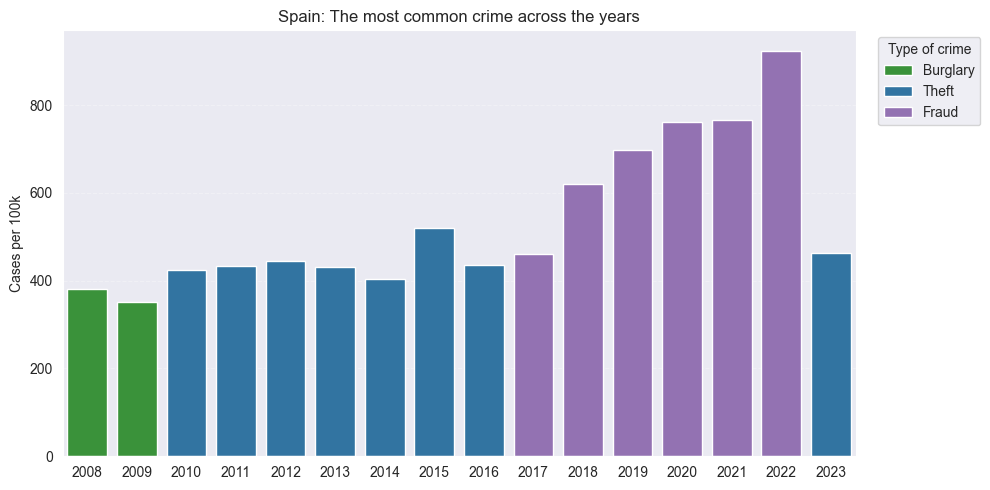

--------------------------------------------------


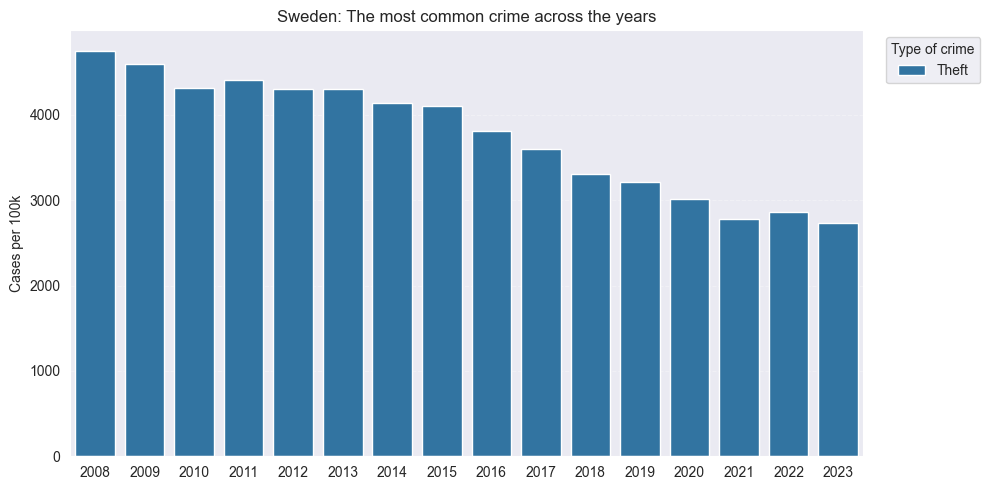

--------------------------------------------------


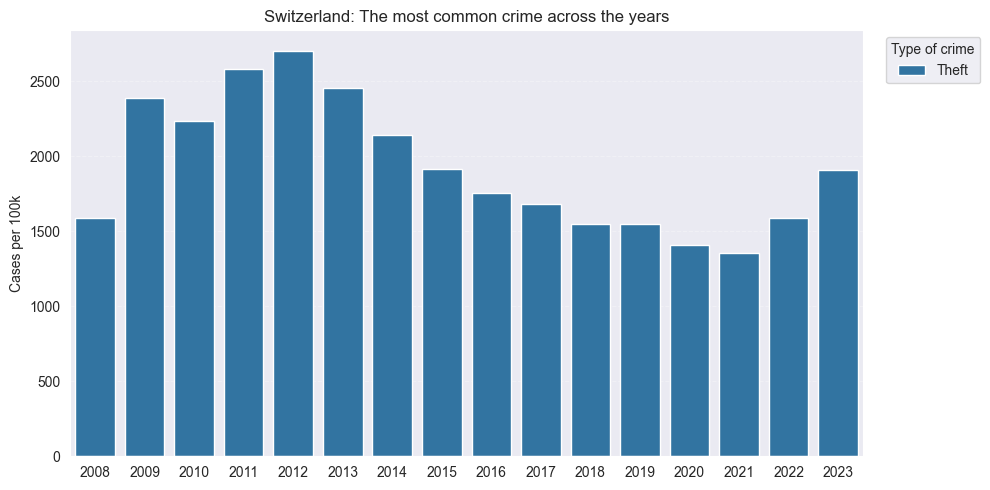

--------------------------------------------------


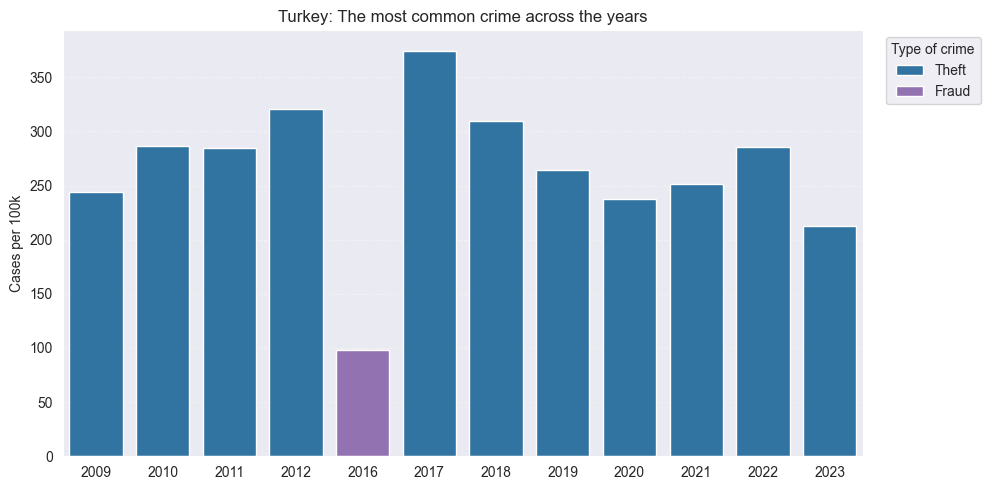

--------------------------------------------------


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Võtan nimekirja kõikidest riikidest, mis tabelis on
kõik_riigid = result_table['geo'].unique()
print(f"Joonistan graafikud {len(kõik_riigid)} riigi kohta...\n")

# 2. Määran kindlad värvid kuritegudele
# samad kuriteod kõigil graafikutel sama värvi
unikaalsed_kuriteod = result_table['iccs'].unique()
värvi_palett = dict(zip(unikaalsed_kuriteod, sns.color_palette("tab10", n_colors=len(unikaalsed_kuriteod))))

# 3. Tsükkel: käin iga riigi läbi ja joonistame igale nendest enda joonise
for riik in kõik_riigid:
    riigi_andmed = result_table[result_table['geo'] == riik]
    plt.figure(figsize=(10, 5))
    ax = sns.barplot(
        data=riigi_andmed,
        x='year',
        y='value',
        hue='iccs',
        dodge=False,
        palette=värvi_palett
    )

    # Kujundus
    plt.title(f'{riik}: The most common crime across the years')
    plt.xlabel('')
    plt.ylabel('Cases per 100k')

    # Legend
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', title="Type of crime")
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()

    plt.show()

    print("-" * 50)

## Countries' “Criminal Fingerprint”

In which crime types is a country unusually active compared to the European average? (Heatmap)

--------------------

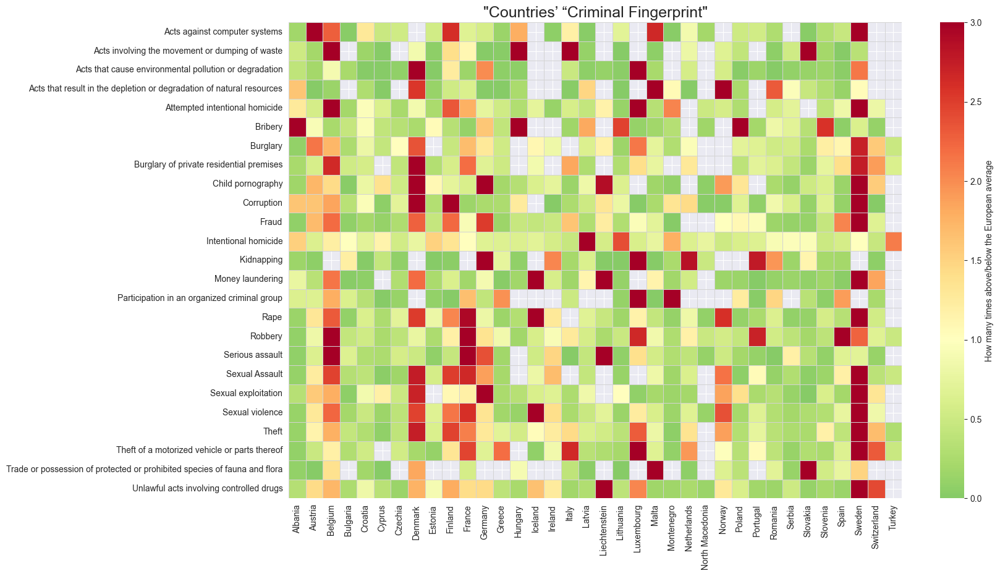

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# teen analyysi viimase 5 aasta peal, et saada täpsem-tänapäevane info
target_years = [2019, 2020, 2021, 2022, 2023]

# filtreerin
df_heat = df_long[
    (df_long['unit'] == 'P_HTHAB') &
    (df_long['year'].isin(target_years)) &
    (~df_long['geo'].isin(['EU27_2020', 'EA19', 'EA20', 'European Union', 'Euro area', 'Kosovo'])) &
    (~df_long['iccs'].isin(['Total offences', 'Serious violent crimes (aggregate)']))
].copy()

# arvutan keskmised (riigi keskm. iga kuriteo kohta)- viie aasta peale kokku
country_means = df_heat.groupby(['geo', 'iccs'])['value'].mean().reset_index()

# siis euroopa keskmine iga kuriteo kohta (kõik riigid kokku)
euro_means = df_heat.groupby('iccs')['value'].mean().reset_index()
euro_means = euro_means.rename(columns={'value': 'euro_avg'})

# arvutan indeksi, ühend. tabelid
merged = pd.merge(country_means, euro_means, on='iccs')
# valem: Riik / Euroopa
merged['index'] = merged['value'] / merged['euro_avg']

# teen tabeli (maatriksi), kus read=kuriteod. veerud=riigid
heatmap_data = merged.pivot(index='iccs', columns='geo', values='index')

# eemald. tühjad read,veerud
heatmap_data = heatmap_data.dropna(axis=0, how='all').dropna(axis=1, how='all')

###########################
plt.figure(figsize=(16, 10))

sns.heatmap(
    heatmap_data,
    cmap='RdYlGn_r',
    center=1.0,
    vmax=3.0,
    vmin=0.0,            # Skaala algab 0-st
    linewidths=.5,
    linecolor='lightgrey',
    cbar_kws={'label': 'How many times above/below the European average'}
)

plt.title('"Countries’ “Criminal Fingerprint"', fontsize=18)
plt.xlabel('')
plt.ylabel('')
plt.show()

## Deviations from the European Average – Country Profiles

Country crime profiles (Radar Charts):
I analyze each country’s unique crime structure by selecting the top 15 crime types and comparing them against the European average.

--- Albania ---


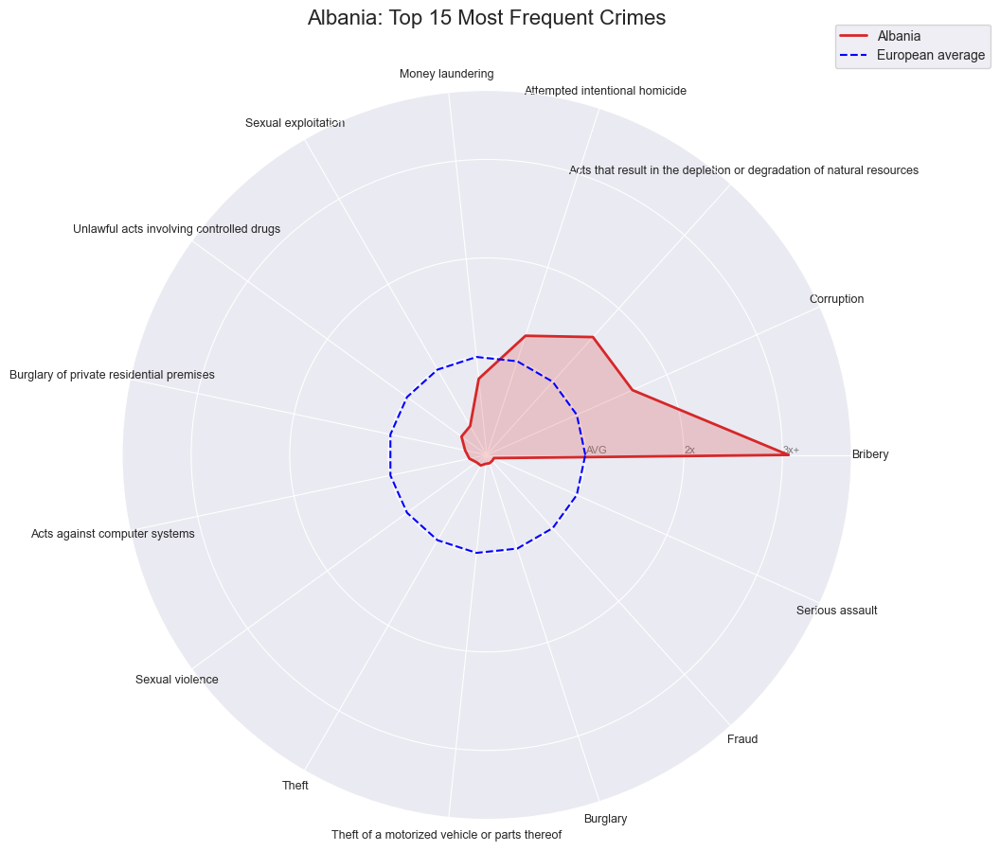

--- Austria ---


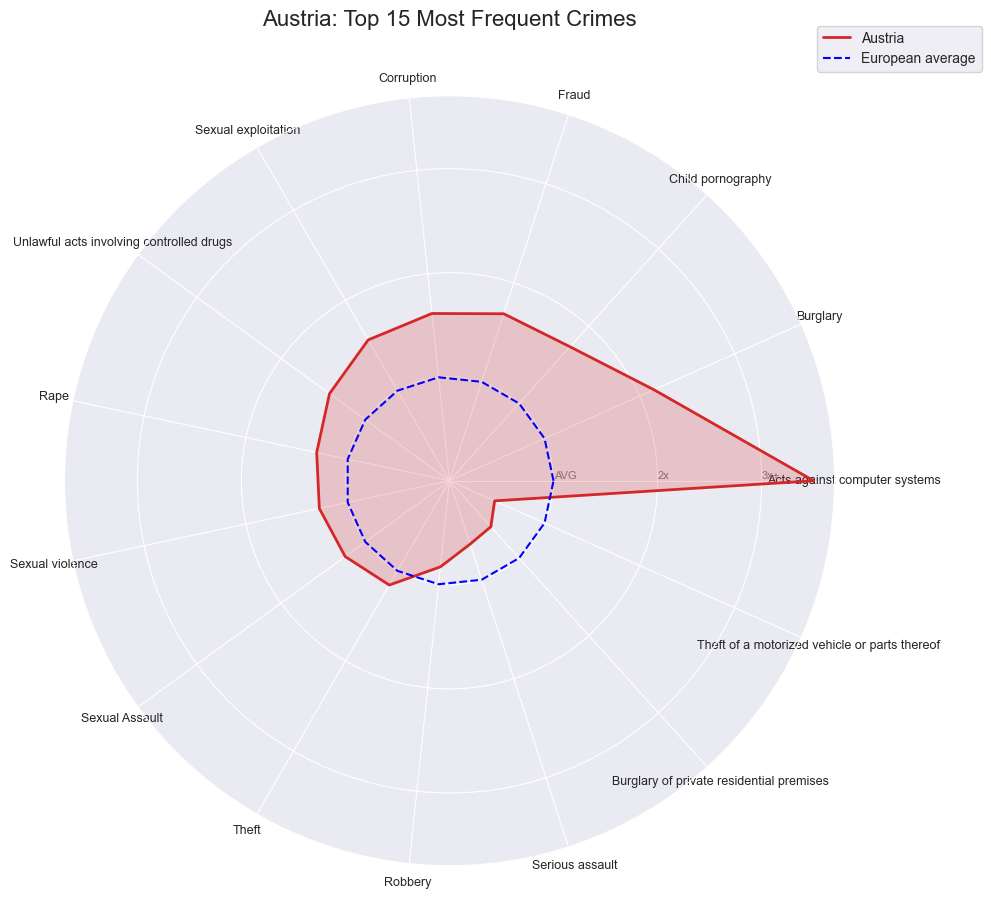

--- Belgium ---


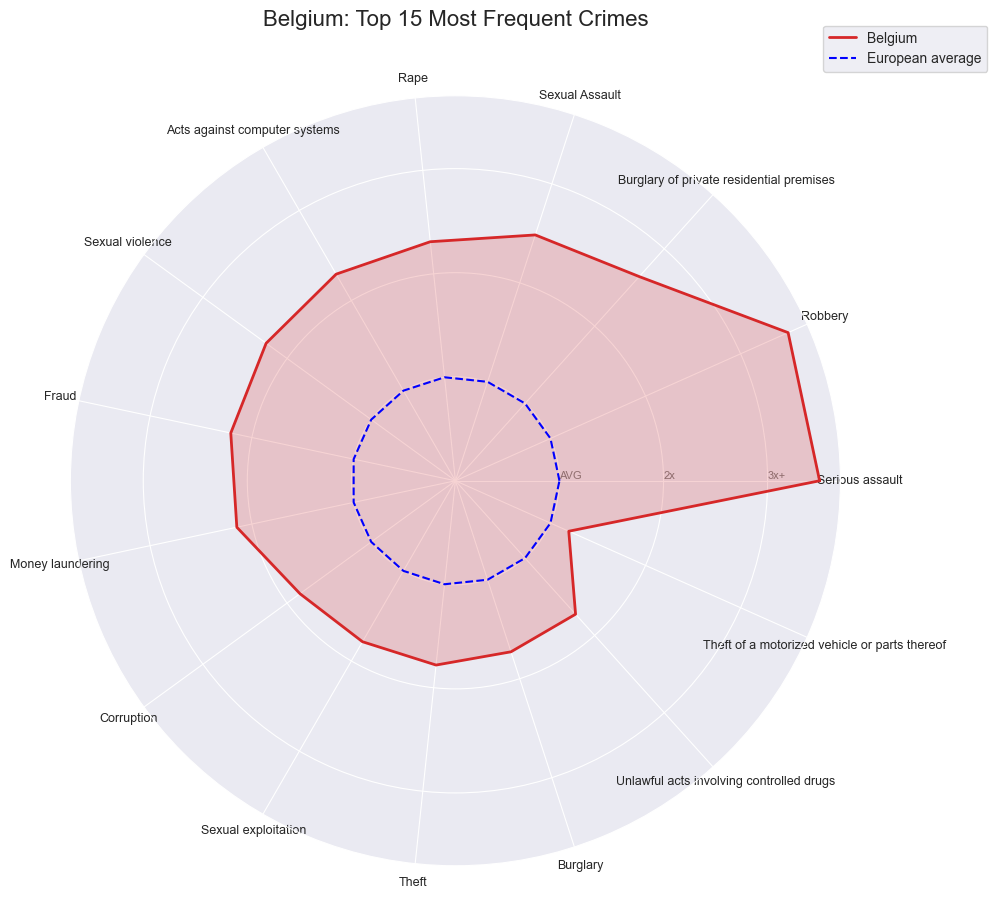

--- Bosnia and Herzegovina ---


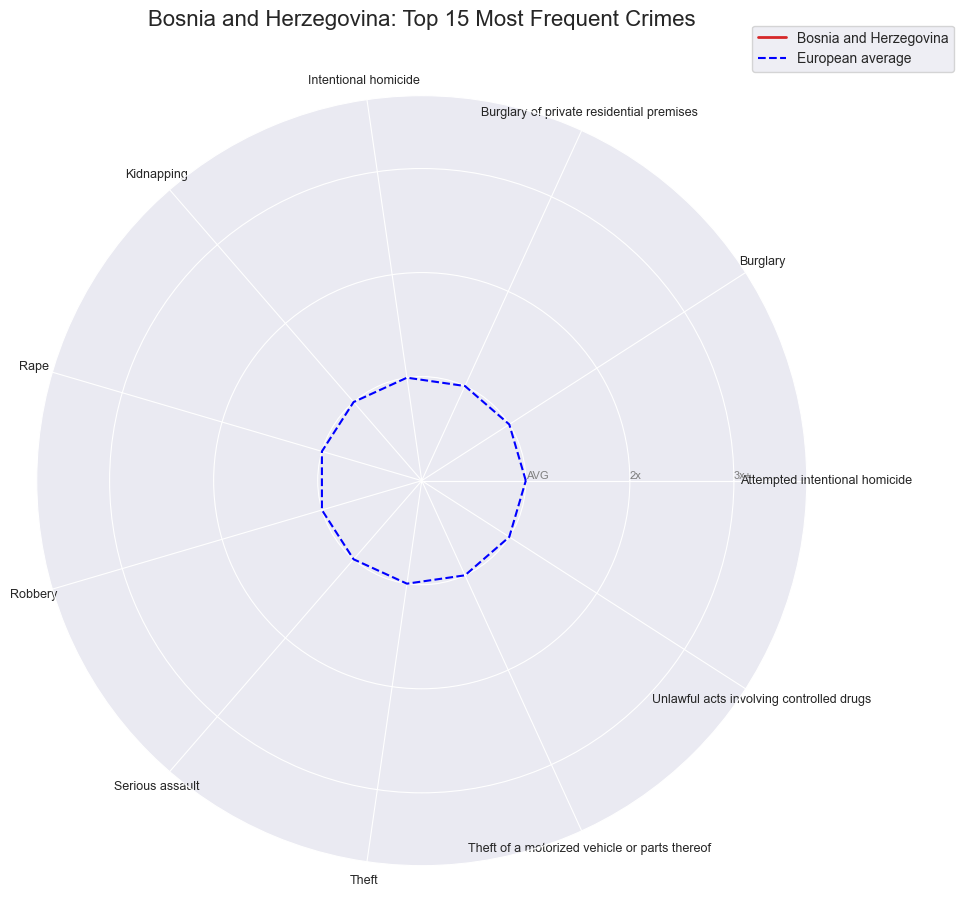

--- Bulgaria ---


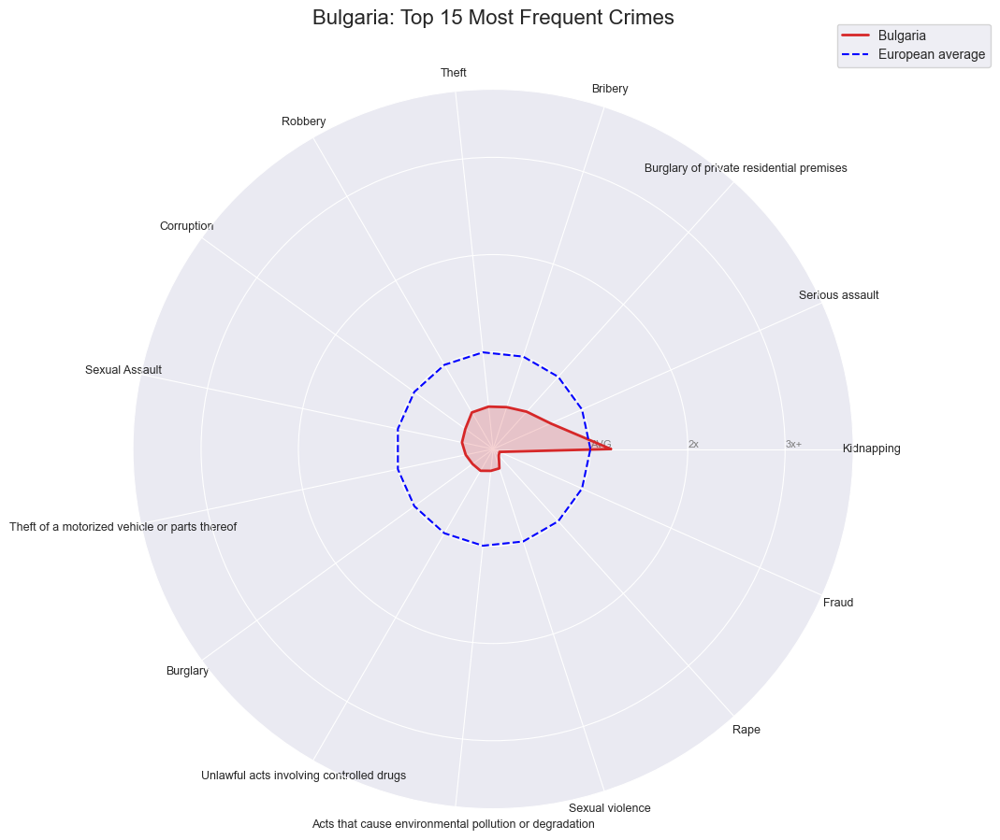

--- Croatia ---


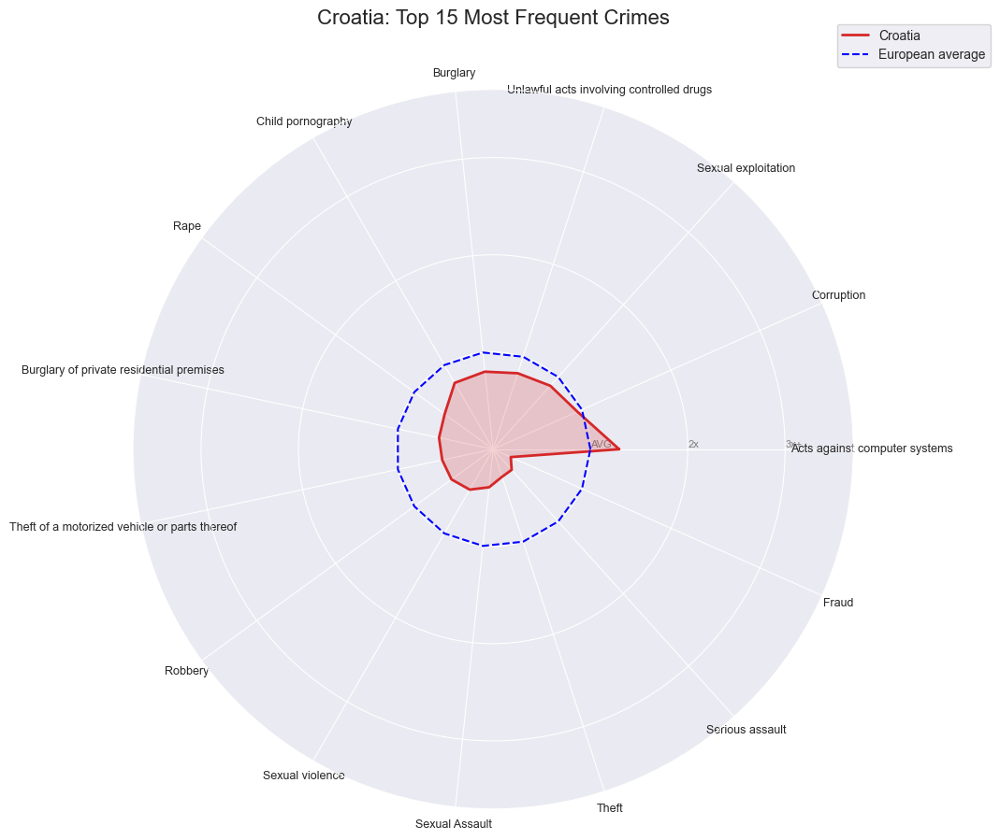

--- Cyprus ---


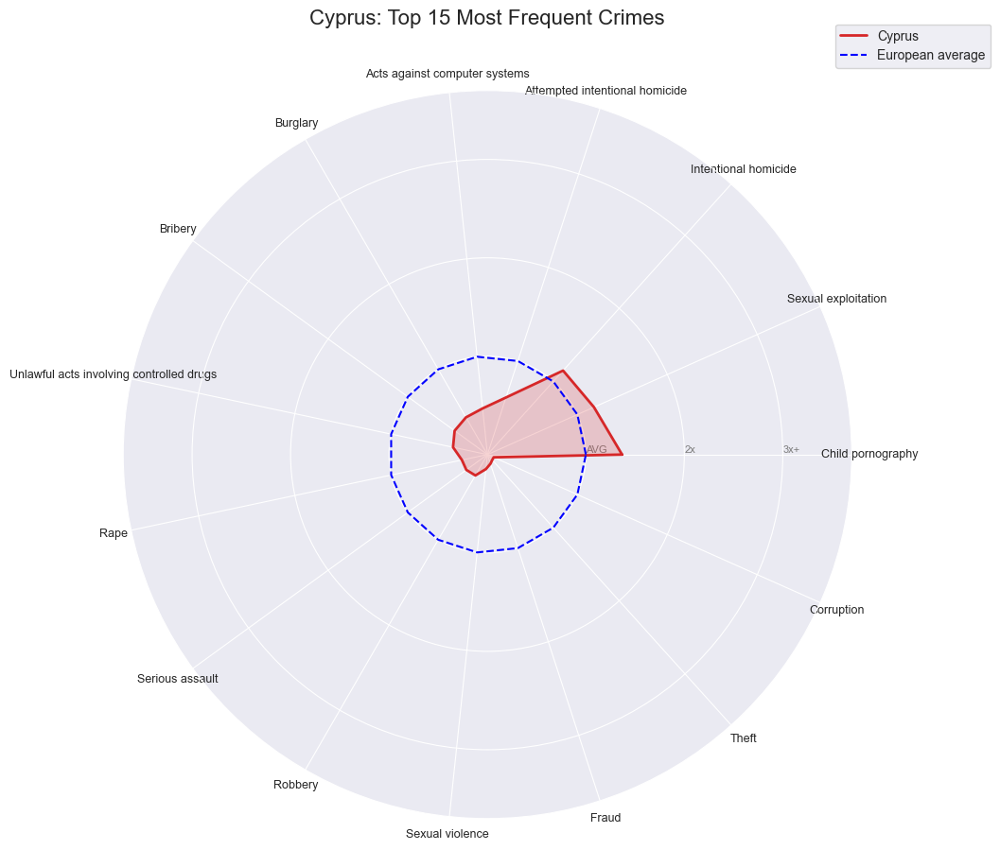

--- Czechia ---


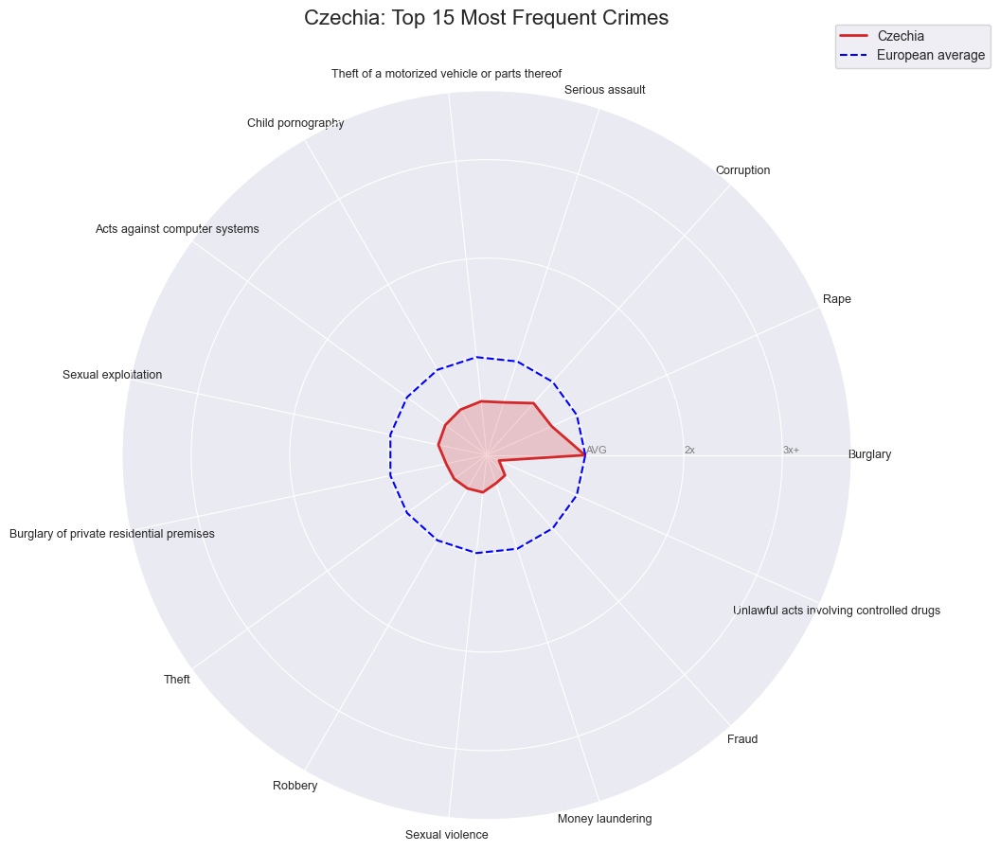

--- Denmark ---


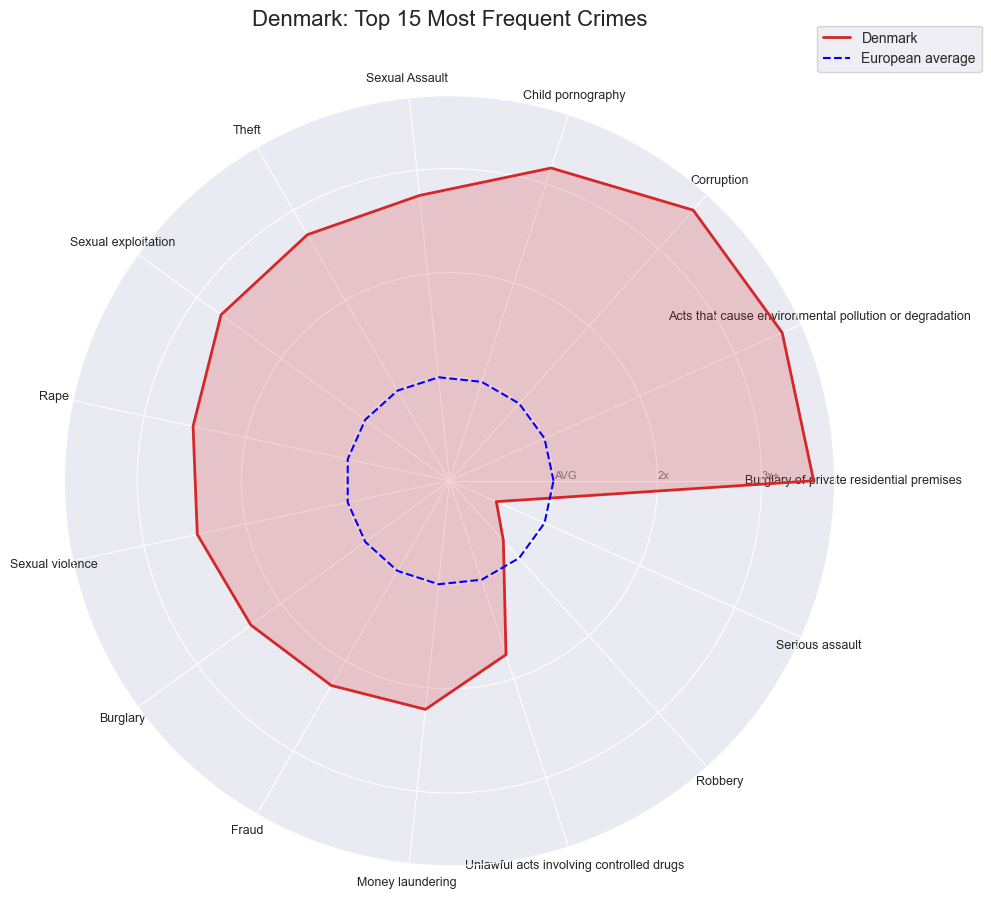

--- England and Wales ---


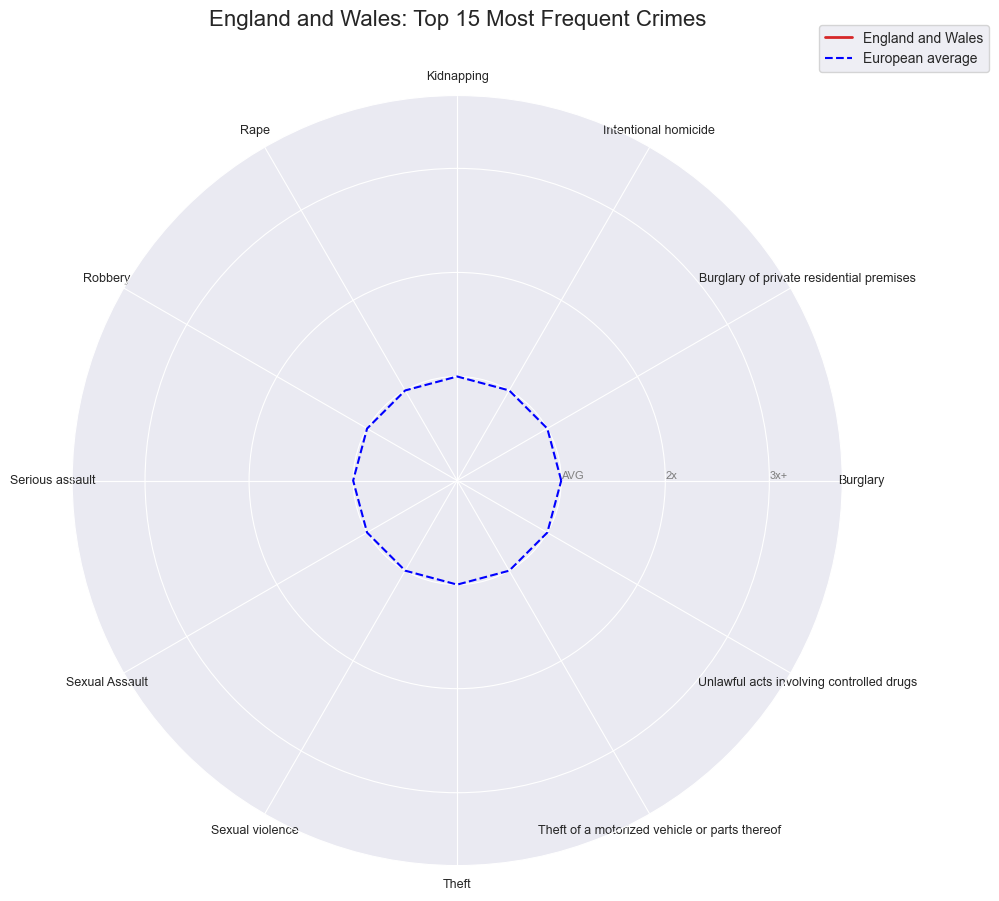

--- Estonia ---


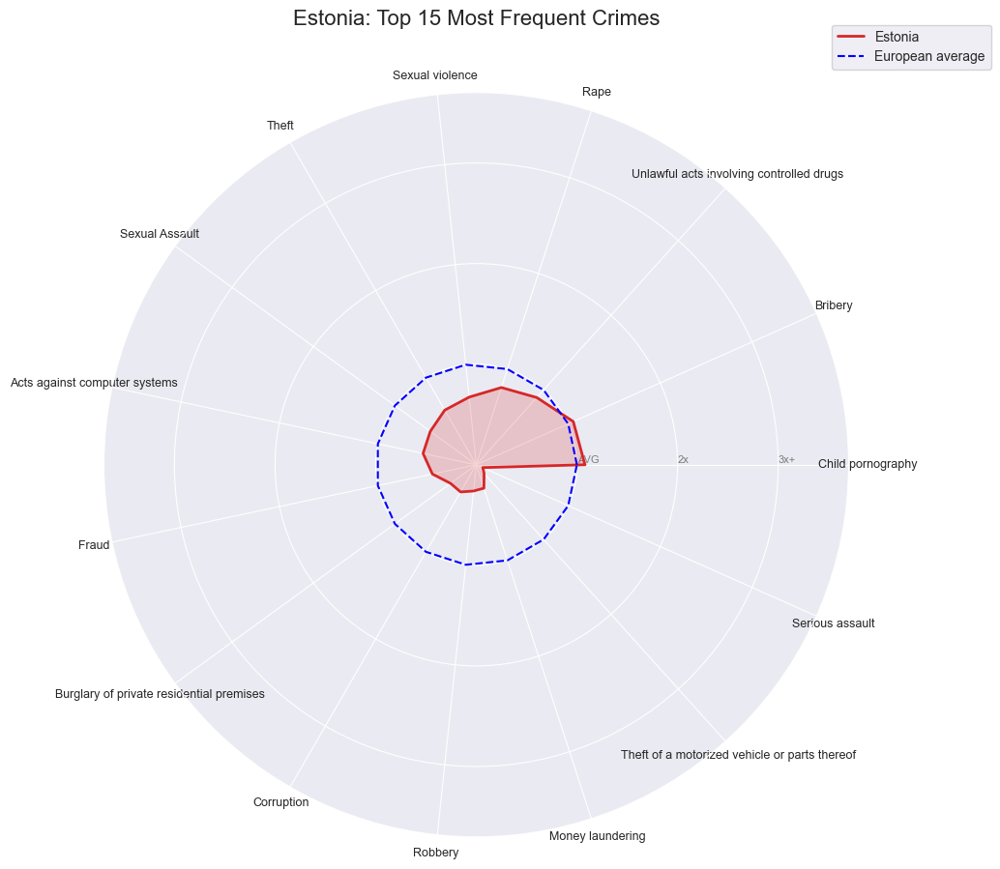

--- Finland ---


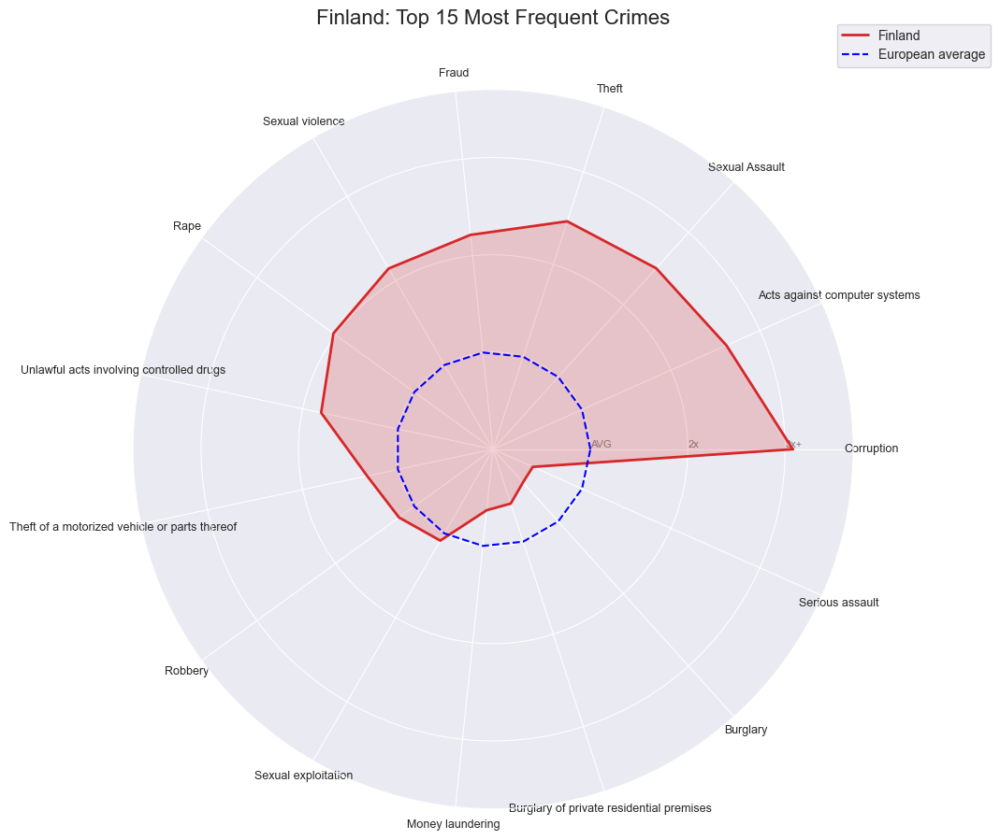

--- France ---


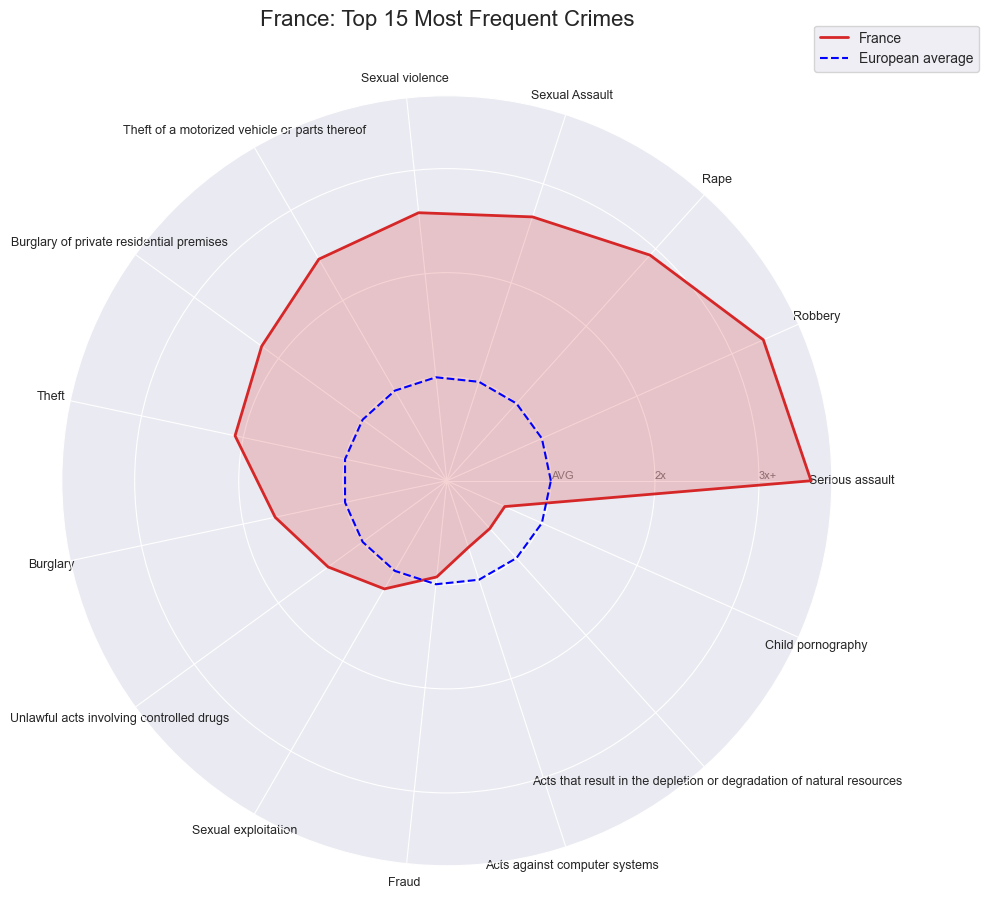

--- Germany ---


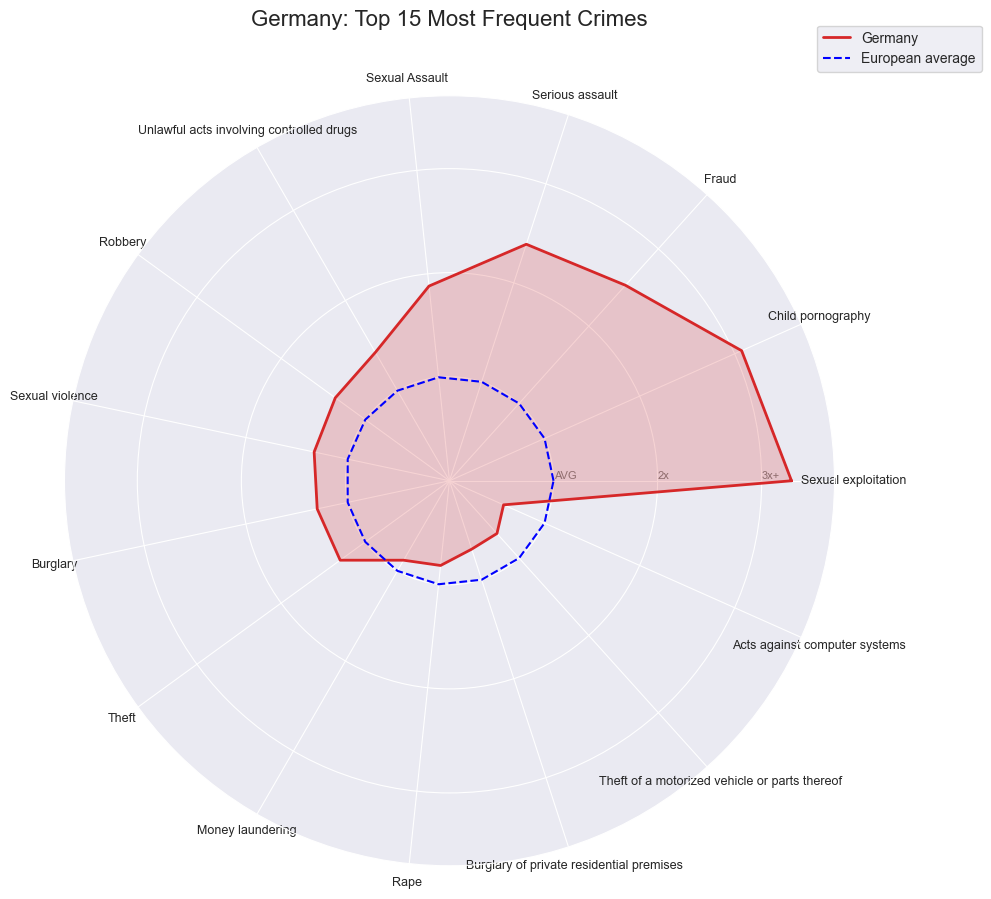

--- Greece ---


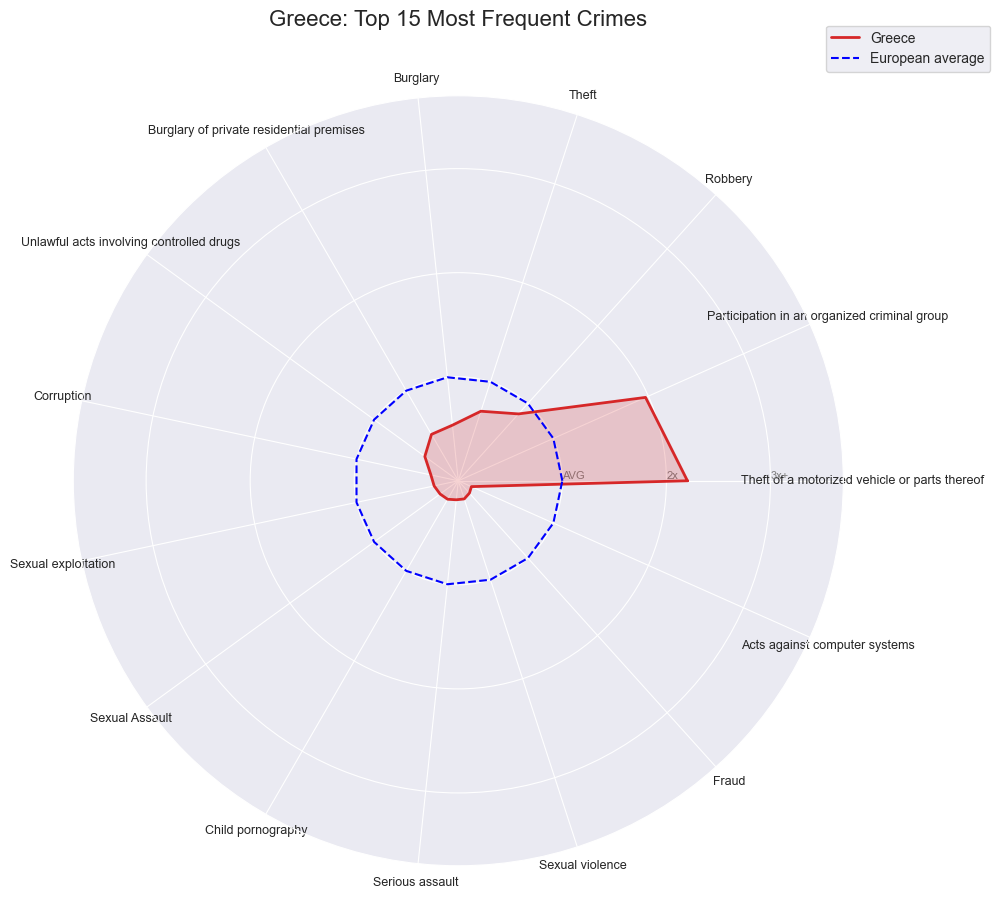

--- Hungary ---


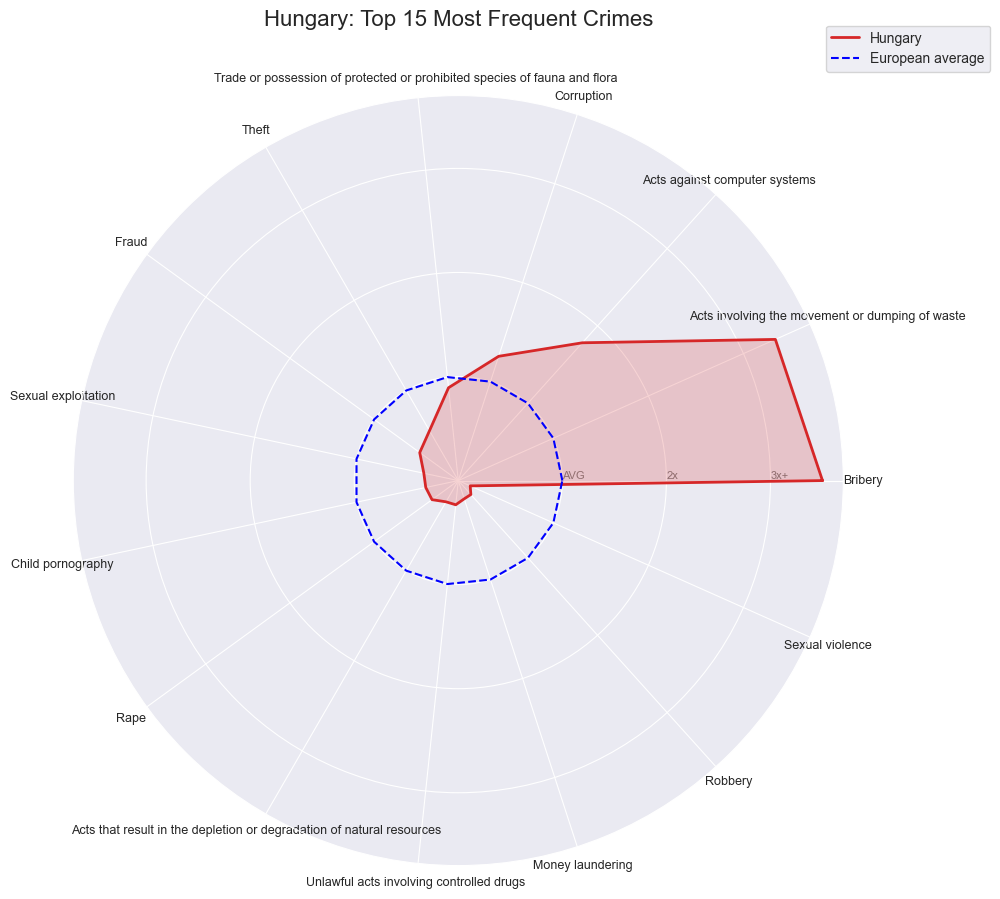

--- Iceland ---


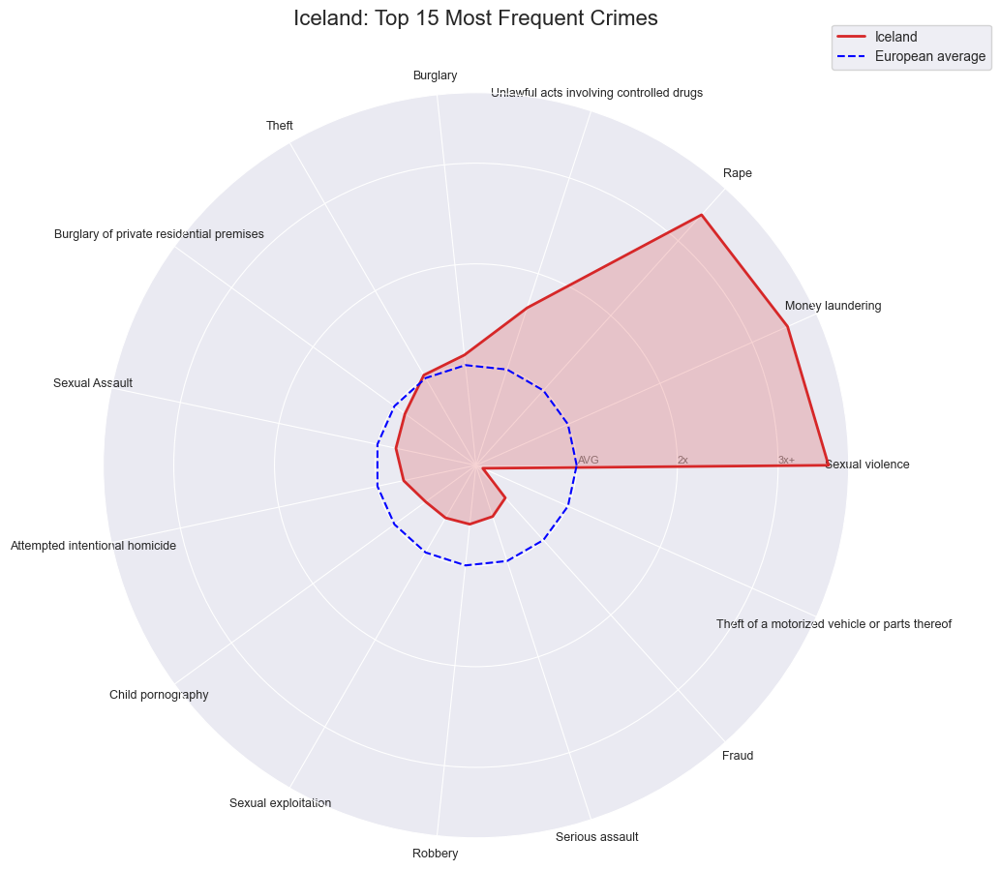

--- Ireland ---


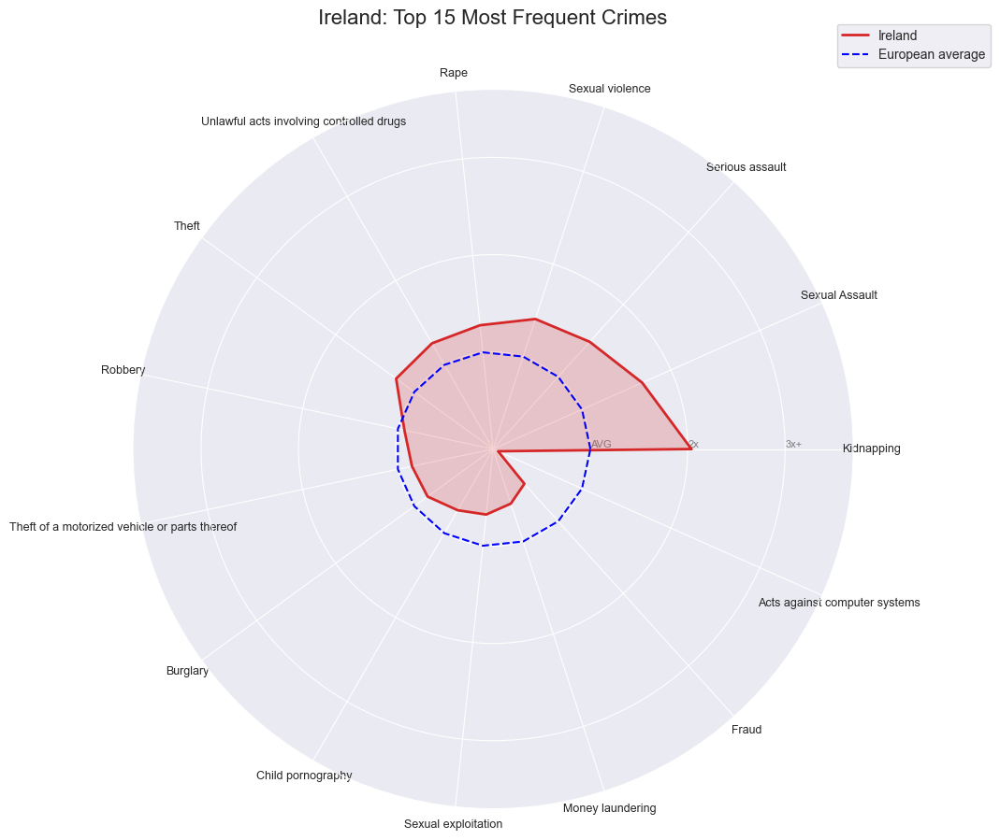

--- Italy ---


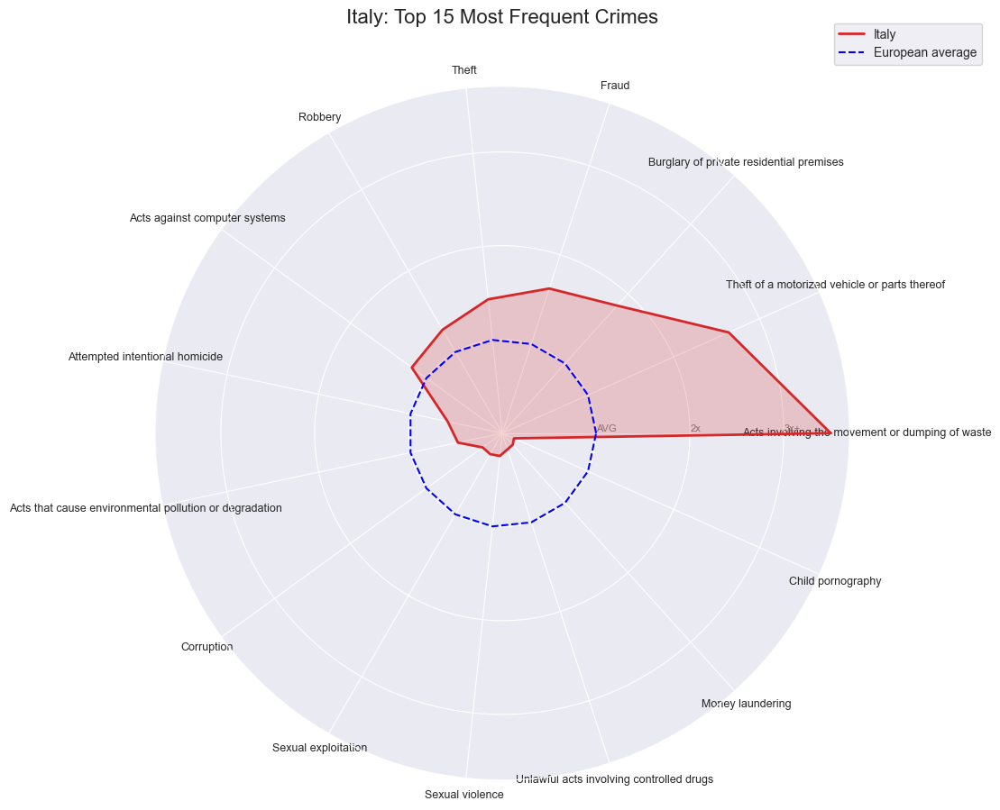

--- Latvia ---


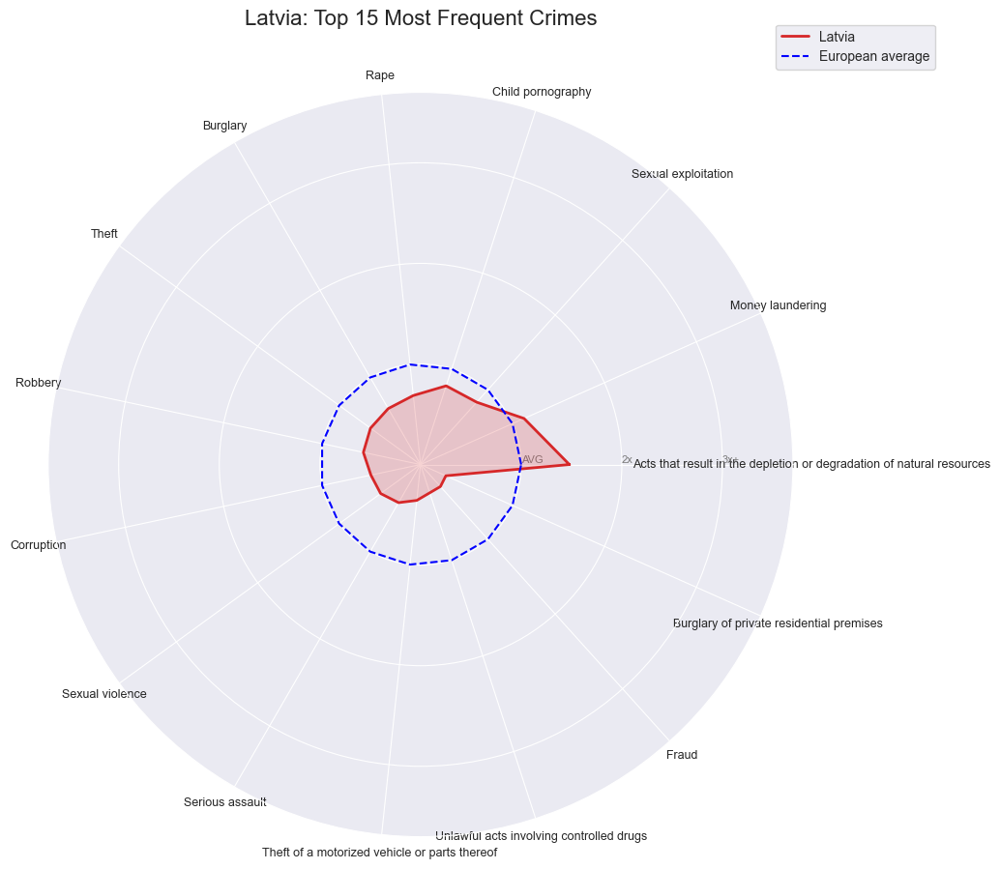

--- Liechtenstein ---


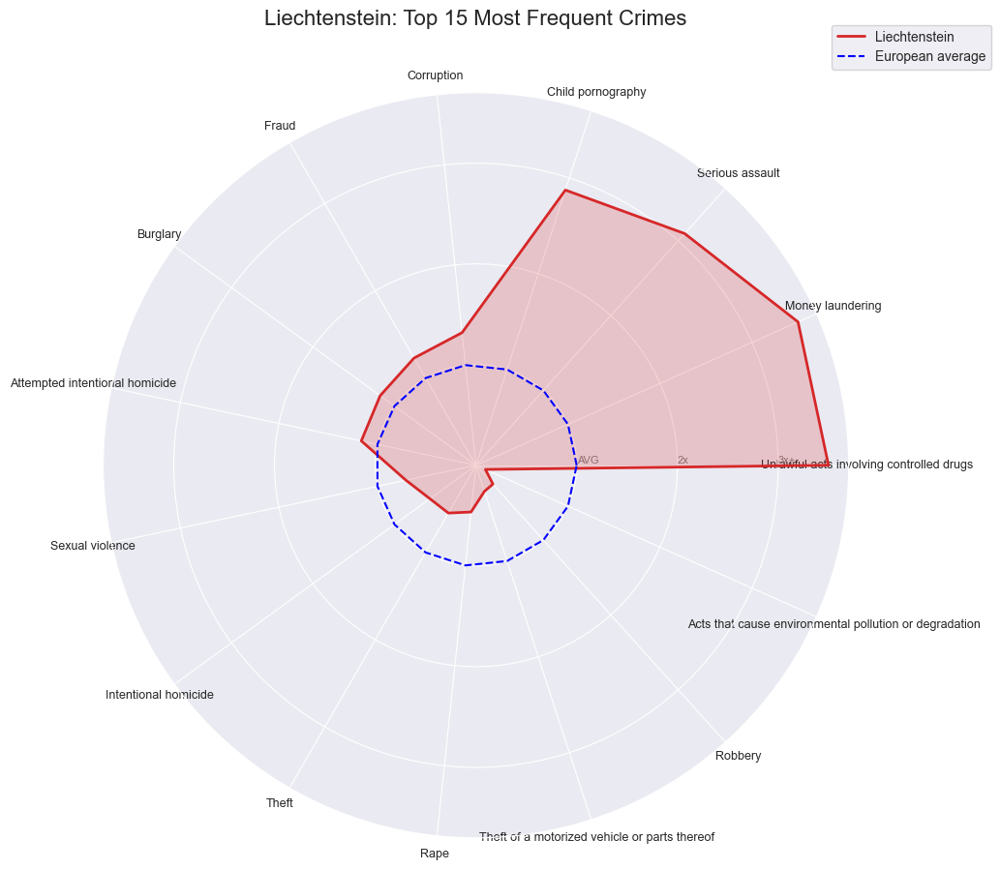

--- Lithuania ---


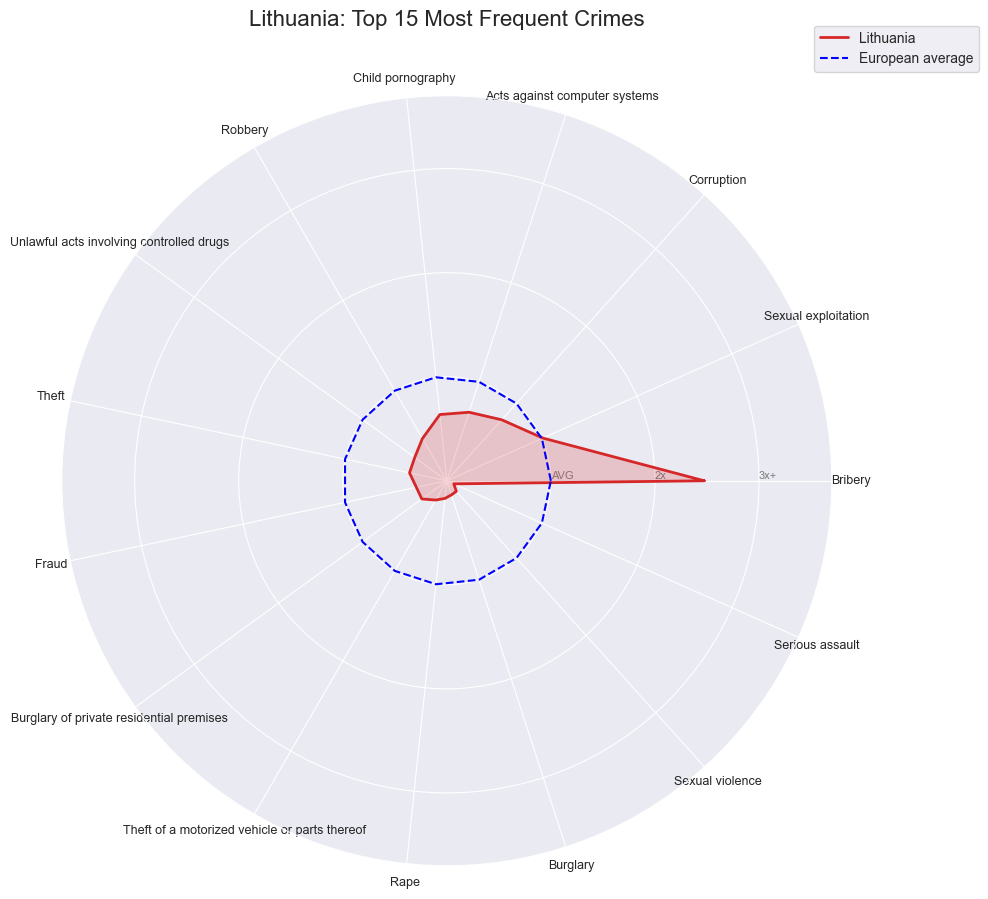

--- Luxembourg ---


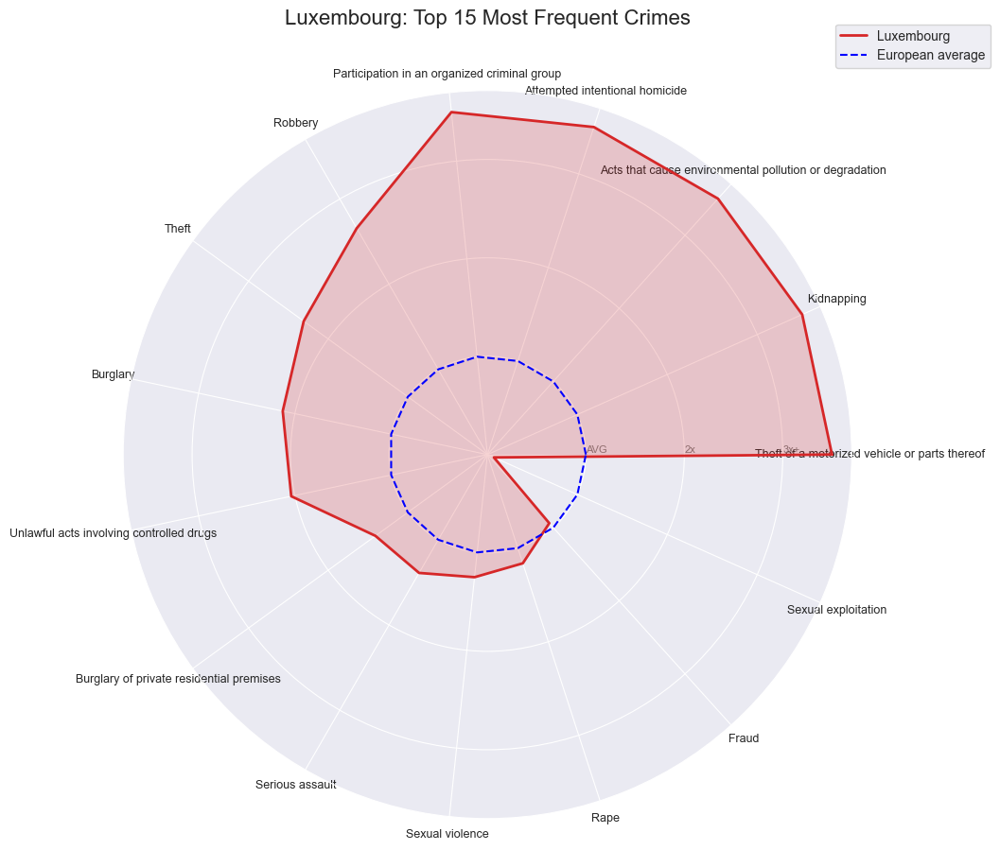

--- Malta ---


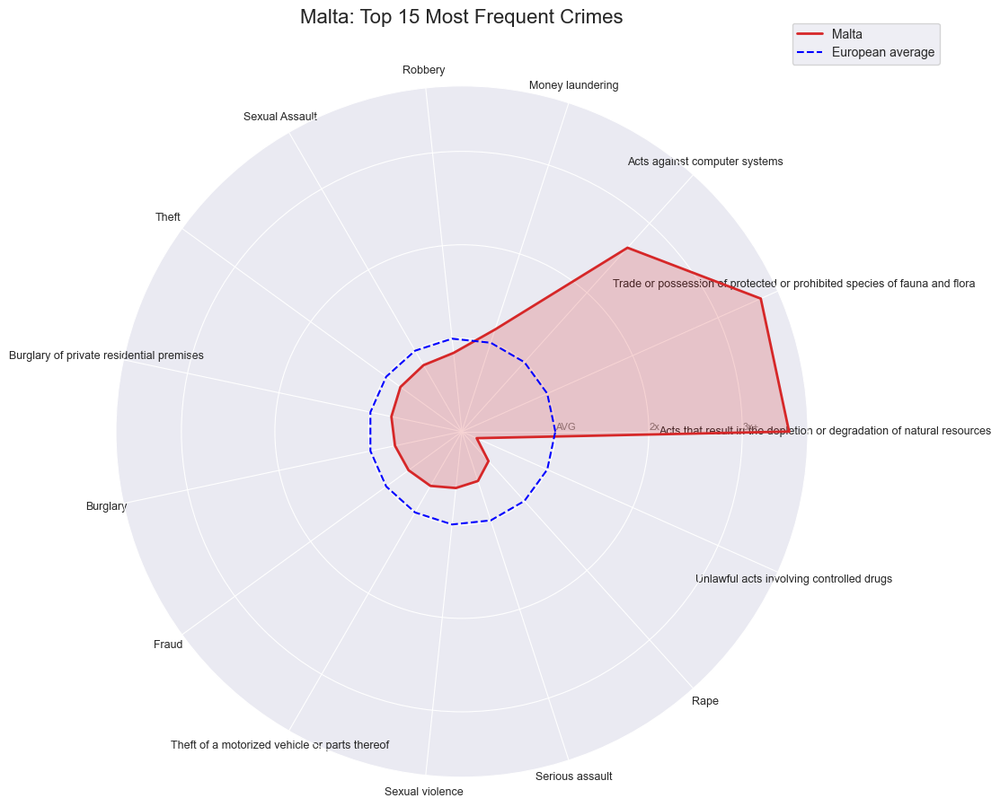

--- Montenegro ---


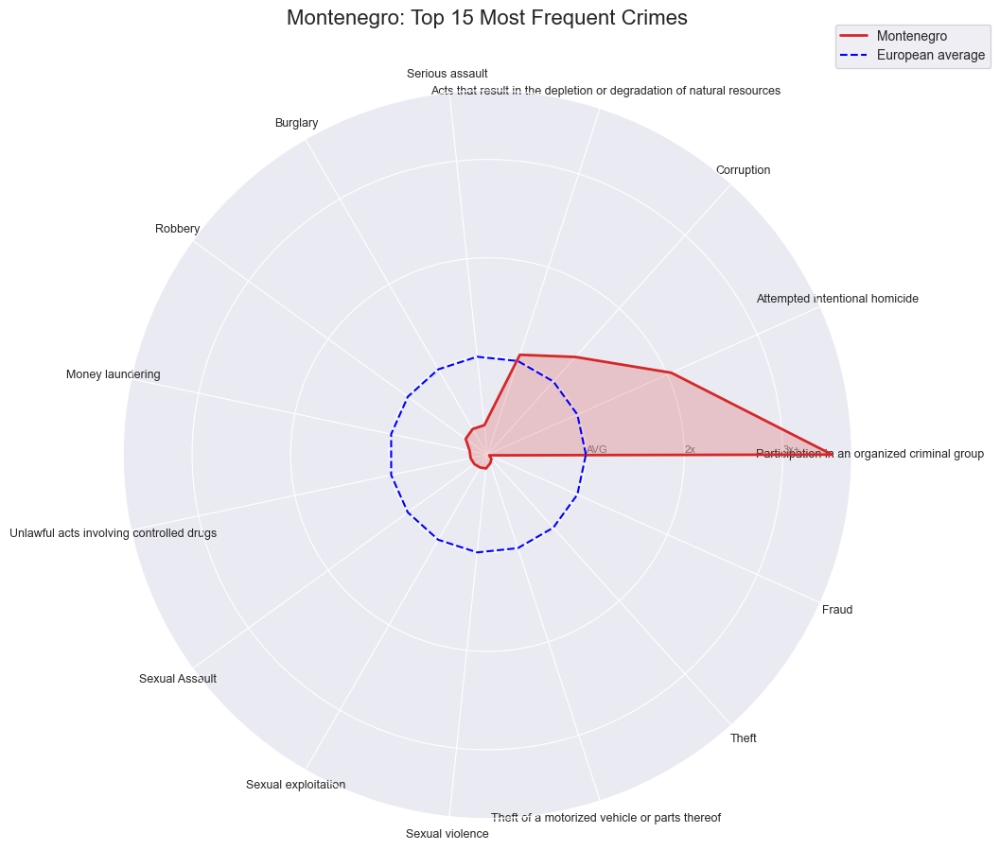

--- Netherlands ---


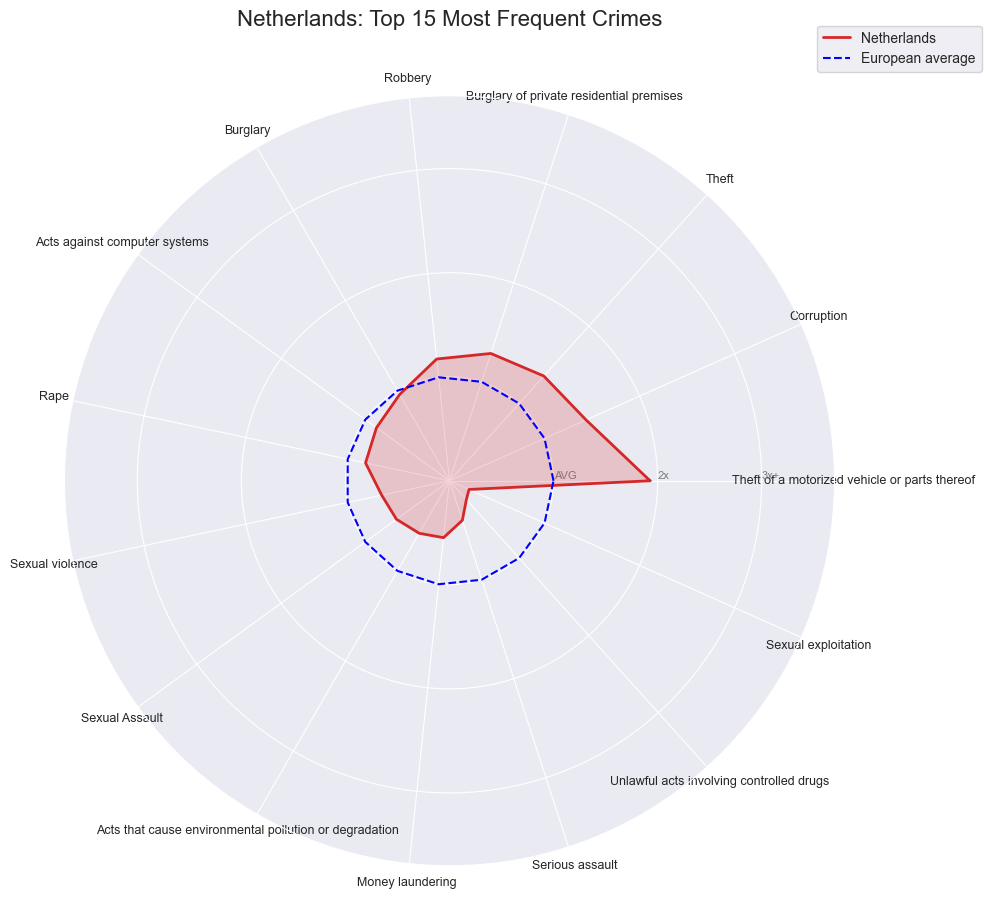

--- North Macedonia ---


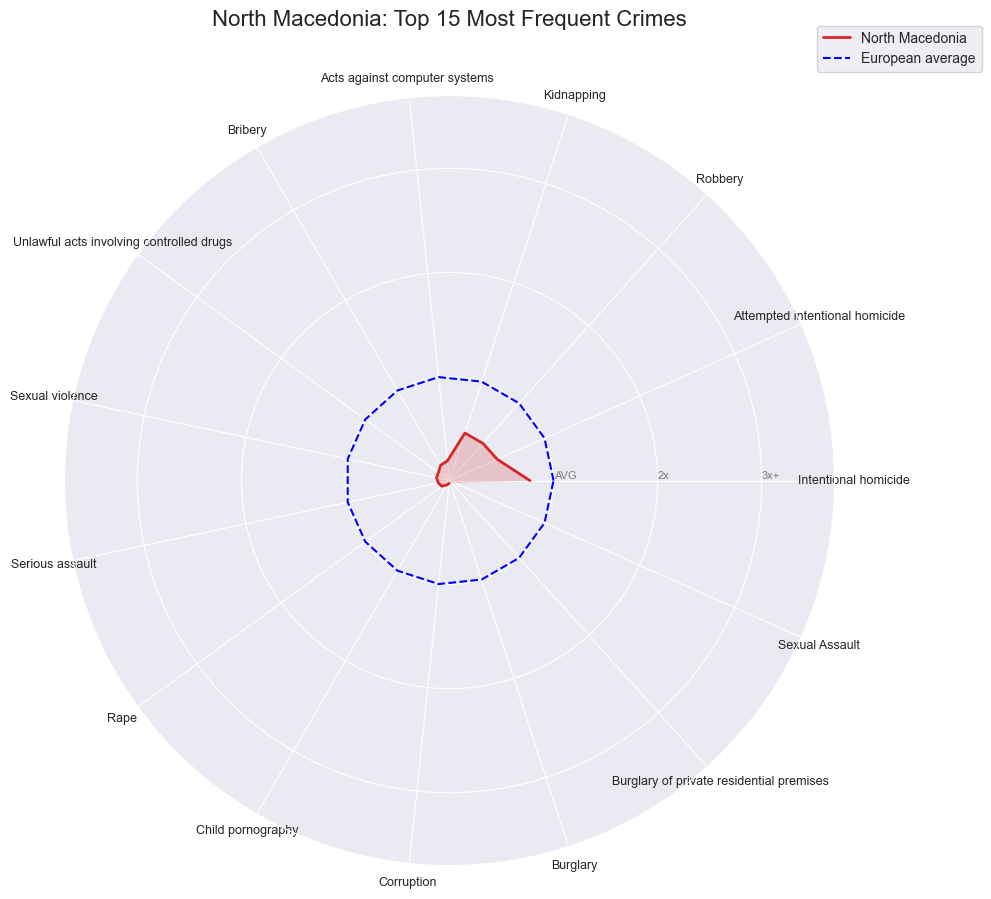

--- Northern Ireland ---


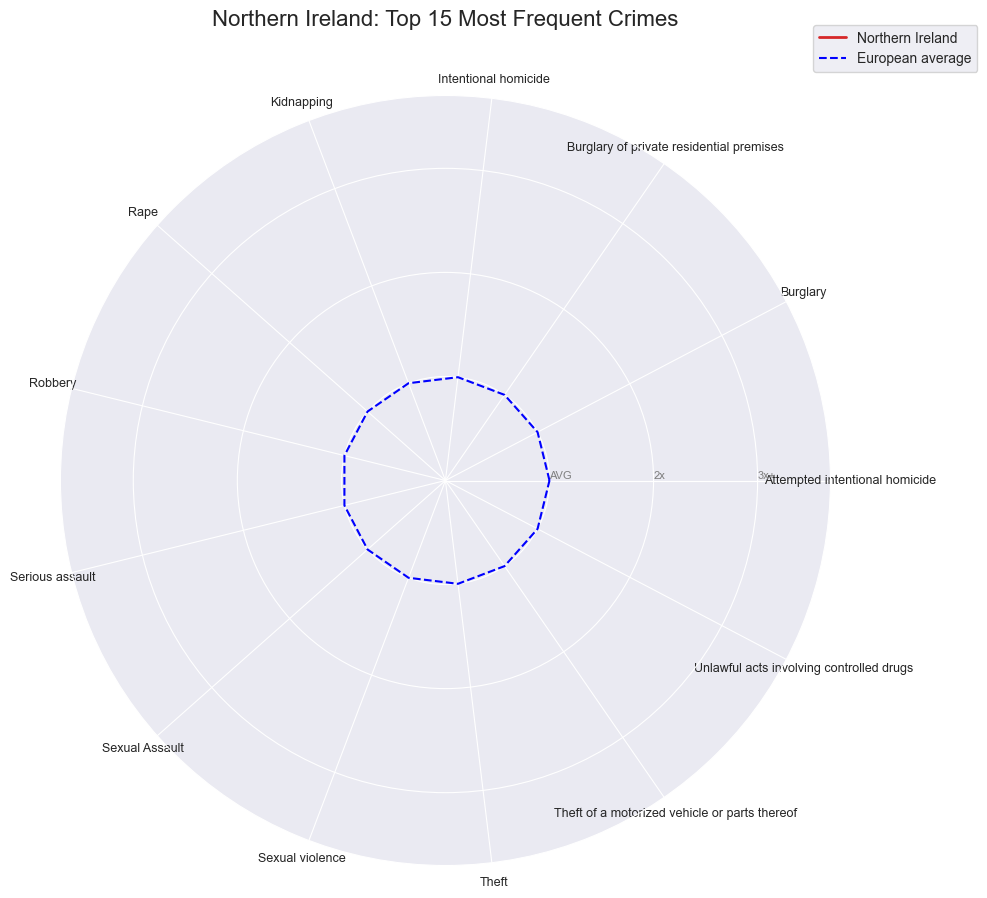

--- Norway ---


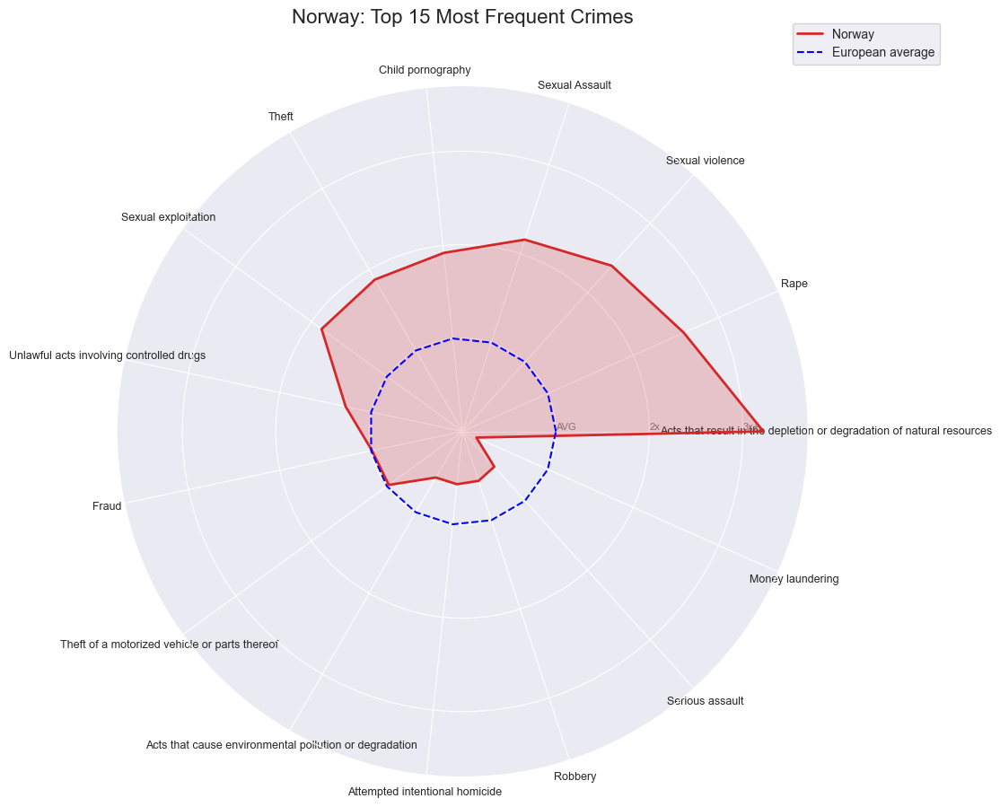

--- Poland ---


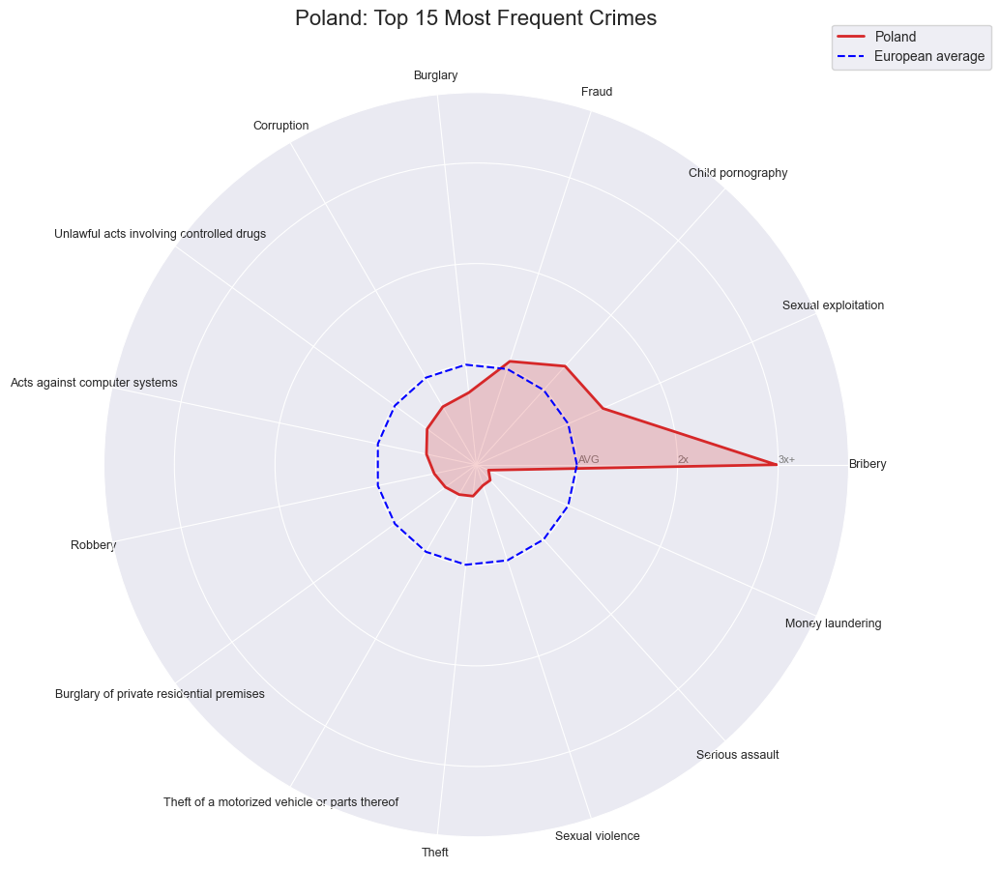

--- Portugal ---


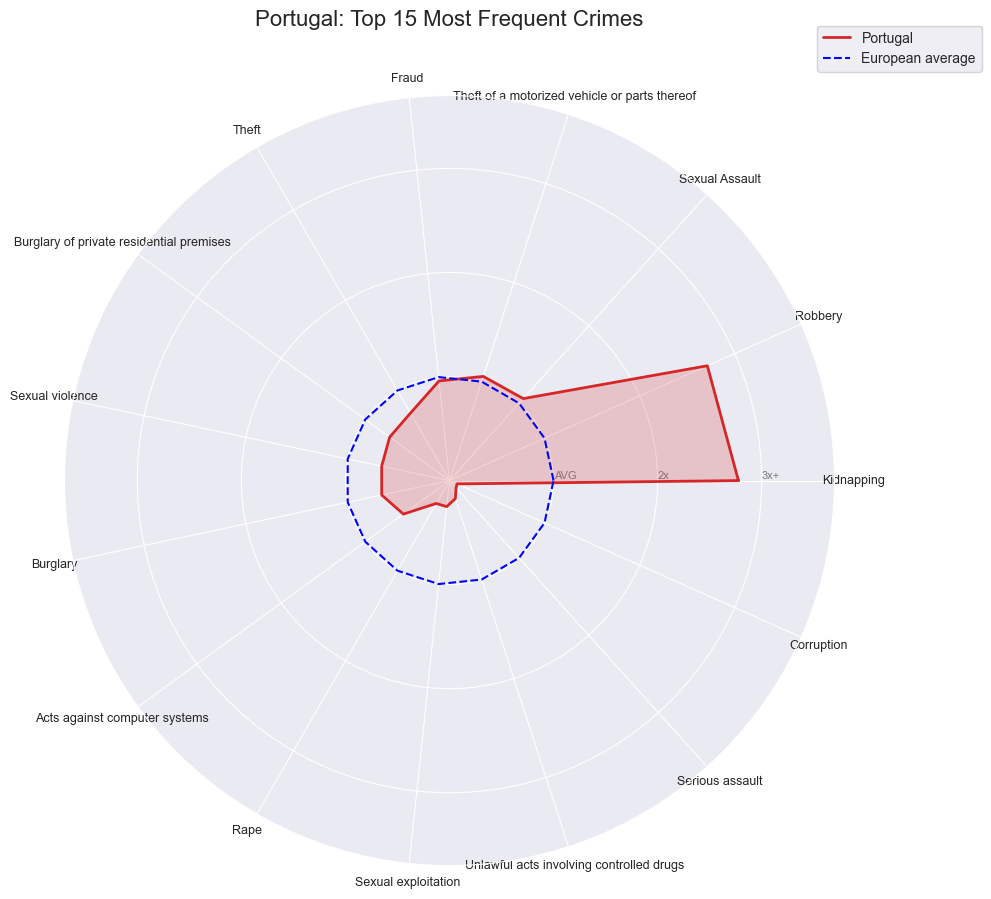

--- Romania ---


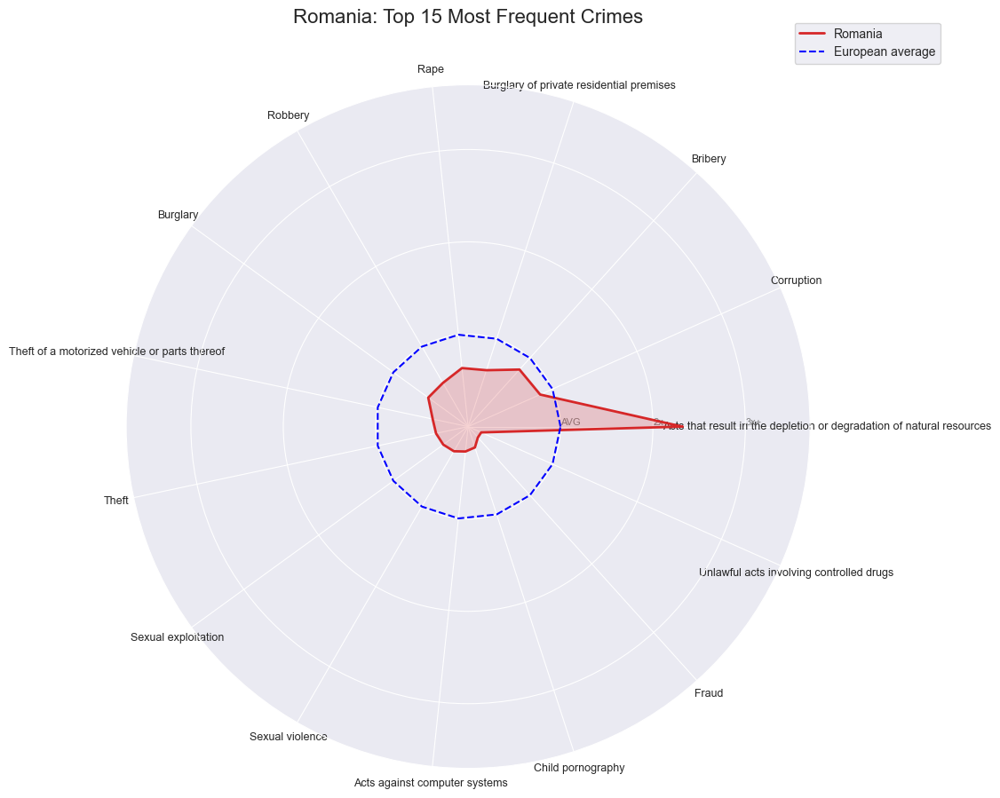

--- Scotland ---


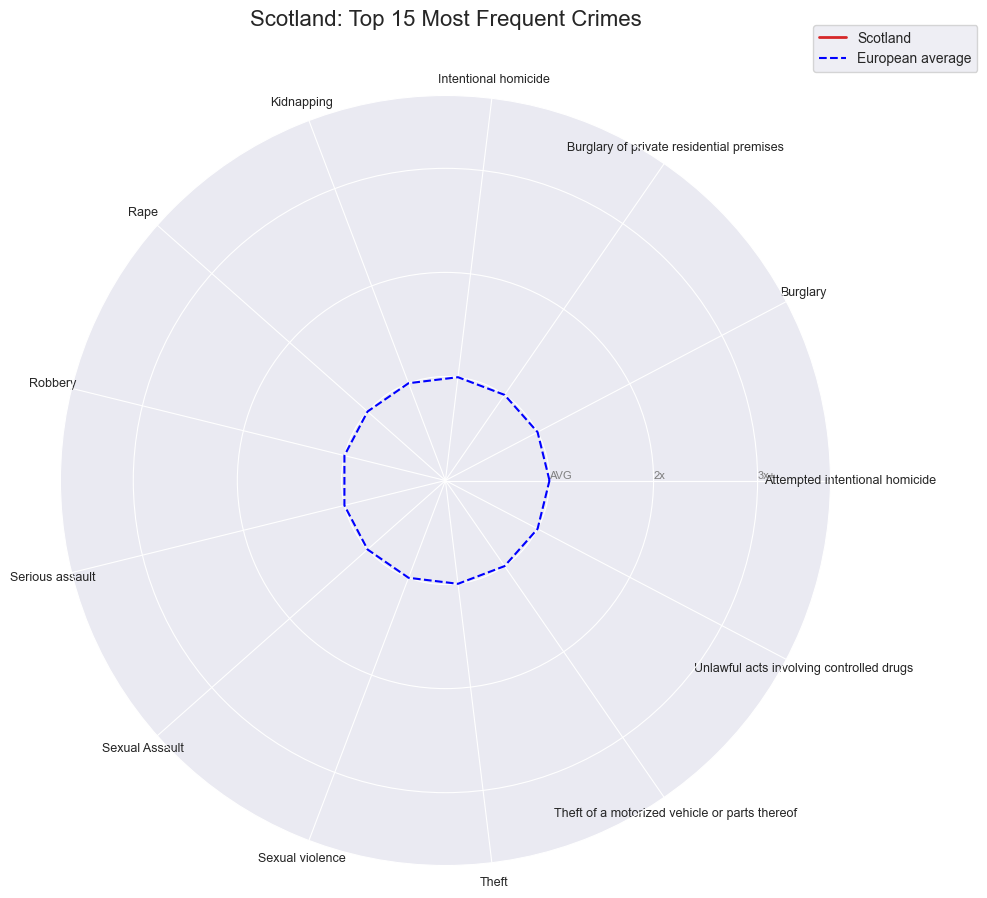

--- Serbia ---


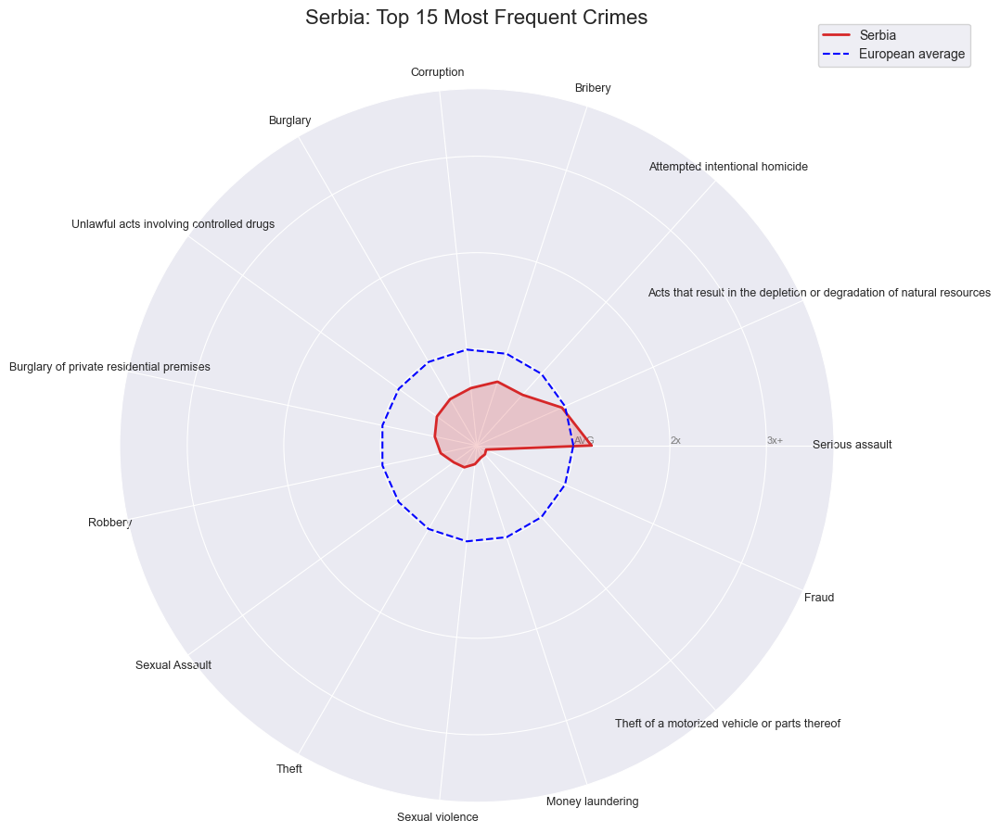

--- Slovakia ---


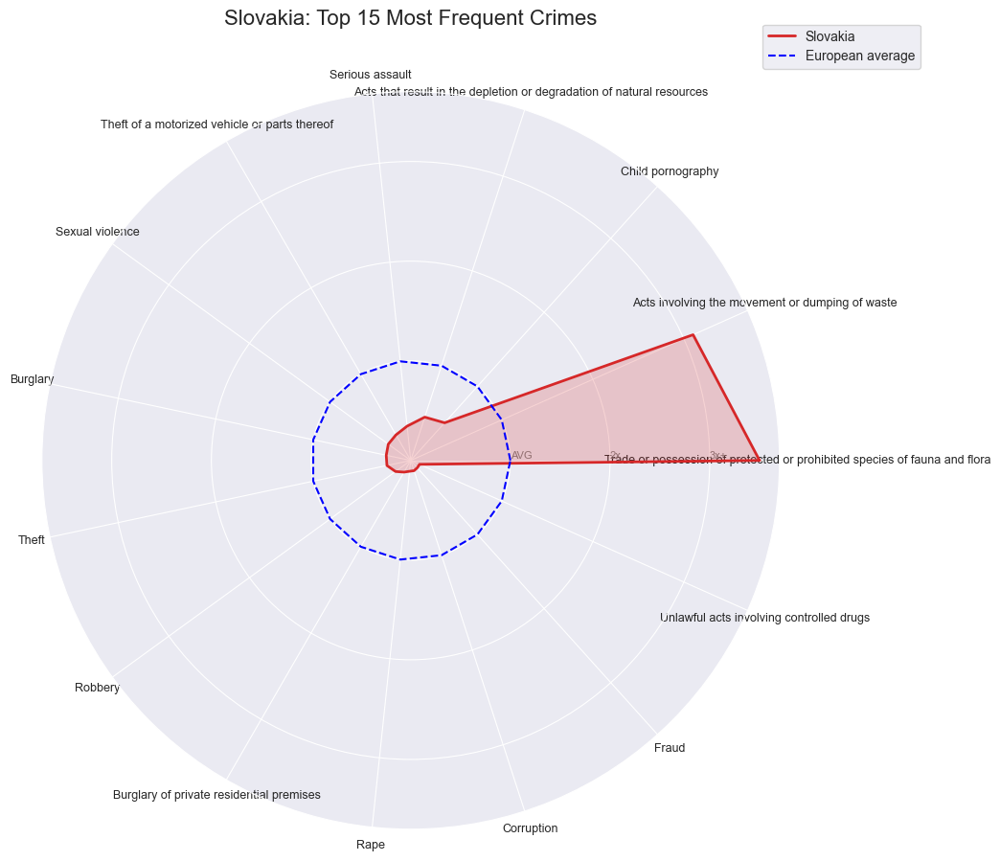

--- Slovenia ---


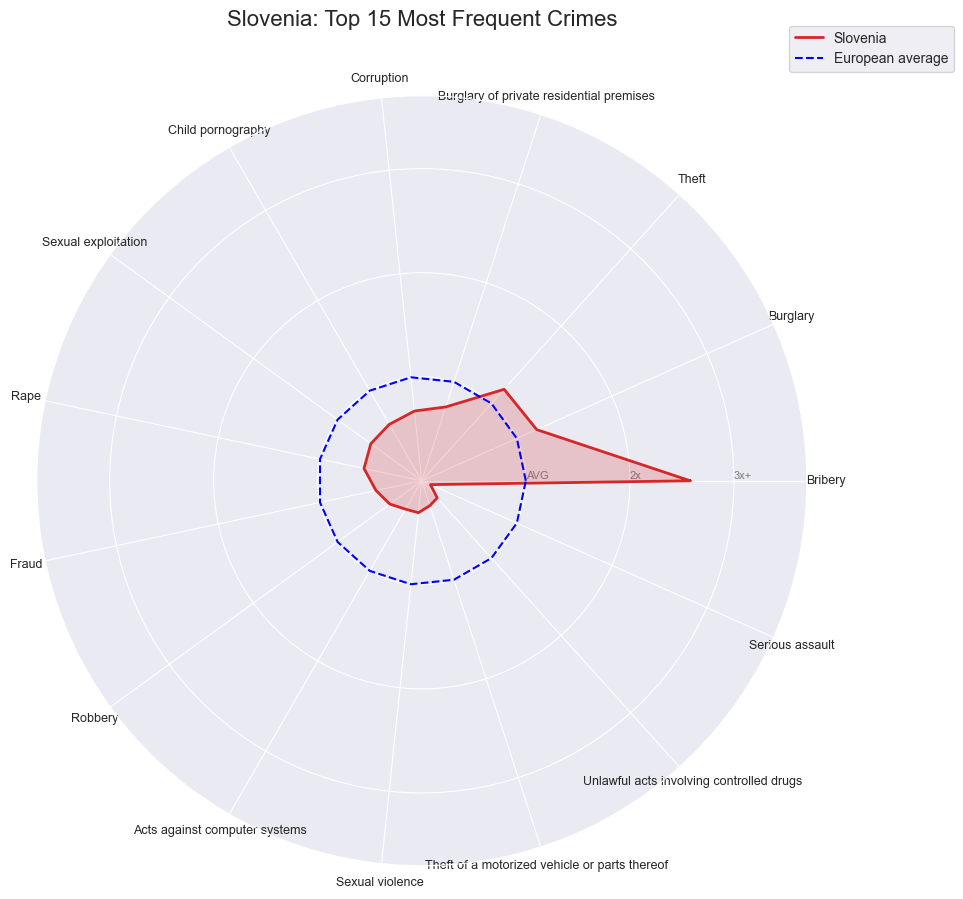

--- Spain ---


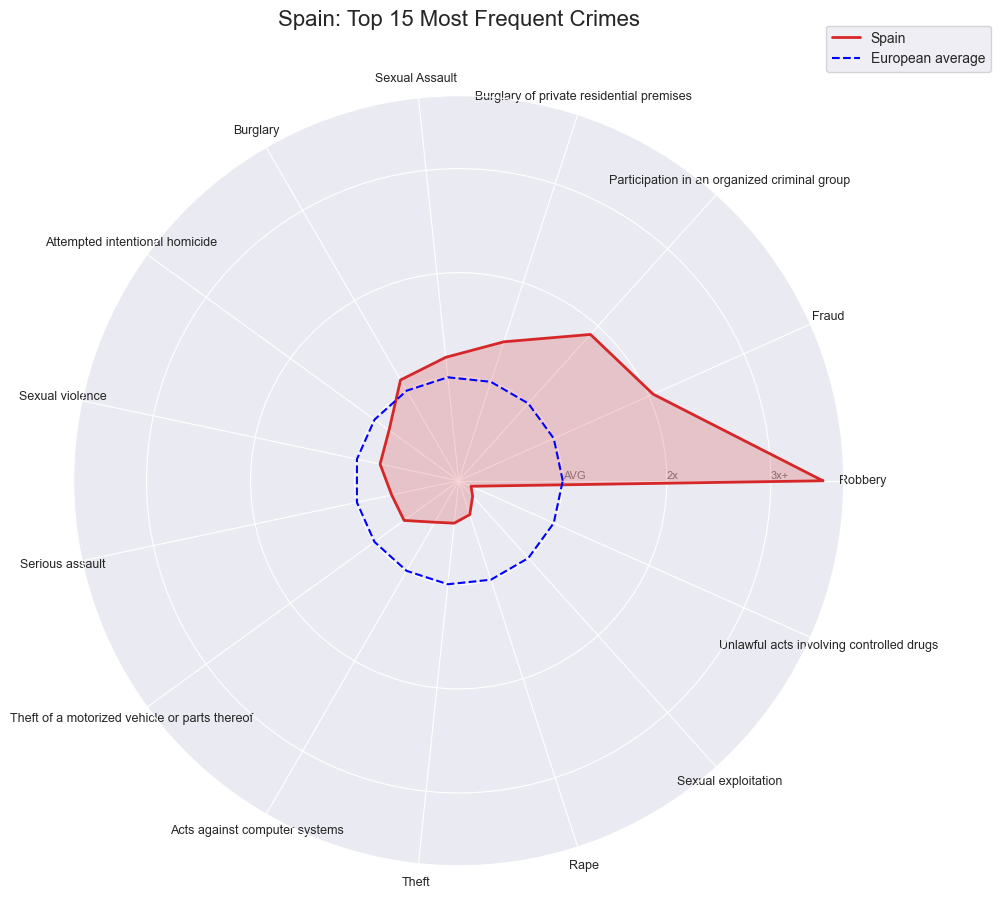

--- Sweden ---


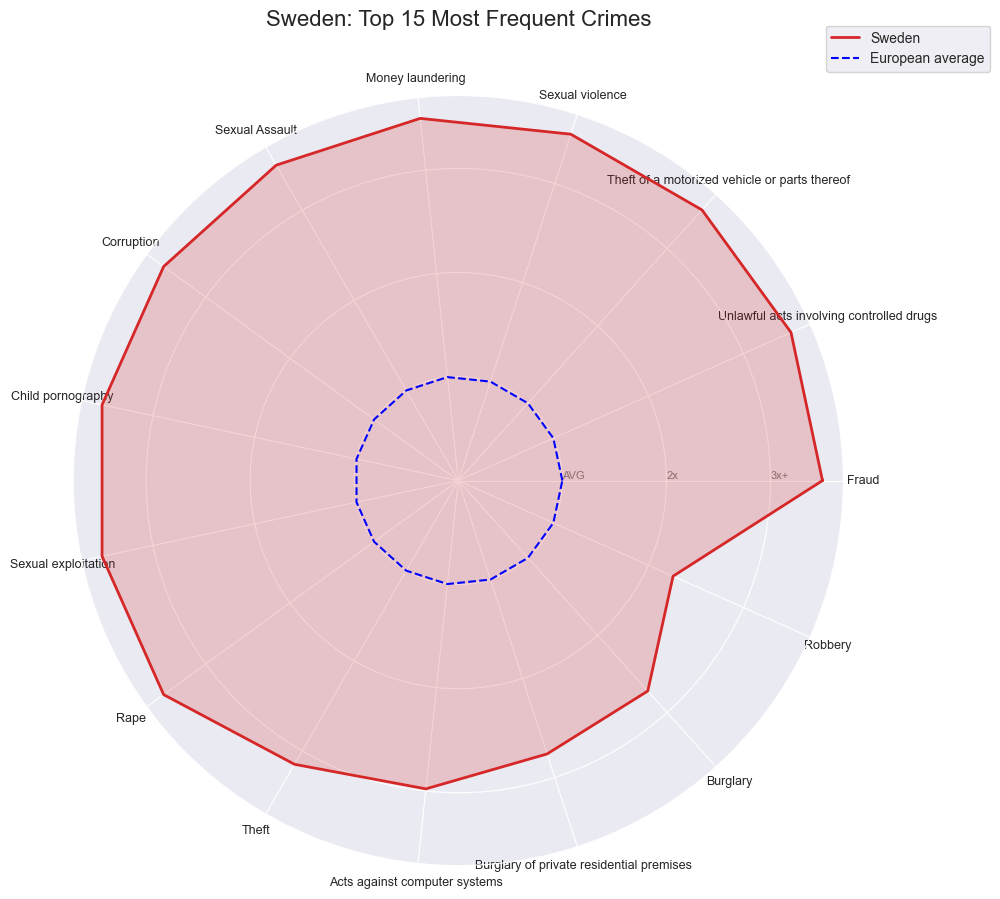

--- Switzerland ---


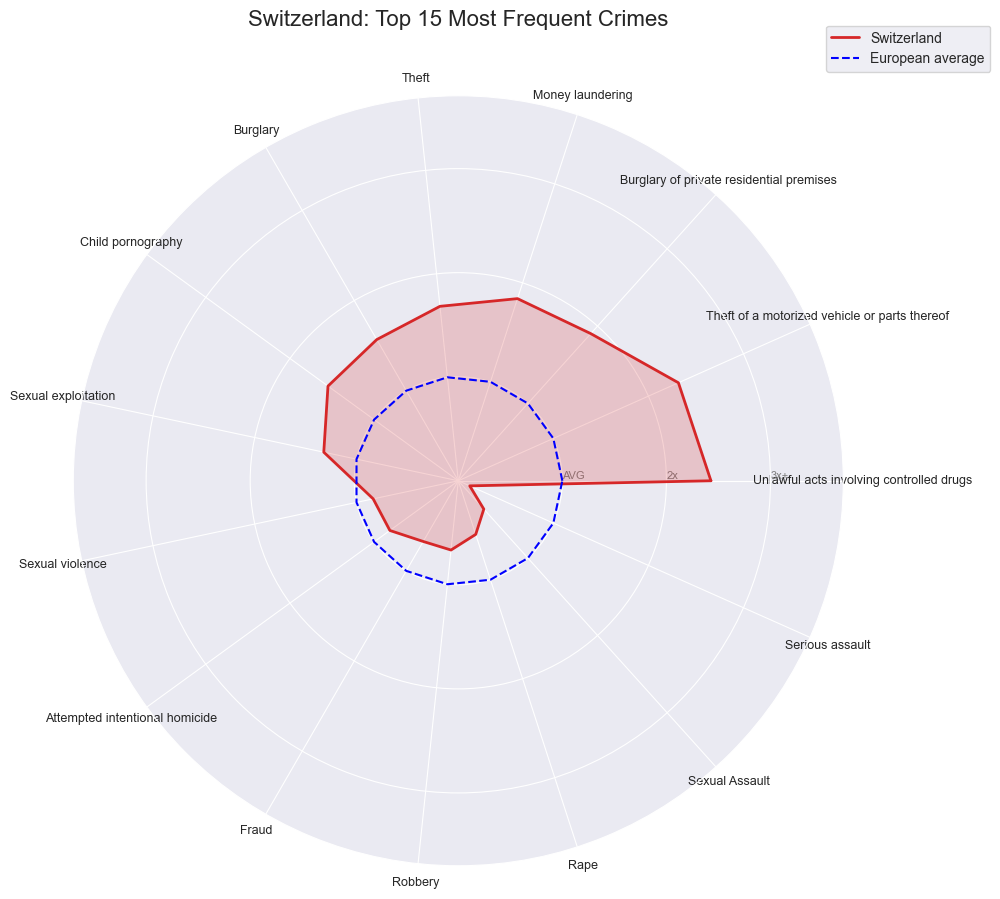

--- Turkey ---


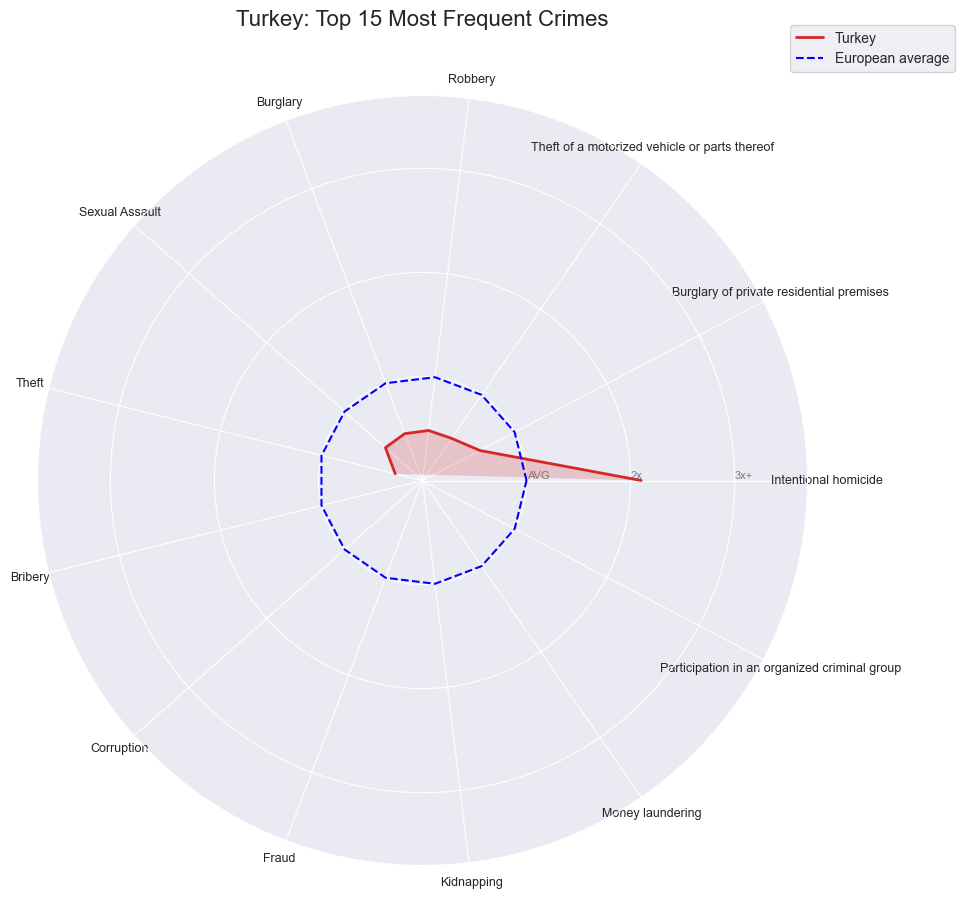

In [12]:
import numpy as np
import matplotlib.pyplot as plt

def riigi_profiil_top15(riik):
    subset = merged[merged['geo'] == riik].copy() # võtan riigi andmed
    # valin 15 top kuritegu
    subset = subset.sort_values(by='value', ascending=False).head(15)

    # indeks = Riik / Euroopa
    subset['index_score'] = (subset['value'] / subset['euro_avg'])
    piir = 3.5
    subset['index_score'] = subset['index_score'].clip(upper=piir)

    # sort. index järgi
    subset = subset.sort_values(by='index_score', ascending=False)
    categories = subset['iccs'].tolist()
    values = subset['index_score'].tolist()

    N = len(categories) #radari mata.
    if N < 3: return #ei saa joonistada radarit, kui on vähem kui 3 punkti

    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    values += values[:1]
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

    #riik=punane
    ax.plot(angles, values, linewidth=2, linestyle='solid', color='#d62728', label=riik)
    ax.fill(angles, values, '#d62728', alpha=0.2)

    # euroopa keskmine=sinine
    ax.plot(angles, [1.0]*len(angles), linewidth=1.5, linestyle='--', color='blue', label='European average')


    plt.xticks(angles[:-1], categories, size=9)

    ax.set_rlabel_position(0)
    plt.yticks([1.0, 2.0, 3.0], ["AVG", "2x", "3x+"], color="grey", size=8)
    plt.ylim(0, piir + 0.2)

    plt.title(f'{riik}: Top 15 Most Frequent Crimes', size=16, y=1.08)
    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))

    plt.show()

#Tsükkel
kõik_riigid = merged['geo'].unique() # nimekiri kõigist riikidest
kõik_riigid.sort()

for riik in kõik_riigid:
    print(f"--- {riik} ---")
    riigi_profiil_top15(riik)